In [ ]:
import tensorflow
import tensorflow as tf
from tensorflow.keras.layers import Layer
from tensorflow import keras
from math import sqrt
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import GRU
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras.utils import plot_model
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import time

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# load dataset
df_tata_steel = pd.read_csv('/content/drive/MyDrive/Capstone Data/TATA_STEEL.csv', header=0)
df_tcs = pd.read_csv('/content/drive/MyDrive/Capstone Data/TCS.csv', header=0)
df_sbi = pd.read_csv('/content/drive/MyDrive/Capstone Data/SBI.csv', header=0)
df_reliance = pd.read_csv('/content/drive/MyDrive/Capstone Data/RELIANCE.csv', header=0)
df_nifty = pd.read_csv('/content/drive/MyDrive/Capstone Data/NIFTY50.csv', header=0)
df_sp = pd.read_csv('/content/drive/MyDrive/Capstone Data/S&P500.csv', header=0)
df_microsoft = pd.read_csv('/content/drive/MyDrive/Capstone Data/MICROSOFT.csv', header=0)
df_maruti_suzuki = pd.read_csv('/content/drive/MyDrive/Capstone Data/MARUTI.csv', header=0)
df_mahindra = pd.read_csv('/content/drive/MyDrive/Capstone Data/MAHINDRA.csv', header=0)
df_jsw = pd.read_csv('/content/drive/MyDrive/Capstone Data/JSWSTEEL.csv', header=0)
df_infosys = pd.read_csv('/content/drive/MyDrive/Capstone Data/INFOSYS.csv', header=0)
df_itc = pd.read_csv('/content/drive/MyDrive/Capstone Data/ITC.csv', header=0)
df_hul = pd.read_csv('/content/drive/MyDrive/Capstone Data/HUL.csv', header=0)
df_hdfc = pd.read_csv('/content/drive/MyDrive/Capstone Data/HDFC.csv', header=0)


In [ ]:
# Dictionary of datasets
datasets = {
    'Tata Steel': df_tata_steel,
    'Tata Consultancy Services': df_tcs,
    'State Bank of India': df_sbi,
    'Reliance Industries': df_reliance,
    'NIFTY': df_nifty,
    'S&P': df_sp,
    'Microsoft Corp': df_microsoft,
    'Maruti Suzuki India Limited': df_maruti_suzuki,
    'Mahindra & Mahindra Limited': df_mahindra,
    'JSW Steel Limited': df_jsw,
    'Infosys Limited': df_infosys,
    'ITC Limited': df_itc,
    'HDFC Bank Limited': df_hdfc,
    'HUL': df_hul
}

In [ ]:
# Display top 3 rows again for each dataset
for dataset_name, df in datasets.items():
    print(f"Top 3 rows after inserting new row with date 2018-01-01 for {dataset_name}:\n")
    print(df.head(3))
    print("\n")

Top 3 rows after inserting new row with date 2018-01-01 for Tata Steel:

       Close       High        Low       Open    Volume        Date
0  57.710384  58.765187  57.494628  58.533446  19249201  01-01-2018
1  58.277733  58.433555  57.155005  57.854214  25896915  02-01-2018
2  58.729221  58.932992  58.433561  58.493488  27654851  03-01-2018


Top 3 rows after inserting new row with date 2018-01-01 for Tata Consultancy Services:

         Close         High          Low         Open   Volume        Date
0  1164.032959  1185.680359  1159.369041  1180.180506  1351760  01-01-2018
1  1157.696777  1174.592386  1152.856908  1170.368457  1920290  02-01-2018
2  1160.975098  1174.328786  1157.697206  1158.049218  1257120  03-01-2018


Top 3 rows after inserting new row with date 2018-01-01 for State Bank of India:

        Close        High         Low        Open    Volume        Date
0  293.903534  299.310741  293.137893  297.253134  12182400  01-01-2018
1  290.218994  295.721910  288.400645

In [ ]:
# Iterate through the datasets dictionary and print the shape of each DataFrame
for name, df in datasets.items():
    print(f"Shape of {name}: {df.shape}")

Shape of Tata Steel: (1236, 6)
Shape of Tata Consultancy Services: (1236, 6)
Shape of State Bank of India: (1236, 6)
Shape of Reliance Industries: (1236, 6)
Shape of NIFTY: (1232, 6)
Shape of S&P: (1259, 6)
Shape of Microsoft Corp: (1259, 6)
Shape of Maruti Suzuki India Limited: (1236, 6)
Shape of Mahindra & Mahindra Limited: (1236, 6)
Shape of JSW Steel Limited: (1236, 6)
Shape of Infosys Limited: (1236, 6)
Shape of ITC Limited: (1236, 6)
Shape of HDFC Bank Limited: (1236, 6)
Shape of HUL: (1236, 6)


In [ ]:
# Define a function to convert date format
#def convert_date_format(df):
    #df['Date'] = pd.to_datetime(df['Date']).dt.strftime('%Y-%m-%d')
    #return df

# Update date format for NIFTY and S&P datasets
#datasets['NIFTY'] = convert_date_format(datasets['NIFTY'])
#datasets['S&P'] = convert_date_format(datasets['S&P'])

In [ ]:
# New row data for each dataset
new_rows = {

    'NIFTY': {'Date': '01-01-2018', 'Open': 10477.54980, 'High': 10495.20020, 'Low': 10404.65039, 'Close': 10442.2002, 'Volume': 153400.0},
    'S&P': {'Date': '01-01-2018', 'Open': 2683.729980, 'High': 2695.889893, 'Low': 2682.360107, 'Close': 2695.810059, 'Volume': 3397430000.0},
    'Microsoft Corp': {'Date': '01-01-2018', 'Open': 80.248634, 'High': 80.416343, 'Low': 79.661656, 'Close': 80.080925, 'Volume': 22483800.0},
}

# Insert new rows for each dataset
for dataset_name, new_row_data in new_rows.items():
    df = datasets[dataset_name]
    df.loc[-1] = new_row_data
    df.index = df.index + 1
    df = df.sort_index()
    datasets[dataset_name] = df

# Display top 3 rows again for each dataset
for dataset_name, df in datasets.items():
    print(f"Top 3 rows after inserting new row with date 2018-01-01 for {dataset_name}:\n")
    print(df.head(3))
    print("\n")

Top 3 rows after inserting new row with date 2018-01-01 for Tata Steel:

       Close       High        Low       Open    Volume        Date
0  57.710384  58.765187  57.494628  58.533446  19249201  01-01-2018
1  58.277733  58.433555  57.155005  57.854214  25896915  02-01-2018
2  58.729221  58.932992  58.433561  58.493488  27654851  03-01-2018


Top 3 rows after inserting new row with date 2018-01-01 for Tata Consultancy Services:

         Close         High          Low         Open   Volume        Date
0  1164.032959  1185.680359  1159.369041  1180.180506  1351760  01-01-2018
1  1157.696777  1174.592386  1152.856908  1170.368457  1920290  02-01-2018
2  1160.975098  1174.328786  1157.697206  1158.049218  1257120  03-01-2018


Top 3 rows after inserting new row with date 2018-01-01 for State Bank of India:

        Close        High         Low        Open    Volume        Date
0  293.903534  299.310741  293.137893  297.253134  12182400  01-01-2018
1  290.218994  295.721910  288.400645

In [ ]:
import pandas as pd

def process_dataframe(df):
    # Convert 'Date' column to datetime with format 'date-month-year'
    df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

    # Set 'Date' column as index
    df.set_index('Date', inplace=True)

    # Reindexing DataFrame to include all missing dates
    all_dates = pd.date_range(start=df.index.min(), end=df.index.max(), freq='D')
    df = df.reindex(all_dates)

    # Forward fill the missing values
    df = df.ffill()

    # Reset index to make 'Date' a column again
    df.reset_index(inplace=True)

    # Convert 'index' column to datetime
    df['index'] = pd.to_datetime(df['index'], format='%d-%m-%Y')

    # Set 'index' column as index
    df.set_index('index', inplace=True)

    # Remove rows corresponding to Saturdays and Sundays
    df = df[~df.index.dayofweek.isin([5, 6])]

    # Reset index
    df.reset_index(inplace=True)
    df = df.rename(columns={"index": "Date"})
    df['Date'] = df['Date'].astype(object)

    # Set 'Date' column as index
    df.set_index('Date', inplace=True)

    return df


In [ ]:
df_tata_steel = process_dataframe(df_tata_steel)
df_tcs = process_dataframe(df_tcs)
df_sbi = process_dataframe(df_sbi)
df_reliance = process_dataframe(df_reliance)
df_nifty = process_dataframe(df_nifty)
df_sp = process_dataframe(df_sp)
df_microsoft = process_dataframe(df_microsoft)
df_maruti_suzuki = process_dataframe(df_maruti_suzuki)
df_mahindra = process_dataframe(df_mahindra)
df_jsw = process_dataframe(df_jsw)
df_infosys = process_dataframe(df_infosys)
df_itc = process_dataframe(df_itc)
df_hul = process_dataframe(df_hul)
df_hdfc = process_dataframe(df_hdfc)



In [ ]:
# Dictionary of datasets
datasets = {
    'Tata Steel': df_tata_steel,
    'Tata Consultancy Services': df_tcs,
    'State Bank of India': df_sbi,
    'Reliance Industries': df_reliance,
    'NIFTY': df_nifty,
    'S&P': df_sp,
    'Microsoft Corp': df_microsoft,
    'Maruti Suzuki India Limited': df_maruti_suzuki,
    'Mahindra & Mahindra Limited': df_mahindra,
    'JSW Steel Limited': df_jsw,
    'Infosys Limited': df_infosys,
    'ITC Limited': df_itc,
    'Hindustan Unilever Ltd': df_hul,
    'HDFC Bank Limited': df_hdfc
}

In [ ]:
# Iterate through the datasets dictionary and print the shape of each DataFrame
for name, df in datasets.items():
    print(f"Shape of {name}: {df.shape}")


Shape of Tata Steel: (1305, 5)
Shape of Tata Consultancy Services: (1305, 5)
Shape of State Bank of India: (1305, 5)
Shape of Reliance Industries: (1305, 5)
Shape of NIFTY: (1305, 5)
Shape of S&P: (1305, 5)
Shape of Microsoft Corp: (1305, 5)
Shape of Maruti Suzuki India Limited: (1305, 5)
Shape of Mahindra & Mahindra Limited: (1305, 5)
Shape of JSW Steel Limited: (1305, 5)
Shape of Infosys Limited: (1305, 5)
Shape of ITC Limited: (1305, 5)
Shape of Hindustan Unilever Ltd: (1305, 5)
Shape of HDFC Bank Limited: (1305, 5)


In [ ]:
# Plotting
import matplotlib.pyplot as plt

for name, dataset in datasets.items():
    values = dataset.values
    num_columns = dataset.shape[1]  # Get the number of columns in the DataFrame
    groups = list(range(num_columns))  # Specify columns to plot
    i = 1
    # Plot each column
    plt.figure(figsize=[10.0, 8.0], dpi=350)
    for group in groups:
        plt.subplot(len(groups), 1, i)
        plt.plot(values[:, group])
        plt.title(dataset.columns[group], y=0.5, loc='right')
        i += 1
    plt.suptitle(name)
    plt.show()

In [ ]:
# split a univariate dataset into train/test sets
def split_dataset(data):
	# split into standard weeks
	train, test = data[0:-520], data[-520:]
	# restructure into windows of weekly data
	train = array(split(train, len(train)/5))
	test = array(split(test, len(test)/5))
	return train, test

# LSTM_UNI-5


In [ ]:
# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
	scores = list()
	# calculate an RMSE score for each day
	for i in range(actual.shape[1]):
		# calculate mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		# calculate rmse
		rmse = sqrt(mse)
		# store
		scores.append(rmse)
	# calculate overall RMSE
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores

# summarize scores
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
	# flatten data
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input
		out_end = in_end + n_out
		# ensure we have enough data for this instance
		if out_end <= len(data):
			x_input = data[in_start:in_end, 0]
			x_input = x_input.reshape((len(x_input), 1))
			X.append(x_input)
			y.append(data[in_end:out_end, 0])
		# move along one time step
		in_start += 1
	return array(X), array(y)

# train the model
def uni_lstm_n_5(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# define parameters
	verbose, epochs, batch_size = 0, 20, 4
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# define model
	model = Sequential()
	model.add(LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
	model.add(Dense(100, activation='relu'))
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model

# make a forecast
def forecast(model, history, n_input):
	# flatten data
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# retrieve last observations for input data
	input_x = data[-n_input:, 0]
	# reshape into [1, n_input, 1]
	input_x = input_x.reshape((1, len(input_x), 1))
	# forecast the next week
	yhat = model.predict(input_x, verbose=0)
	# we only want the vector forecast
	yhat = yhat[0]
	return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
	# fit model
	model = uni_lstm_n_5(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# walk-forward validation over each week
	predictions = list()
	for i in range(len(test)):
		# predict the week
		yhat_sequence = forecast(model, history, n_input)
		# store the predictions
		predictions.append(yhat_sequence)
		# get real observation and add to history for predicting the next week
		history.append(test[i, :])
	# evaluate predictions days for each week
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
	return score, scores


In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = uni_lstm_n_5(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

In [ ]:
n_input = 5


In [ ]:
n_input = 5

Evaluating model for Tata Steel
LSTM_UNI-5 for Tata Steel: [7.164] 6.3, 5.0, 7.1, 7.7, 9.1
Time taken for evaluation: 52.79165816307068 seconds
Value of x for Tata Steel: 10.935633049340264


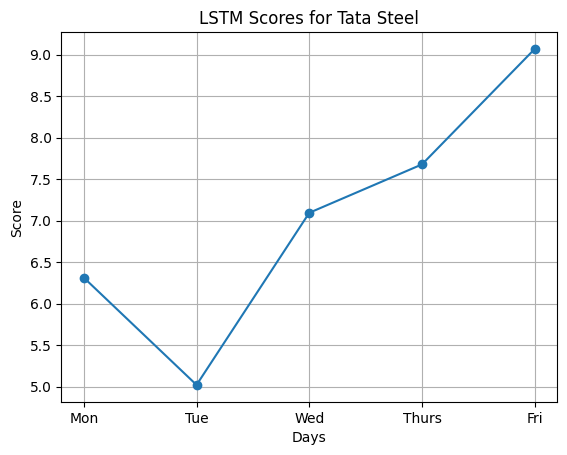

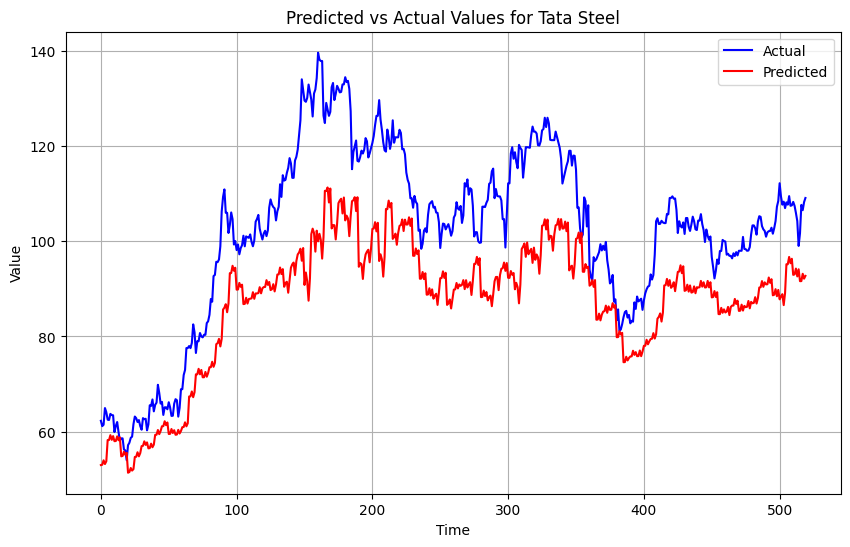

Evaluating model for Tata Consultancy Services
LSTM_UNI-5 for Tata Consultancy Services: [98.409] 61.3, 85.8, 103.5, 119.0, 111.6
Time taken for evaluation: 52.850536823272705 seconds
Value of x for Tata Consultancy Services: 4.094881267978449


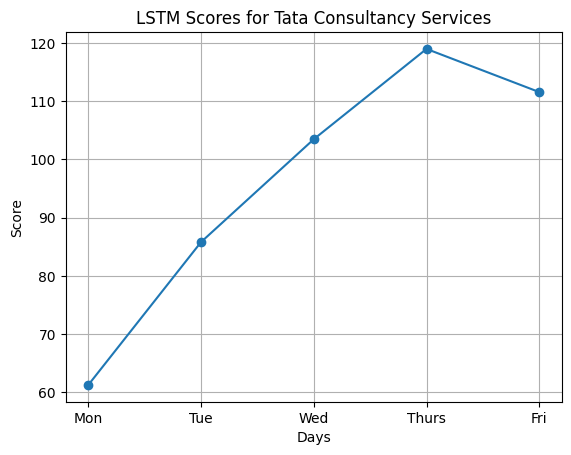

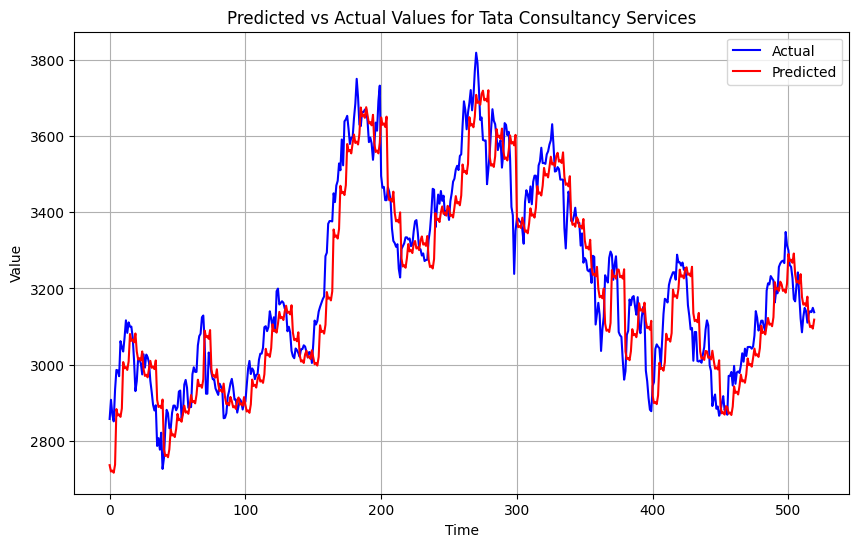

Evaluating model for State Bank of India
LSTM_UNI-5 for State Bank of India: [16.476] 14.8, 14.9, 15.0, 17.2, 19.9
Time taken for evaluation: 52.620140075683594 seconds
Value of x for State Bank of India: 4.9064916839416775


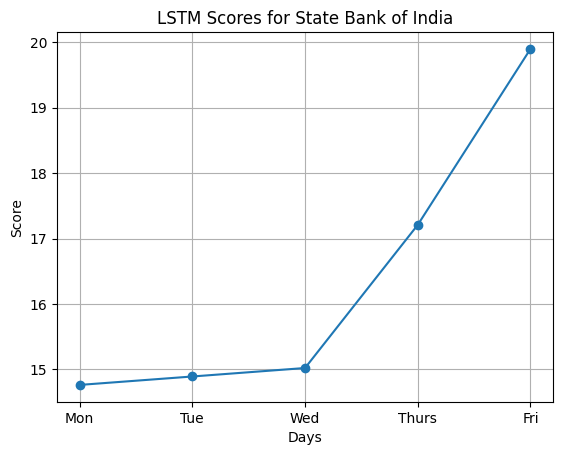

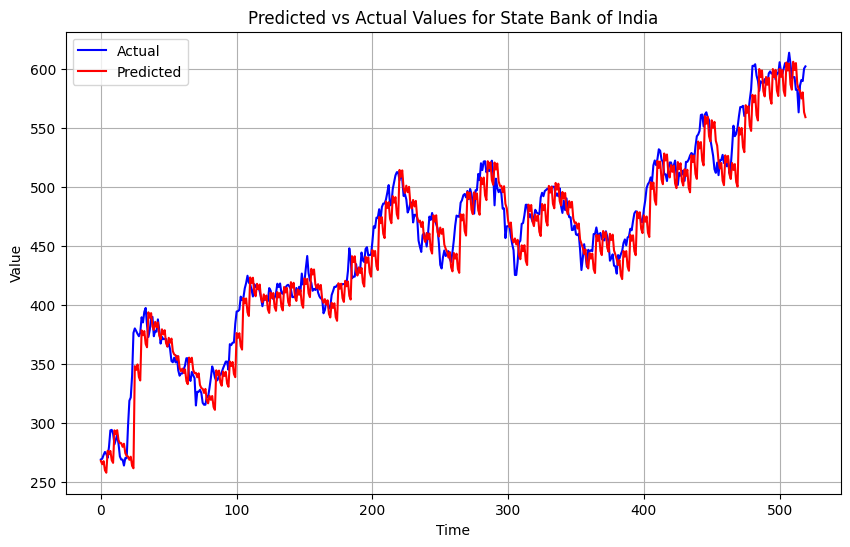

Evaluating model for Reliance Industries
LSTM_UNI-5 for Reliance Industries: [83.804] 66.2, 63.9, 86.7, 96.8, 98.9
Time taken for evaluation: 53.72670006752014 seconds
Value of x for Reliance Industries: 5.219420506928904


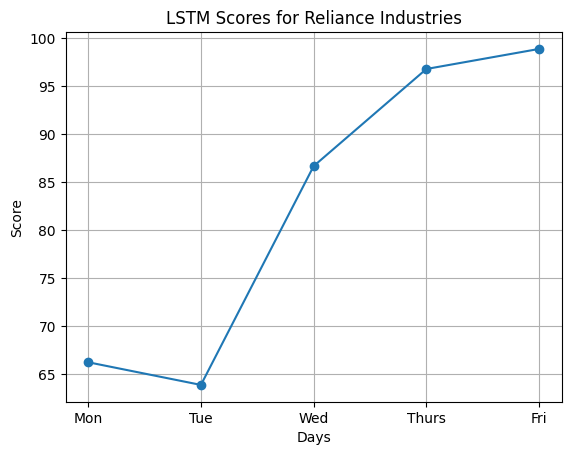

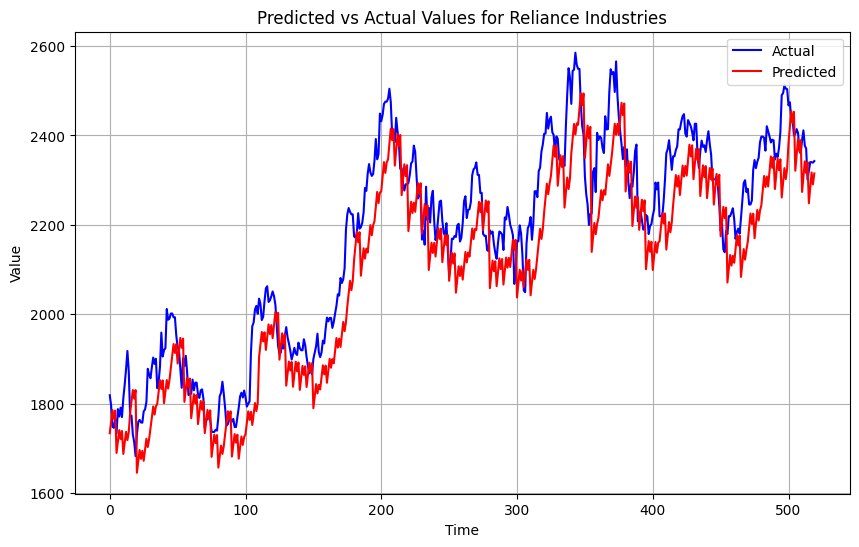

Evaluating model for NIFTY
LSTM_UNI-5 for NIFTY: [346.460] 278.8, 280.7, 318.7, 374.5, 449.3
Time taken for evaluation: 47.233540058135986 seconds
Value of x for NIFTY: 2.602507888962266


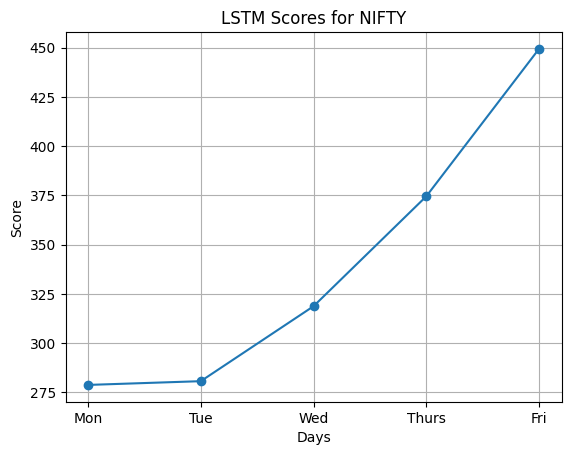

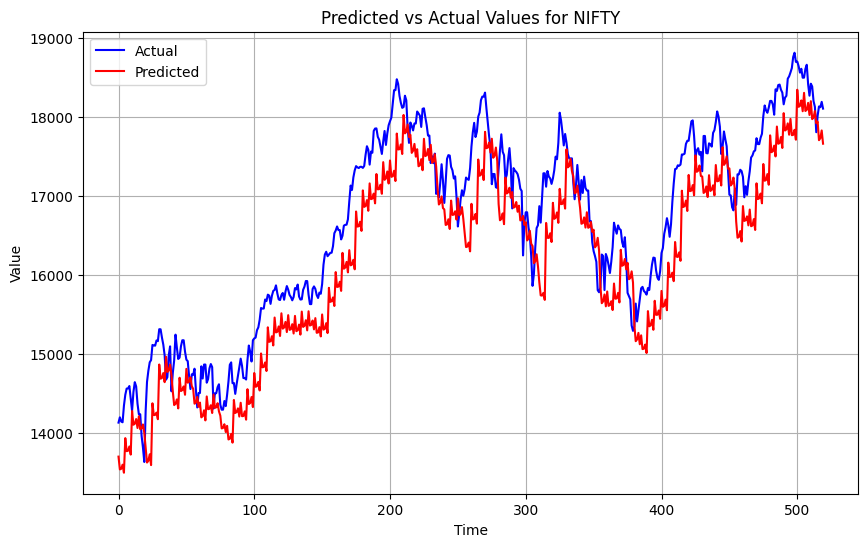

Evaluating model for S&P
LSTM_UNI-5 for S&P: [135.705] 94.3, 130.9, 145.5, 127.7, 169.1
Time taken for evaluation: 53.73252725601196 seconds
Value of x for S&P: 3.934999737700985


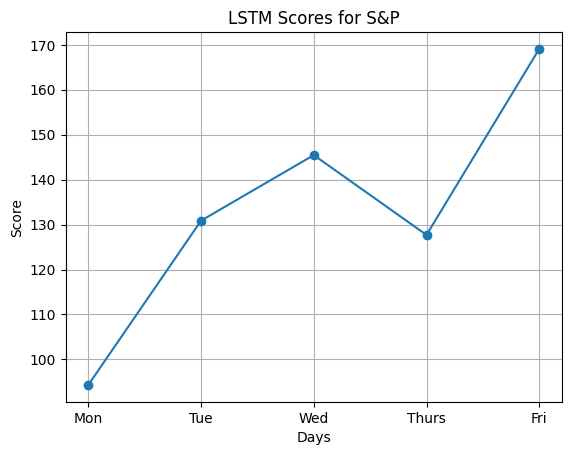

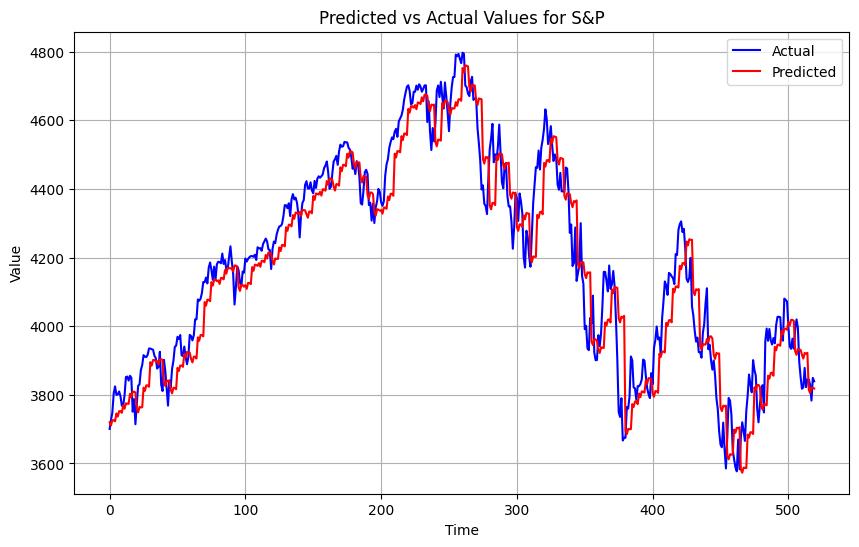

Evaluating model for Microsoft Corp
LSTM_UNI-5 for Microsoft Corp: [11.671] 14.6, 8.7, 9.9, 12.5, 11.8
Time taken for evaluation: 53.22049307823181 seconds
Value of x for Microsoft Corp: 6.210675931860784


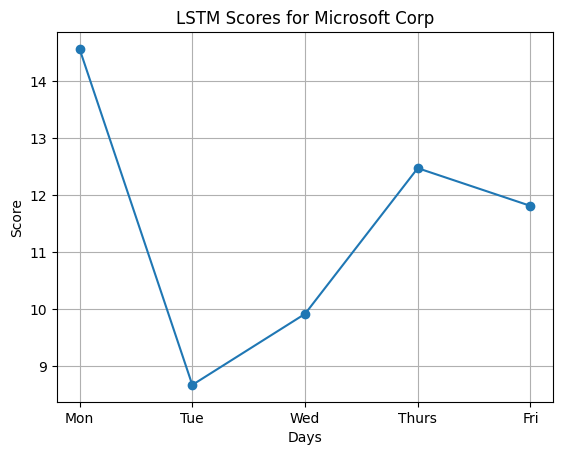

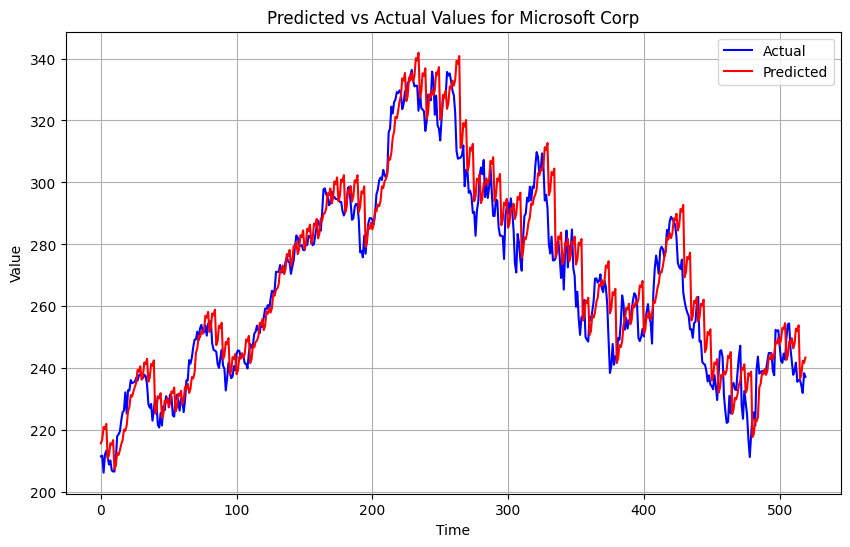

Evaluating model for Maruti Suzuki India Limited
LSTM_UNI-5 for Maruti Suzuki India Limited: [268.585] 214.7, 252.0, 244.6, 281.1, 335.0
Time taken for evaluation: 48.41157913208008 seconds
Value of x for Maruti Suzuki India Limited: 3.7125172758764404


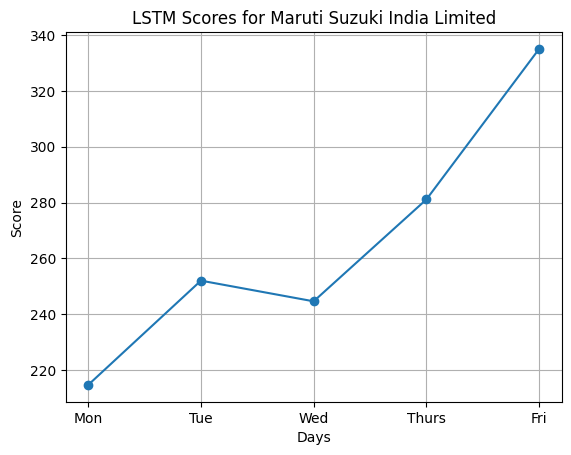

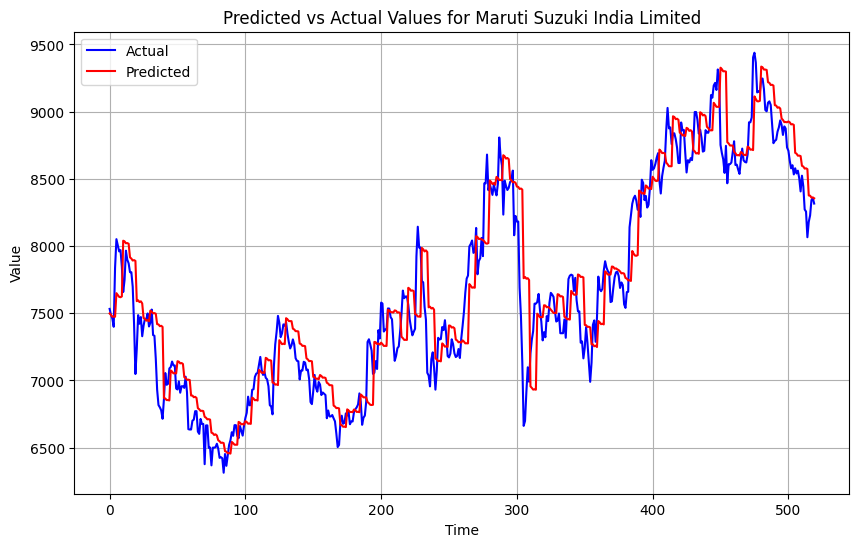

Evaluating model for Mahindra & Mahindra Limited
LSTM_UNI-5 for Mahindra & Mahindra Limited: [50.264] 31.3, 47.6, 58.3, 52.7, 56.7
Time taken for evaluation: 48.92744255065918 seconds
Value of x for Mahindra & Mahindra Limited: 6.725839089906373


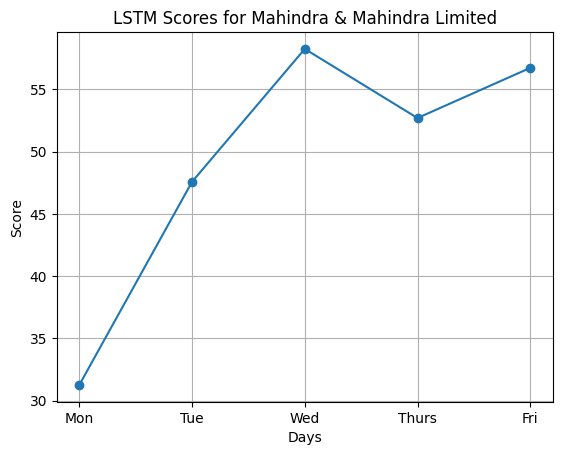

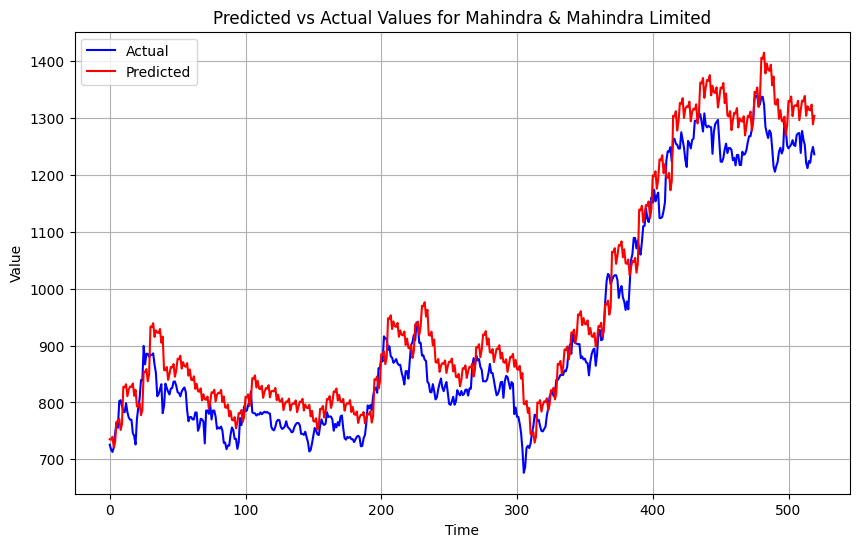

Evaluating model for JSW Steel Limited
LSTM_UNI-5 for JSW Steel Limited: [30.096] 23.0, 27.2, 27.0, 34.1, 37.0
Time taken for evaluation: 52.52589726448059 seconds
Value of x for JSW Steel Limited: 7.4367602401274295


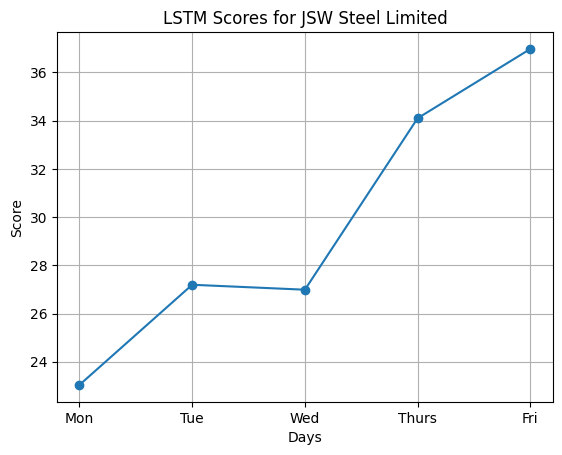

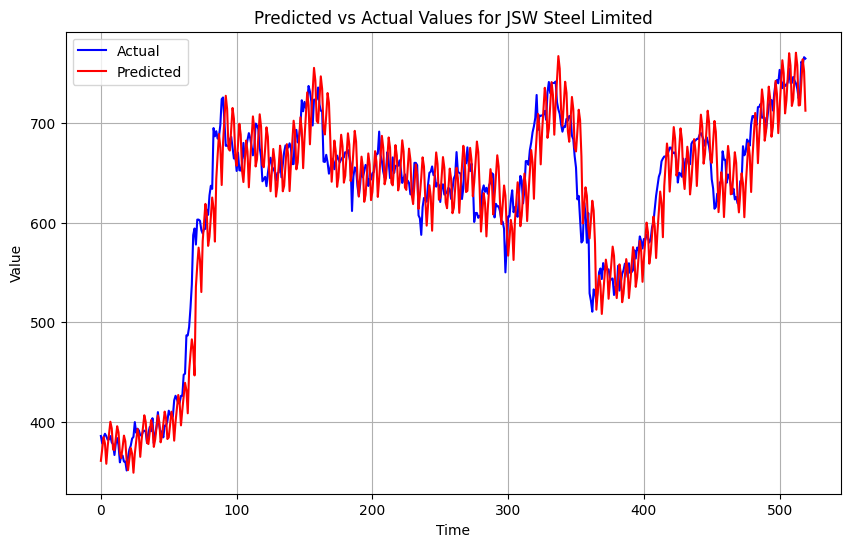

Evaluating model for Infosys Limited
LSTM_UNI-5 for Infosys Limited: [48.947] 39.8, 45.4, 45.3, 51.9, 60.0
Time taken for evaluation: 54.47550559043884 seconds
Value of x for Infosys Limited: 4.897337904071952


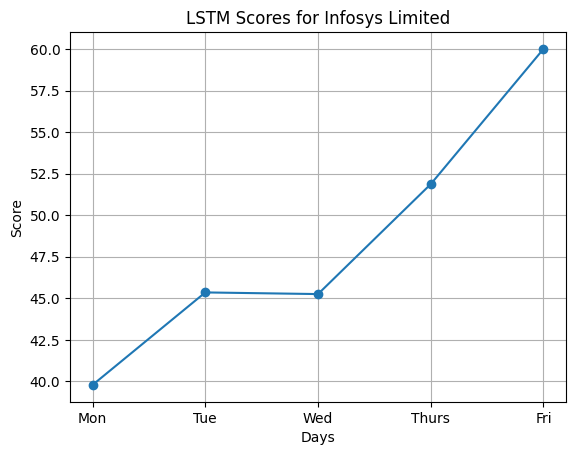

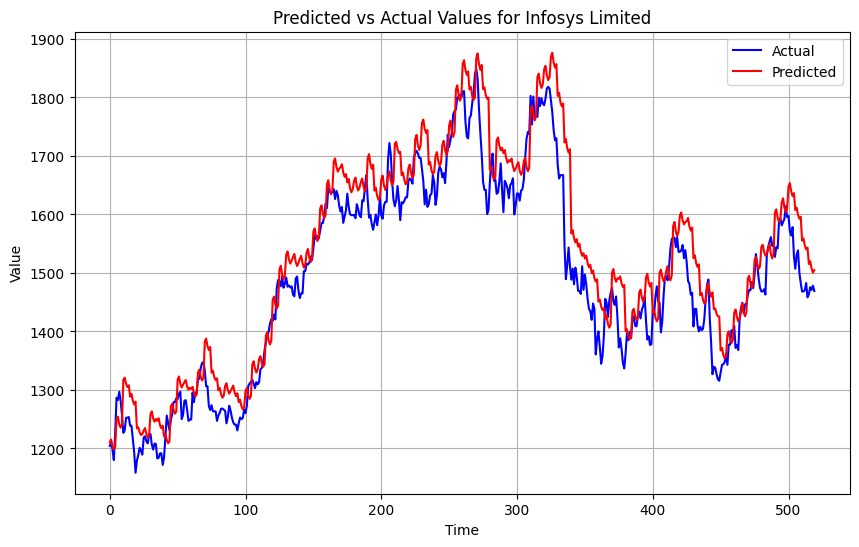

Evaluating model for ITC Limited
LSTM_UNI-5 for ITC Limited: [9.097] 7.7, 8.6, 10.1, 8.9, 9.9
Time taken for evaluation: 51.6152400970459 seconds
Value of x for ITC Limited: 4.200412080239659


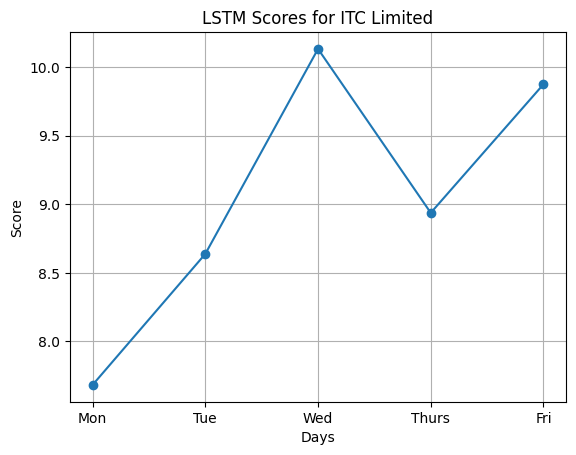

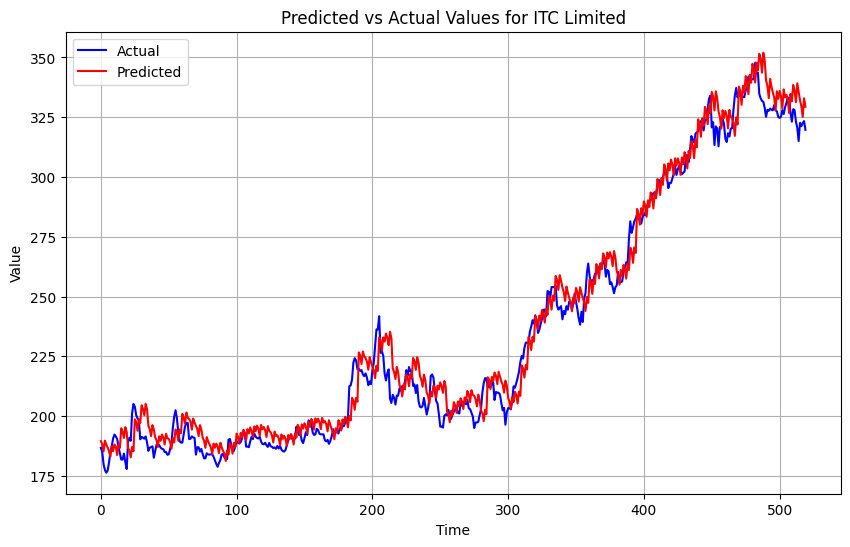

Evaluating model for Hindustan Unilever Ltd
LSTM_UNI-5 for Hindustan Unilever Ltd: [68.243] 44.4, 61.3, 68.6, 77.8, 82.5
Time taken for evaluation: 51.298625230789185 seconds
Value of x for Hindustan Unilever Ltd: 3.459237296084161


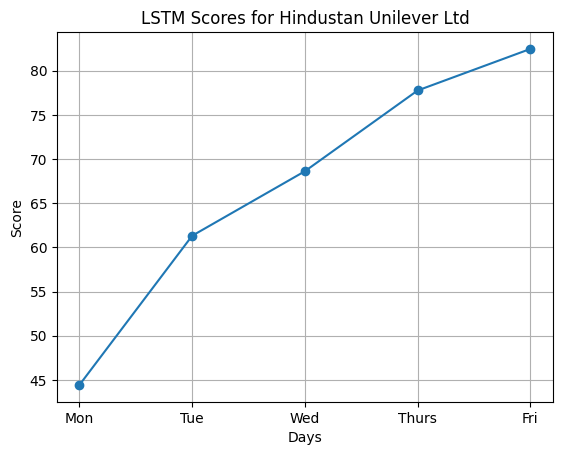

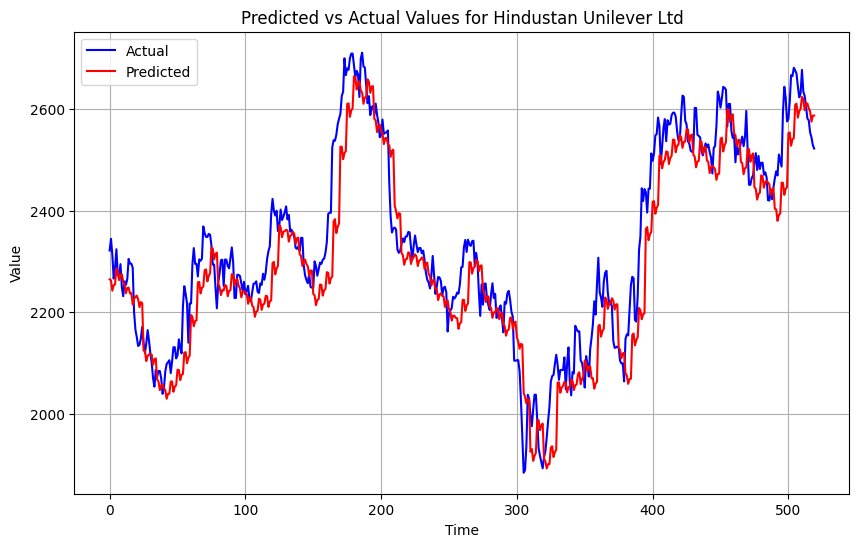

Evaluating model for HDFC Bank Limited
LSTM_UNI-5 for HDFC Bank Limited: [54.199] 47.1, 49.6, 51.4, 60.1, 61.3
Time taken for evaluation: 53.37885403633118 seconds
Value of x for HDFC Bank Limited: 4.444881723844882


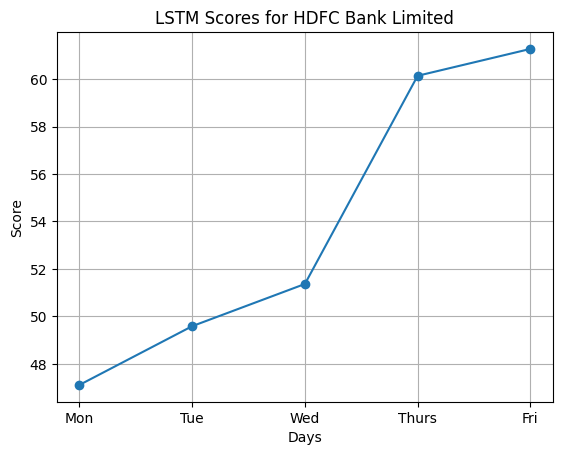

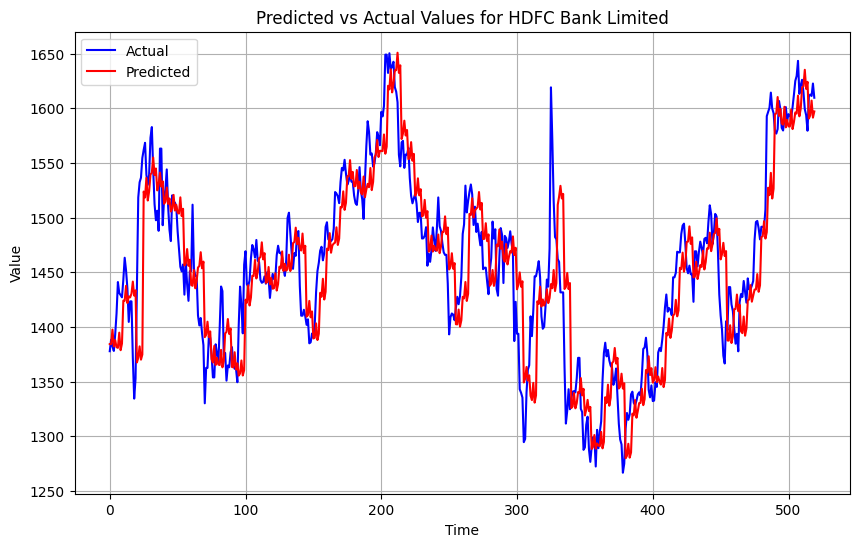

In [ ]:
import csv
import time
import matplotlib.pyplot as plt

# File path to save the results
csv_file_path = 'RESULTS_FOR_LSTM_UNI_5.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'LSTM_UNI-5 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['LSTM_UNI_5', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='LSTM')
    plt.title(f'LSTM Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'LSTM_UNI_5_{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Predicted_vs_Actual_LSTM_UNI_5_{name}.png', dpi=300)
    plt.show()

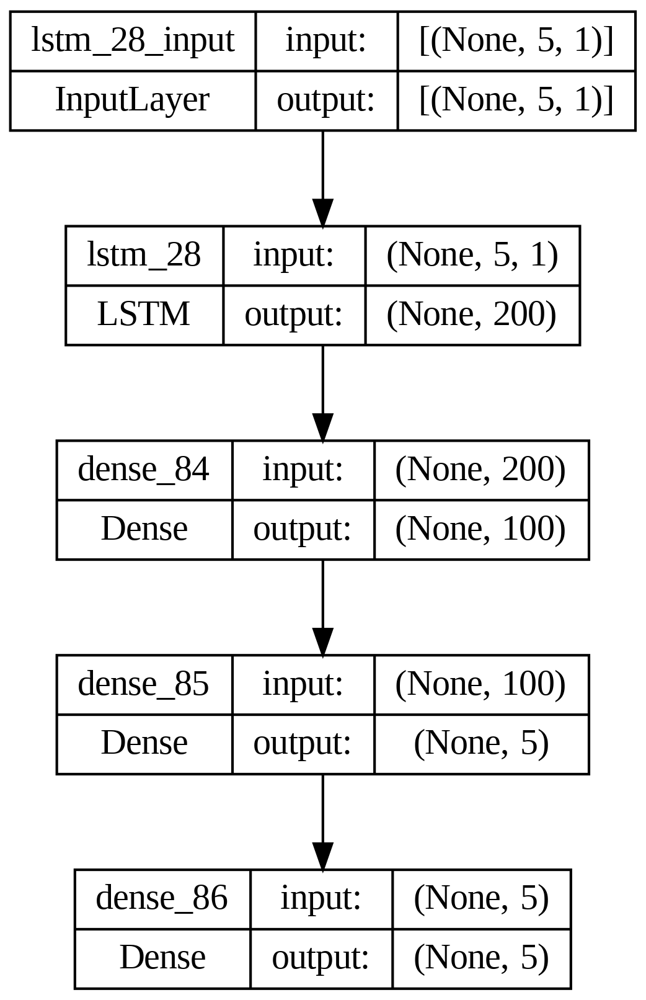

In [ ]:
model = uni_lstm_n_5(train, n_input)
plot_model(model, to_file='LSTM_UNI-5.png', dpi= 300, show_shapes=True)

In [ ]:
model.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_28 (LSTM)              (None, 200)               161600    
                                                                 
 dense_84 (Dense)            (None, 100)               20100     
                                                                 
 dense_85 (Dense)            (None, 5)                 505       
                                                                 
 dense_86 (Dense)            (None, 5)                 30        
                                                                 
Total params: 182235 (711.86 KB)
Trainable params: 182235 (711.86 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#LSTM_UNI-10

In [ ]:
# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
	scores = list()
	# calculate an RMSE score for each day
	for i in range(actual.shape[1]):
		# calculate mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		# calculate rmse
		rmse = sqrt(mse)
		# store
		scores.append(rmse)
	# calculate overall RMSE
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores

# summarize scores
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
	# flatten data
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input
		out_end = in_end + n_out
		# ensure we have enough data for this instance
		if out_end <= len(data):
			x_input = data[in_start:in_end, 0]
			x_input = x_input.reshape((len(x_input), 1))
			X.append(x_input)
			y.append(data[in_end:out_end, 0])
		# move along one time step
		in_start += 1
	return array(X), array(y)

# train the model
def uni_lstm_n_10(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# define parameters
	verbose, epochs, batch_size = 0, 20, 4
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# define model
	model = Sequential()
	model.add(LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
	model.add(Dense(100, activation='relu'))
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model

# make a forecast
def forecast(model, history, n_input):
	# flatten data
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# retrieve last observations for input data
	input_x = data[-n_input:, 0]
	# reshape into [1, n_input, 1]
	input_x = input_x.reshape((1, len(input_x), 1))
	# forecast the next week
	yhat = model.predict(input_x, verbose=0)
	# we only want the vector forecast
	yhat = yhat[0]
	return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
	# fit model
	model = uni_lstm_n_10(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# walk-forward validation over each week
	predictions = list()
	for i in range(len(test)):
		# predict the week
		yhat_sequence = forecast(model, history, n_input)
		# store the predictions
		predictions.append(yhat_sequence)
		# get real observation and add to history for predicting the next week
		history.append(test[i, :])
	# evaluate predictions days for each week
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
	return score, scores

In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = uni_lstm_n_10(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

In [ ]:
n_input = 10


In [ ]:
model.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_28 (LSTM)              (None, 200)               161600    
                                                                 
 dense_84 (Dense)            (None, 100)               20100     
                                                                 
 dense_85 (Dense)            (None, 5)                 505       
                                                                 
 dense_86 (Dense)            (None, 5)                 30        
                                                                 
Total params: 182235 (711.86 KB)
Trainable params: 182235 (711.86 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
n_input = 10

Evaluating model for Tata Steel
LSTM_UNI-10 for Tata Steel: [7.093] 7.3, 5.4, 8.2, 6.6, 7.6
Time taken for evaluation: 94.27068662643433 seconds
Value of x for Tata Steel: 10.827073728549129


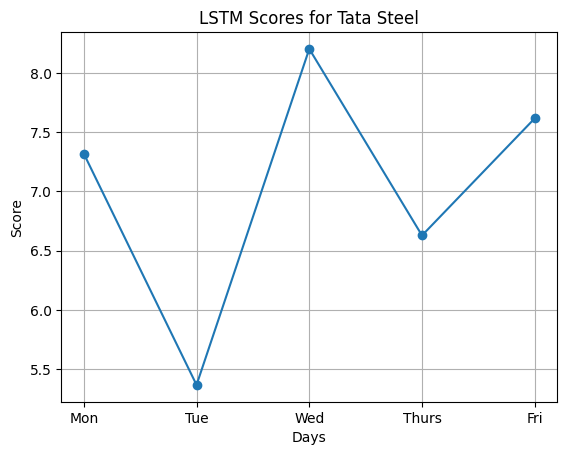

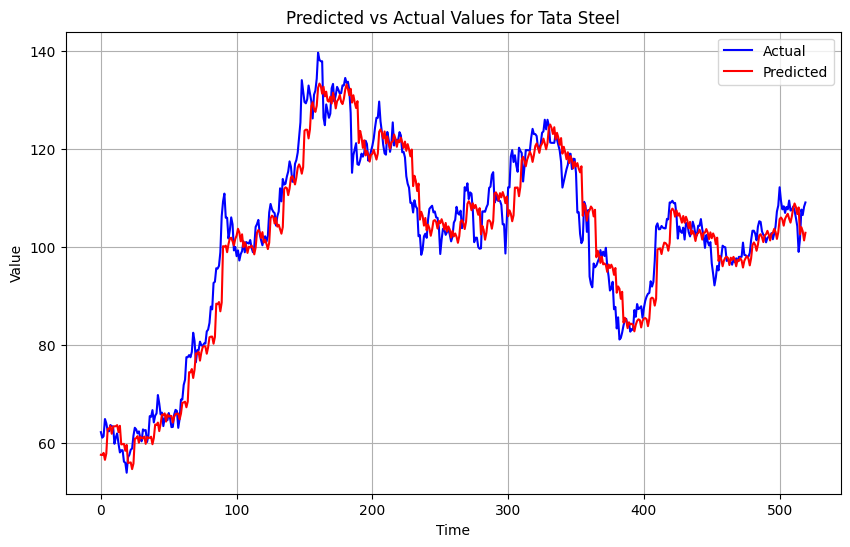

Evaluating model for Tata Consultancy Services
LSTM_UNI-10 for Tata Consultancy Services: [153.152] 147.1, 167.9, 129.5, 149.8, 168.1
Time taken for evaluation: 92.87848353385925 seconds
Value of x for Tata Consultancy Services: 6.372799534037739


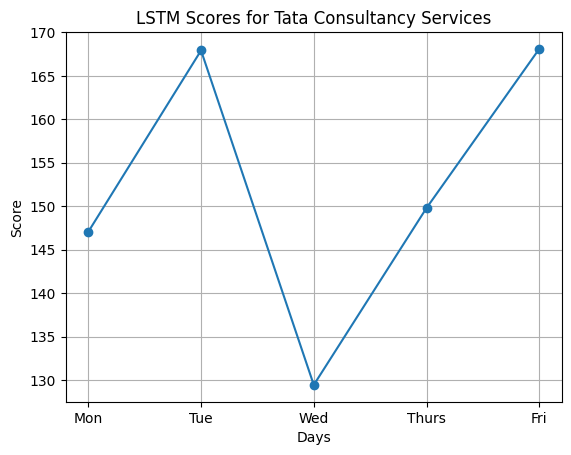

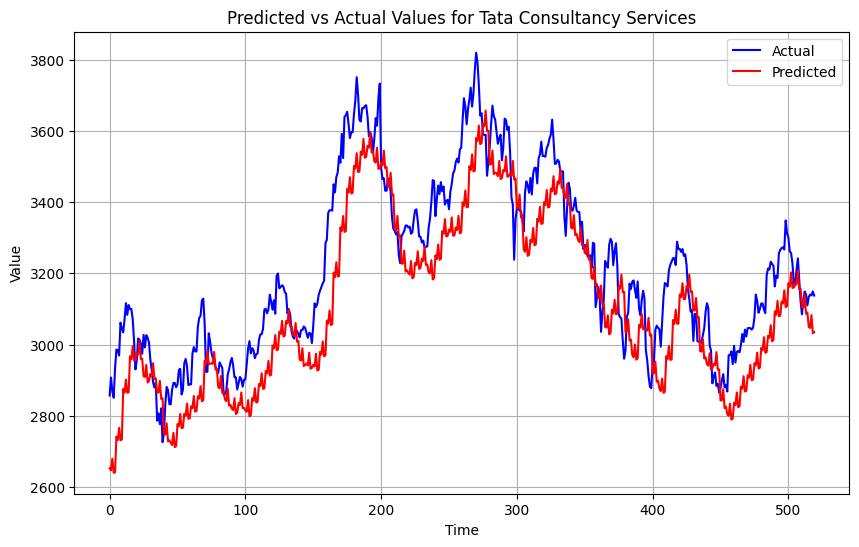

Evaluating model for State Bank of India
LSTM_UNI-10 for State Bank of India: [21.945] 17.3, 19.2, 25.1, 21.6, 25.3
Time taken for evaluation: 95.78880977630615 seconds
Value of x for State Bank of India: 6.534936545111397


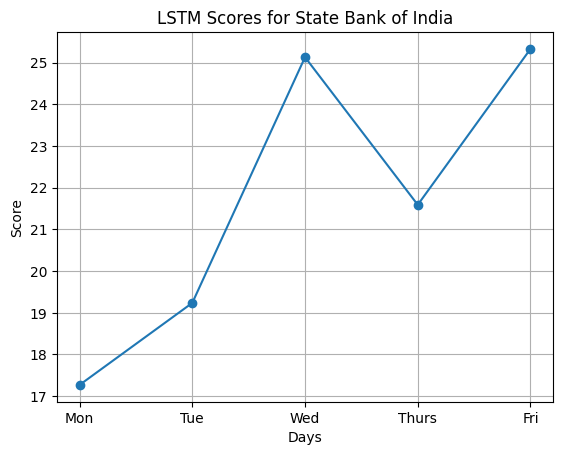

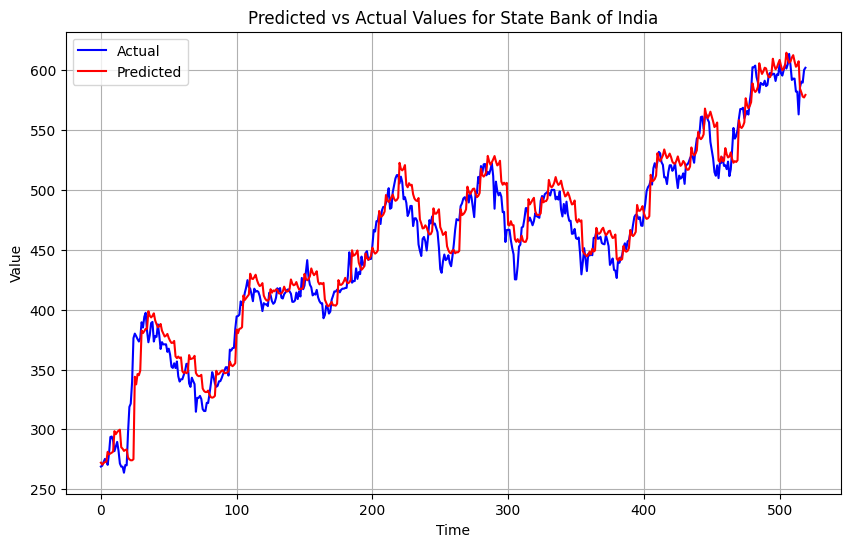

Evaluating model for Reliance Industries
LSTM_UNI-10 for Reliance Industries: [112.785] 92.9, 115.9, 99.4, 125.4, 126.2
Time taken for evaluation: 94.1984179019928 seconds
Value of x for Reliance Industries: 7.024382113098827


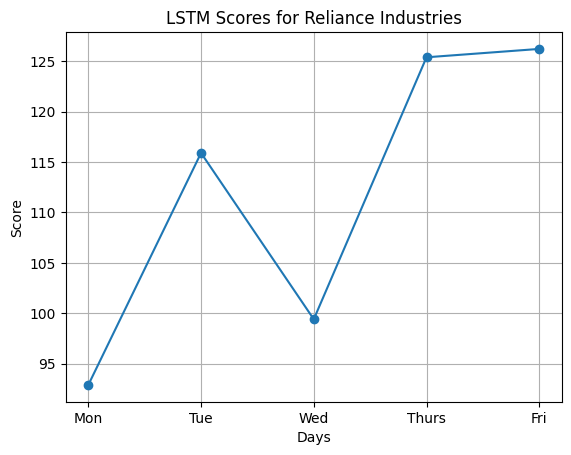

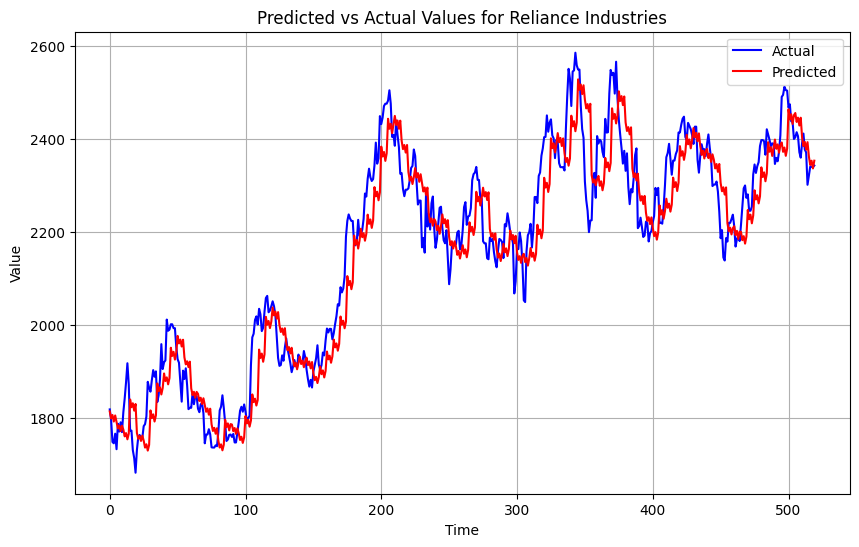

Evaluating model for NIFTY
LSTM_UNI-10 for NIFTY: [502.011] 510.2, 461.7, 479.7, 515.3, 539.4
Time taken for evaluation: 94.41739392280579 seconds
Value of x for NIFTY: 3.7709567163414532


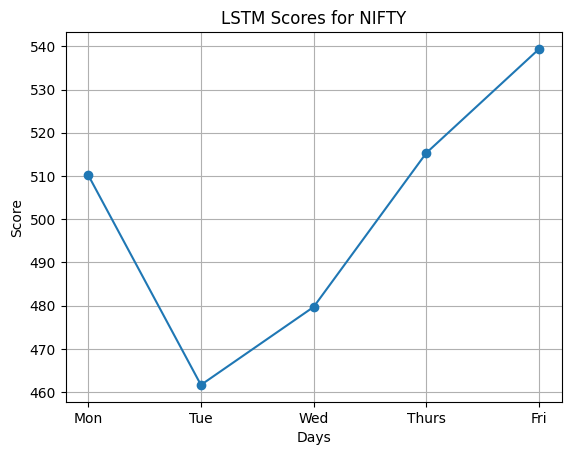

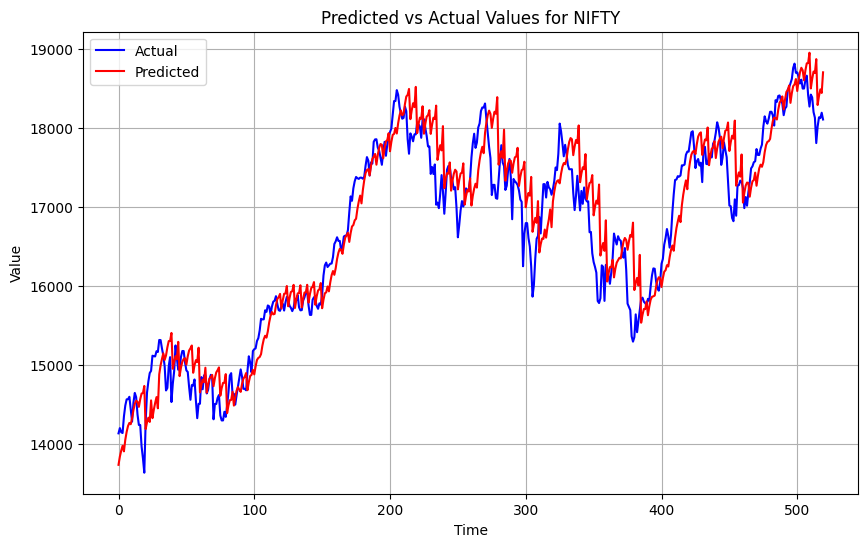

Evaluating model for S&P
LSTM_UNI-10 for S&P: [110.027] 89.1, 94.2, 100.0, 130.8, 128.9
Time taken for evaluation: 67.95625305175781 seconds
Value of x for S&P: 3.1904087791745668


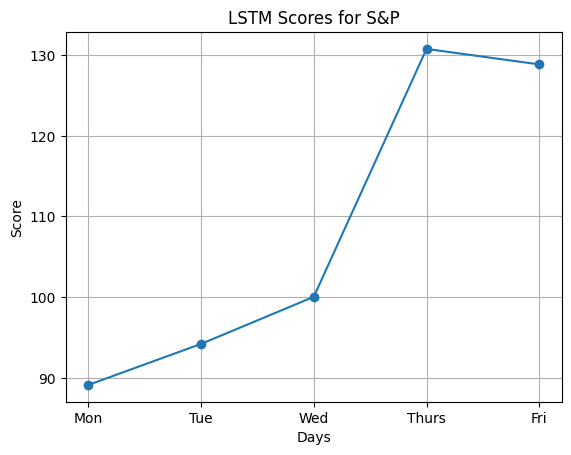

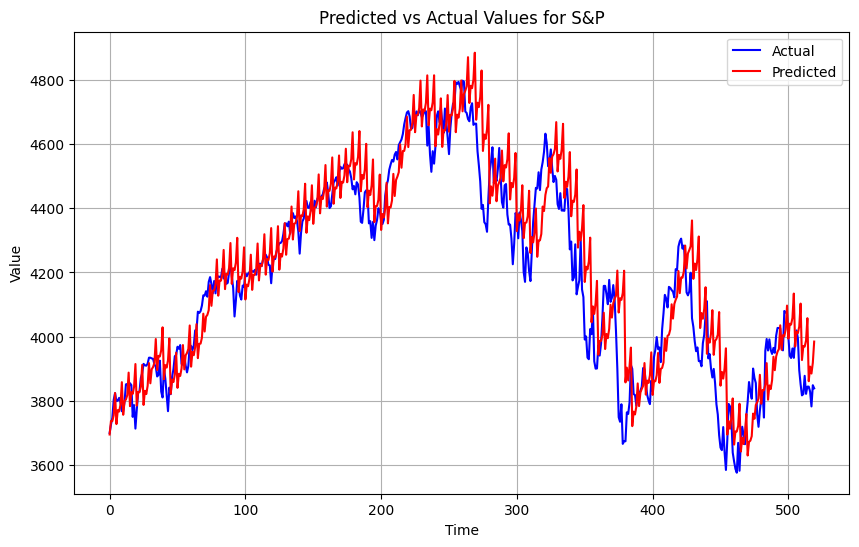

Evaluating model for Microsoft Corp
LSTM_UNI-10 for Microsoft Corp: [13.550] 12.9, 14.5, 10.2, 11.3, 17.6
Time taken for evaluation: 94.77420425415039 seconds
Value of x for Microsoft Corp: 7.210452569419848


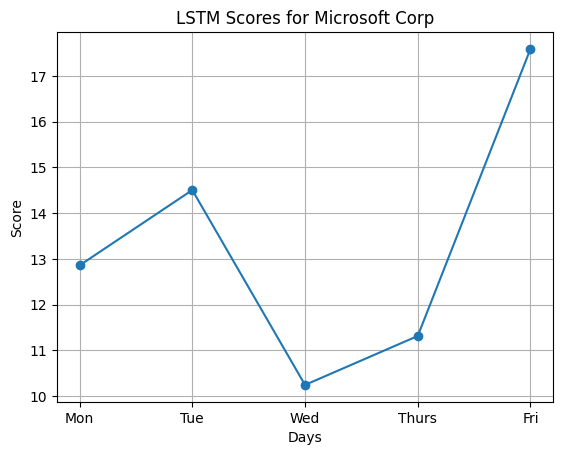

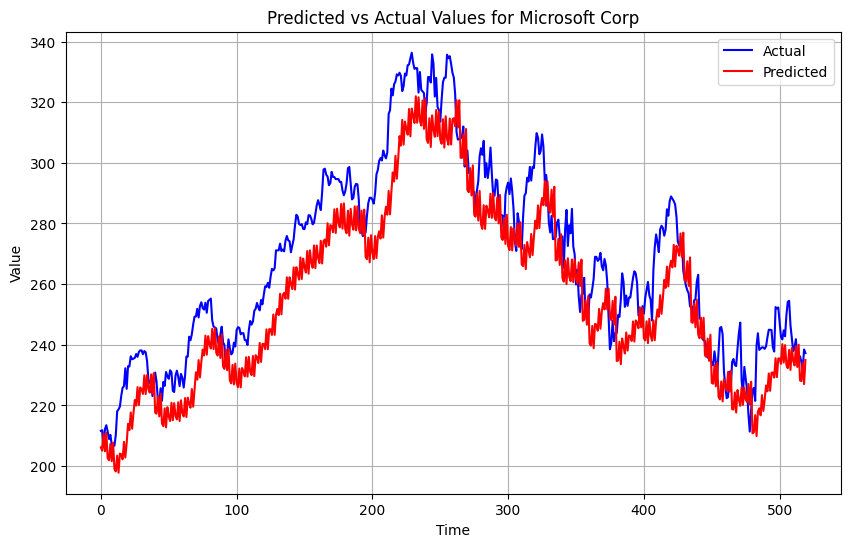

Evaluating model for Maruti Suzuki India Limited
LSTM_UNI-10 for Maruti Suzuki India Limited: [330.027] 315.6, 266.9, 301.6, 357.7, 393.5
Time taken for evaluation: 93.14321374893188 seconds
Value of x for Maruti Suzuki India Limited: 4.561797184704636


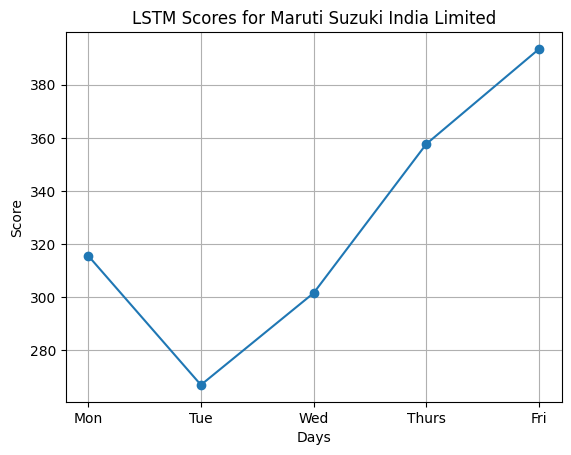

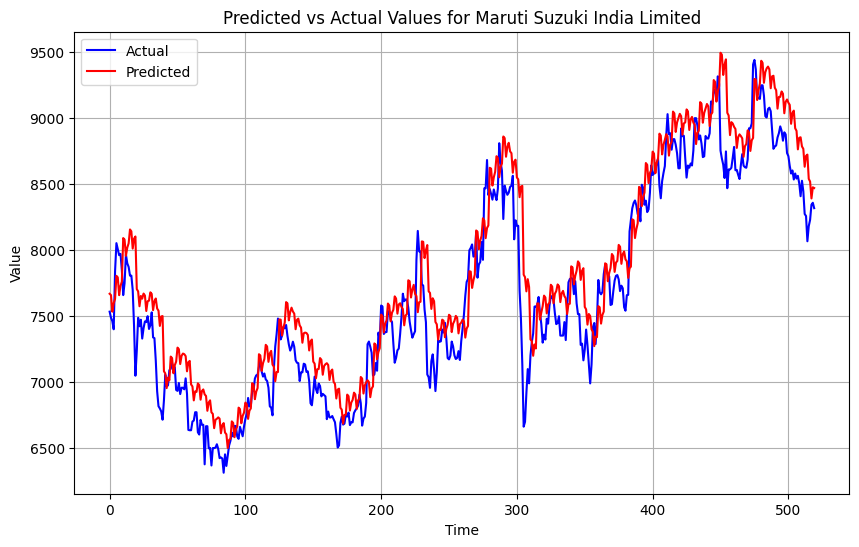

Evaluating model for Mahindra & Mahindra Limited
LSTM_UNI-10 for Mahindra & Mahindra Limited: [52.042] 46.0, 48.1, 46.9, 57.1, 60.4
Time taken for evaluation: 94.04576230049133 seconds
Value of x for Mahindra & Mahindra Limited: 6.963781390370522


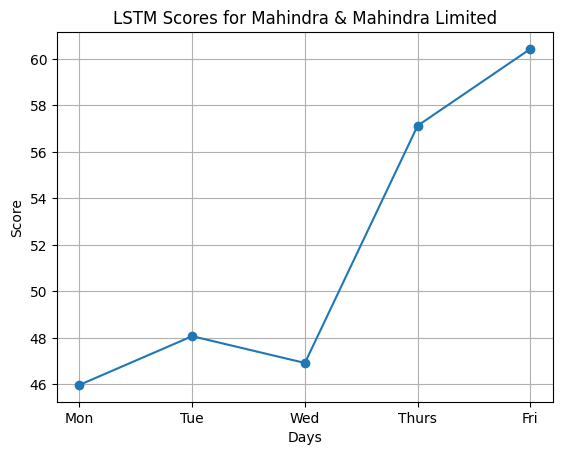

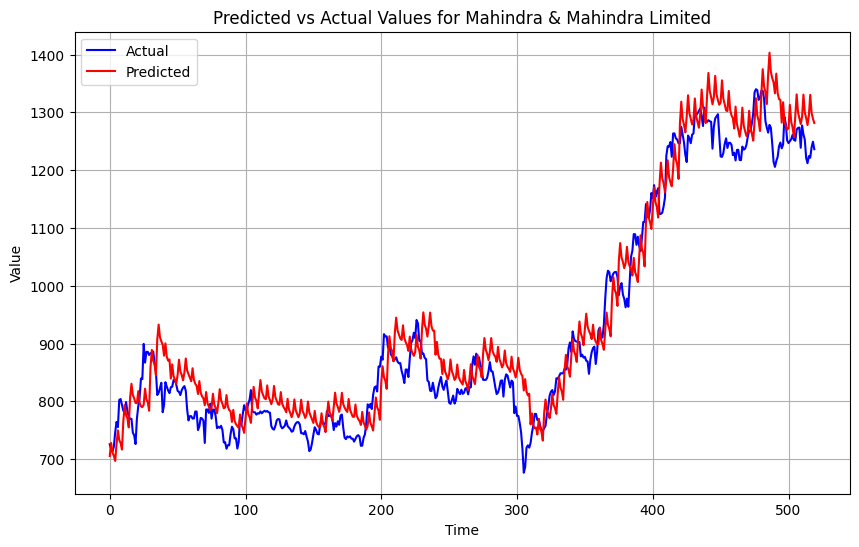

Evaluating model for JSW Steel Limited
LSTM_UNI-10 for JSW Steel Limited: [43.223] 37.6, 39.6, 42.4, 46.4, 49.1
Time taken for evaluation: 95.82740545272827 seconds
Value of x for JSW Steel Limited: 10.680617978795615


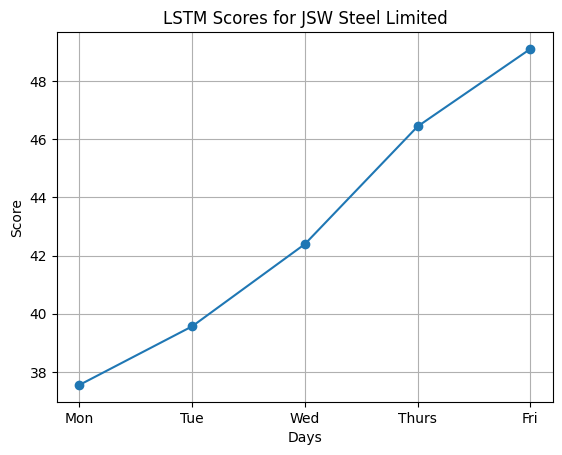

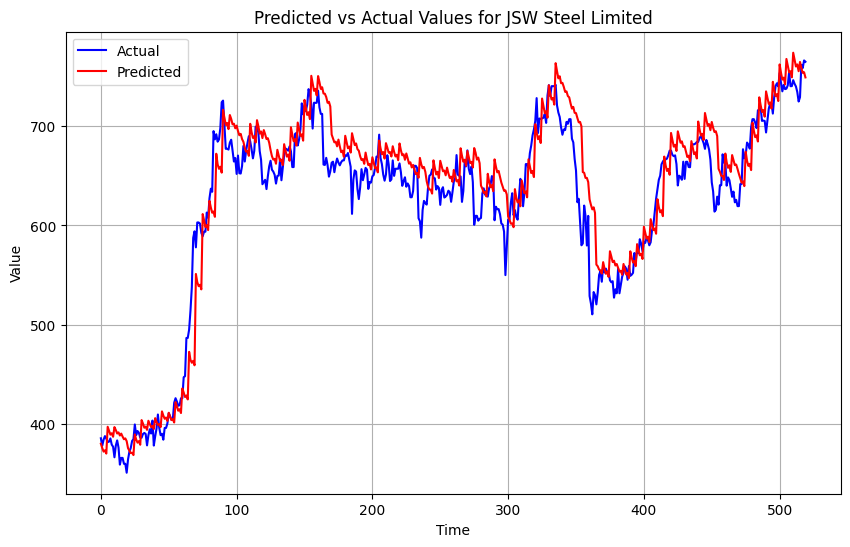

Evaluating model for Infosys Limited
LSTM_UNI-10 for Infosys Limited: [57.159] 49.4, 48.2, 60.3, 59.8, 66.1
Time taken for evaluation: 65.79231238365173 seconds
Value of x for Infosys Limited: 5.718958765172566


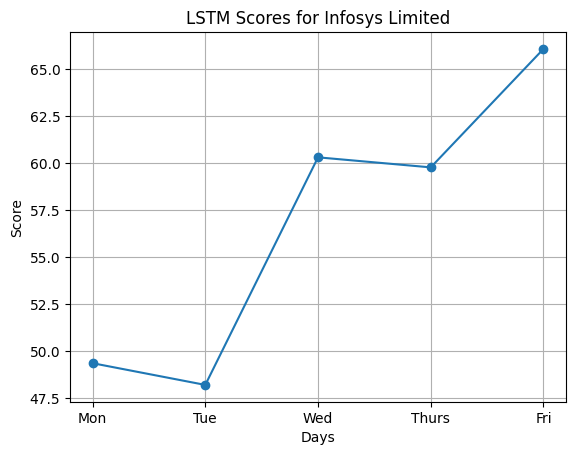

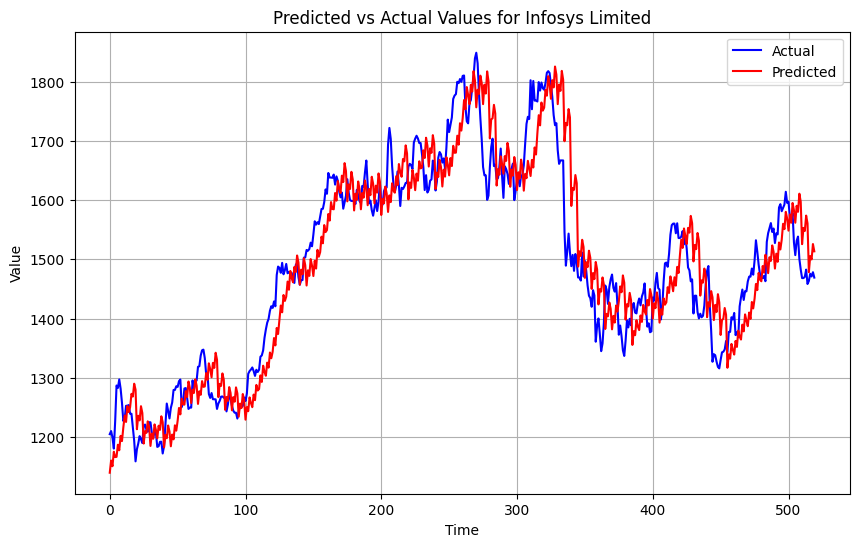

Evaluating model for ITC Limited
LSTM_UNI-10 for ITC Limited: [11.578] 9.6, 11.9, 11.8, 13.1, 11.3
Time taken for evaluation: 64.41129875183105 seconds
Value of x for ITC Limited: 5.346016608632153


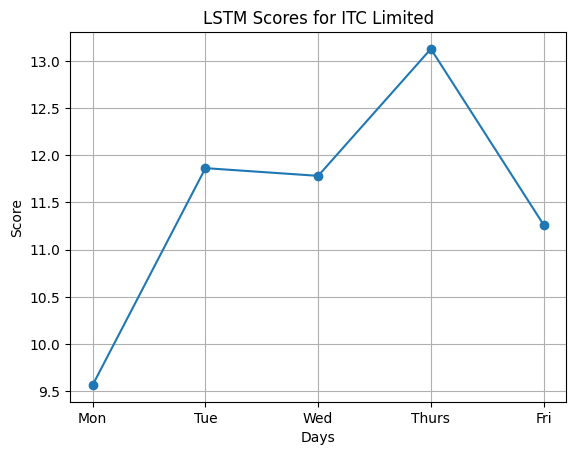

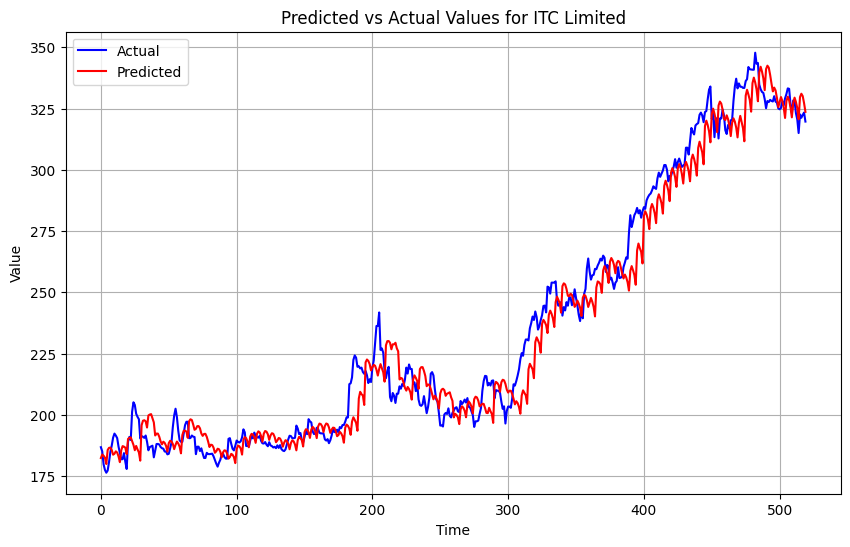

Evaluating model for Hindustan Unilever Ltd
LSTM_UNI-10 for Hindustan Unilever Ltd: [79.900] 60.3, 76.1, 76.9, 82.5, 98.9
Time taken for evaluation: 93.92053771018982 seconds
Value of x for Hindustan Unilever Ltd: 4.050163056955813


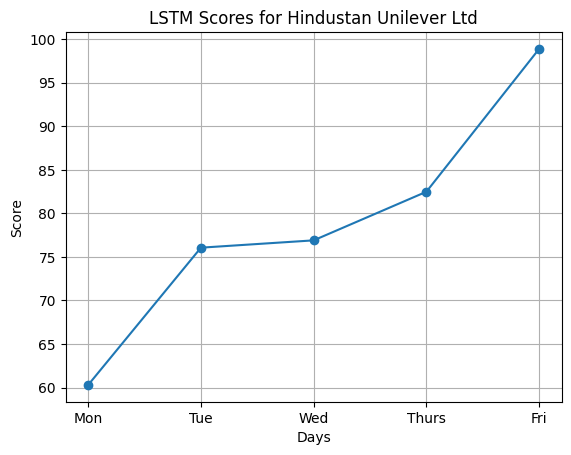

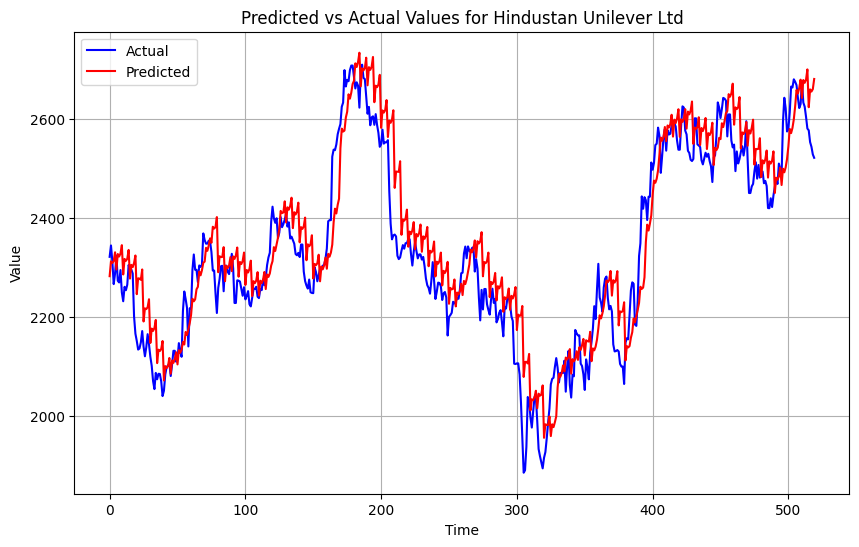

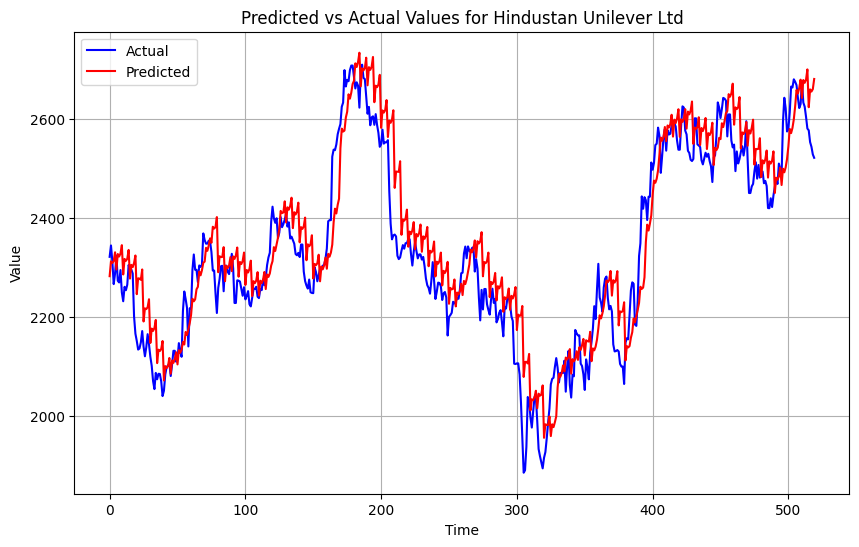

Evaluating model for HDFC Bank Limited
Evaluating model for HDFC Bank Limited
LSTM_UNI-10 for HDFC Bank Limited: [60.646] 49.8, 61.4, 49.9, 59.4, 78.2
Time taken for evaluation: 69.89140844345093 seconds
Value of x for HDFC Bank Limited: 4.97363556965705
LSTM_UNI-10 for HDFC Bank Limited: [60.646] 49.8, 61.4, 49.9, 59.4, 78.2
Time taken for evaluation: 69.89140844345093 seconds
Value of x for HDFC Bank Limited: 4.97363556965705


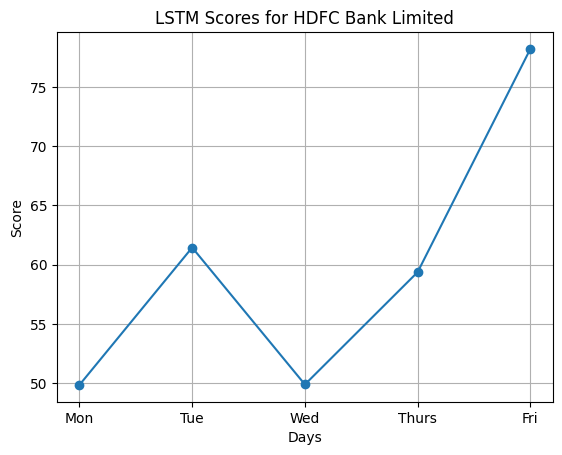

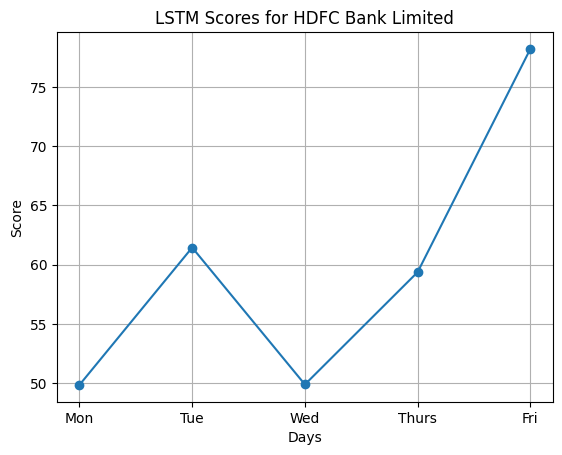

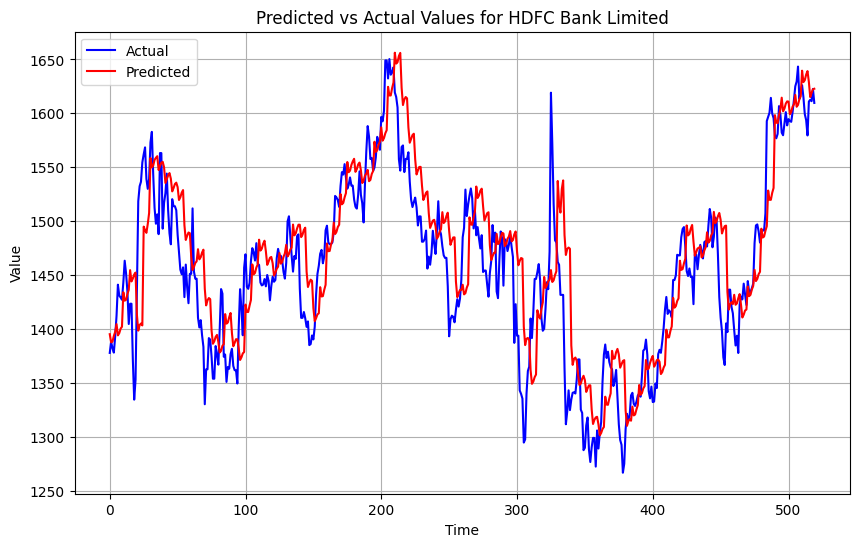

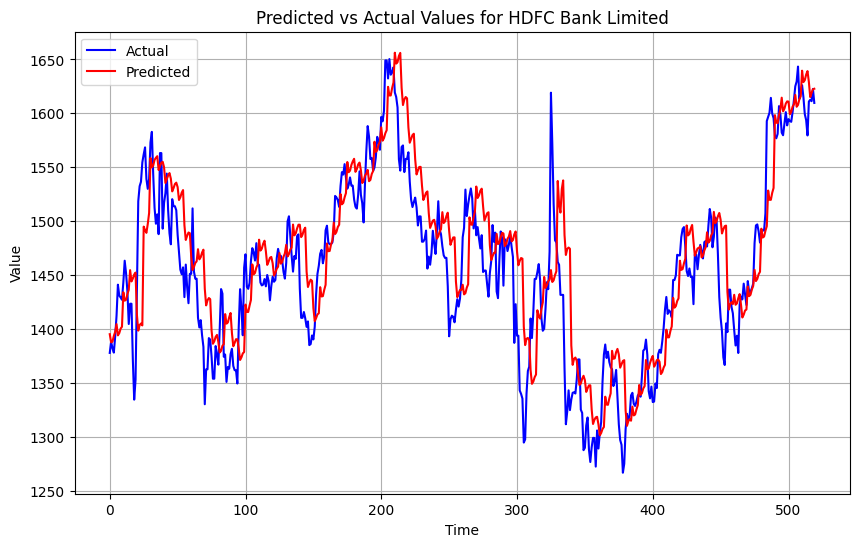

In [ ]:
# File path to save the results
csv_file_path = 'RESULTS_FOR_LSTM_UNI_10.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'LSTM_UNI-10 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['LSTM_UNI_10', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='LSTM')
    plt.title(f'LSTM Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'LSTM_UNI_10_{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Predicted_vs_Actual_LSTM_UNI_10_{name}.png', dpi=300)
    plt.show()


In [ ]:
model = uni_lstm_n_10(train, n_input)
plot_model(model, to_file='LSTM_UNI-10.png', dpi= 300, show_shapes=True)

In [ ]:
model.summary()

#CNN_UNI-5

In [ ]:
# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
	scores = list()
	# calculate an RMSE score for each day
	for i in range(actual.shape[1]):
		# calculate mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		# calculate rmse
		rmse = sqrt(mse)
		# store
		scores.append(rmse)
	# calculate overall RMSE
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores

# summarize scores
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
	# flatten data
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input
		out_end = in_end + n_out
		# ensure we have enough data for this instance
		if out_end <= len(data):
			x_input = data[in_start:in_end, 0]
			x_input = x_input.reshape((len(x_input), 1))
			X.append(x_input)
			y.append(data[in_end:out_end, 0])
		# move along one time step
		in_start += 1
	return array(X), array(y)

# train the model
def uni_cnn_5(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# define parameters
	verbose, epochs, batch_size = 0, 20, 4
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# define model
	model = Sequential()
	model.add(Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features)))
	model.add(MaxPooling1D(pool_size=2))
	model.add(Flatten())
	model.add(Dense(10, activation='relu'))
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model

# make a forecast
def forecast(model, history, n_input):
	# flatten data
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# retrieve last observations for input data
	input_x = data[-n_input:, 0]
	# reshape into [1, n_input, 1]
	input_x = input_x.reshape((1, len(input_x), 1))
	# forecast the next week
	yhat = model.predict(input_x, verbose=0)
	# we only want the vector forecast
	yhat = yhat[0]
	return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
	# fit model
	model = uni_cnn_5(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# walk-forward validation over each week
	predictions = list()
	for i in range(len(test)):
		# predict the week
		yhat_sequence = forecast(model, history, n_input)
		# store the predictions
		predictions.append(yhat_sequence)
		# get real observation and add to history for predicting the next week
		history.append(test[i, :])
	# evaluate predictions days for each week
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
	return score, scores

In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = uni_cnn_5(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

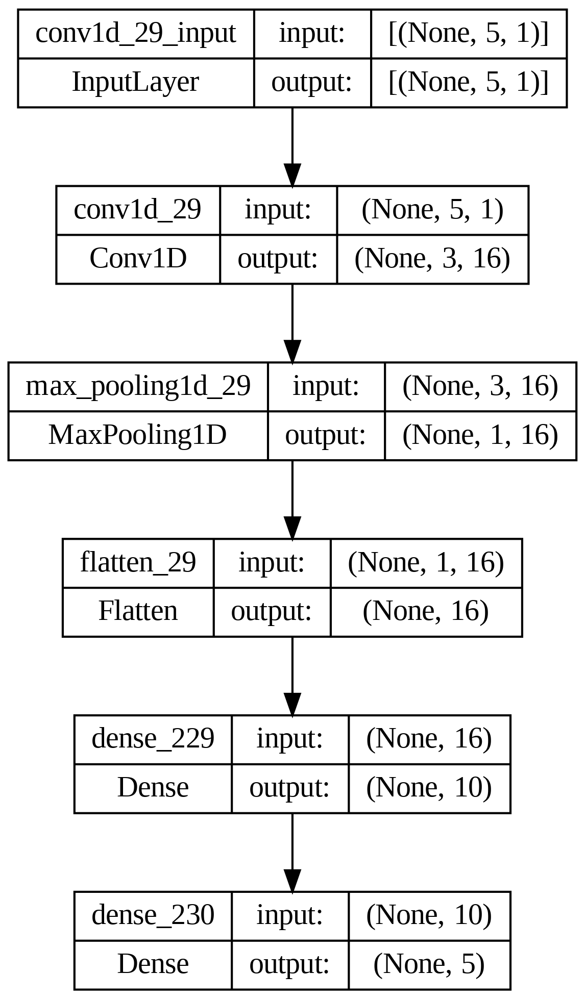

In [ ]:
n_input = 5
model = uni_cnn_5(train, n_input)
plot_model(model, to_file='CNN_UNI-5.png', dpi= 300, show_shapes=True)

In [ ]:
model.summary()

Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_29 (Conv1D)          (None, 3, 16)             64        
                                                                 
 max_pooling1d_29 (MaxPooli  (None, 1, 16)             0         
 ng1D)                                                           
                                                                 
 flatten_29 (Flatten)        (None, 16)                0         
                                                                 
 dense_229 (Dense)           (None, 10)                170       
                                                                 
 dense_230 (Dense)           (None, 5)                 55        
                                                                 
Total params: 289 (1.13 KB)
Trainable params: 289 (1.13 KB)
Non-trainable params: 0 (0.00 Byte)
_______________________

Evaluating model for Tata Steel
CNN_UNI-5 for Tata Steel: [5.814] 5.3, 5.2, 5.2, 6.5, 6.6
Time taken for evaluation: 16.515625 seconds
Value of x for Tata Steel: 8.873612068414733


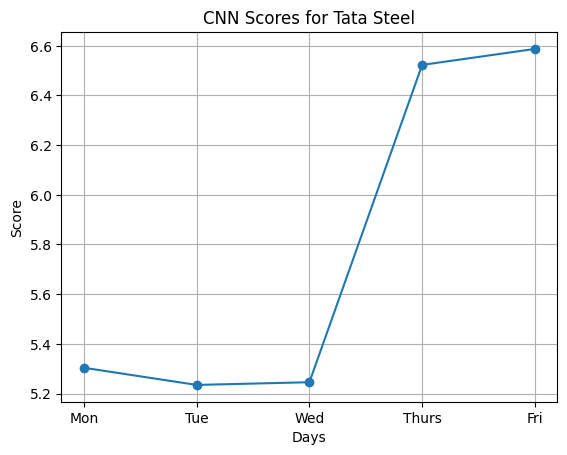

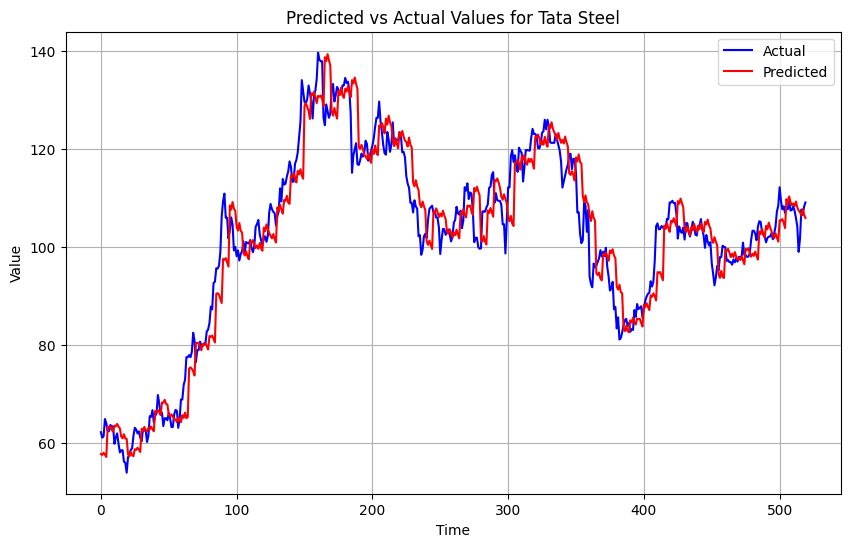

Evaluating model for Tata Consultancy Services
CNN_UNI-5 for Tata Consultancy Services: [93.425] 67.4, 82.3, 86.3, 107.9, 115.1
Time taken for evaluation: 17.422197341918945 seconds
Value of x for Tata Consultancy Services: 3.8874965627667604


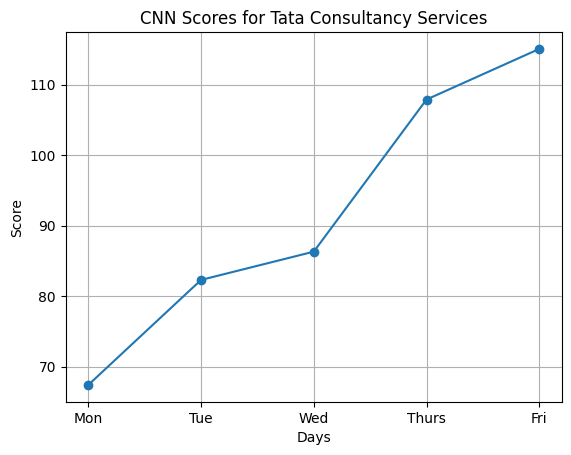

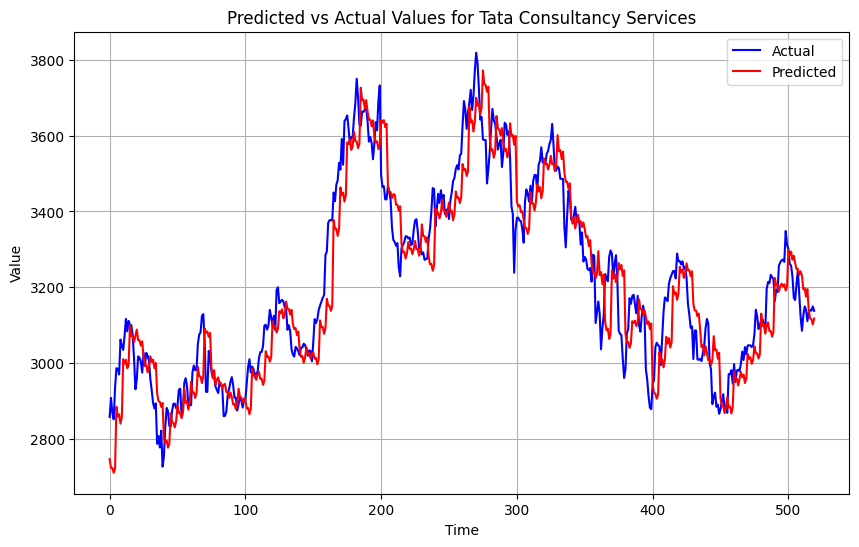

Evaluating model for State Bank of India
CNN_UNI-5 for State Bank of India: [22.274] 16.0, 19.7, 23.5, 25.1, 25.5
Time taken for evaluation: 21.638367652893066 seconds
Value of x for State Bank of India: 6.633127279665012


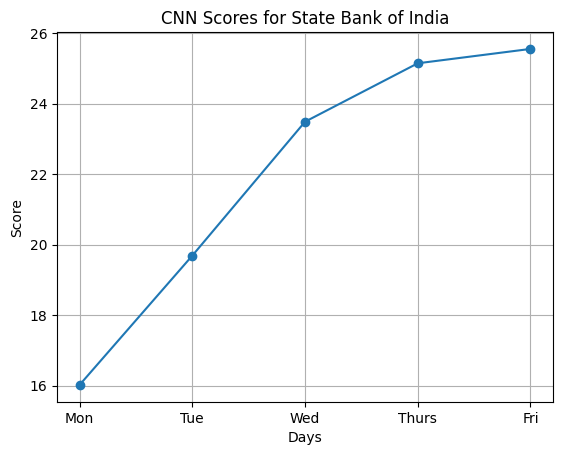

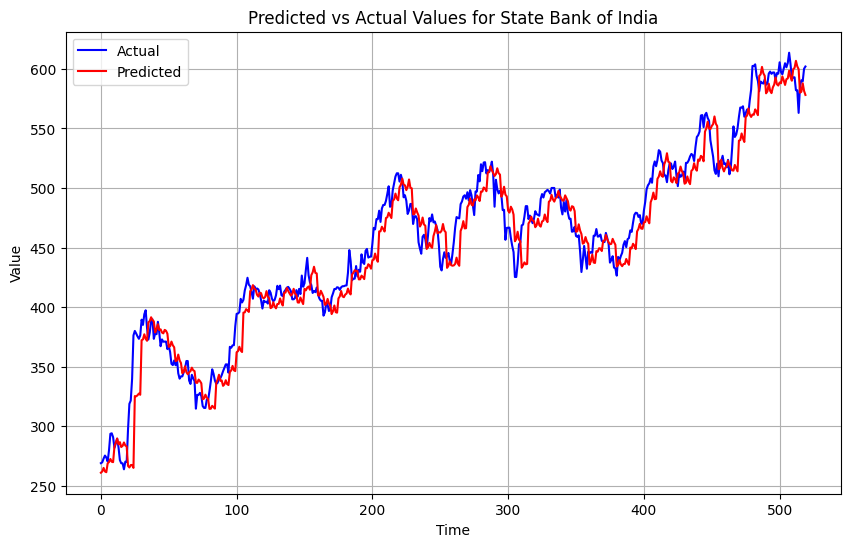

Evaluating model for Reliance Industries
CNN_UNI-5 for Reliance Industries: [83.570] 70.1, 70.3, 79.8, 94.2, 99.1
Time taken for evaluation: 16.93876838684082 seconds
Value of x for Reliance Industries: 5.204839300104063


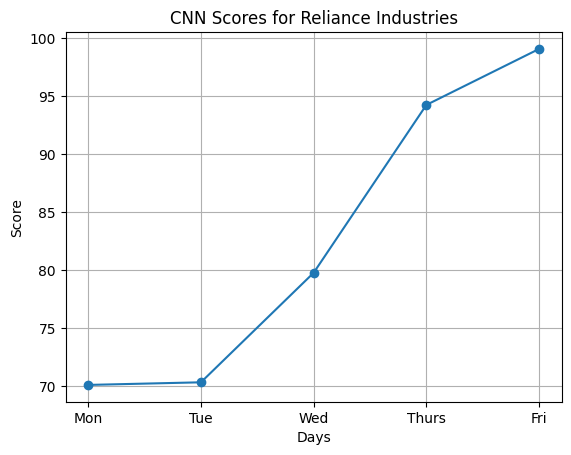

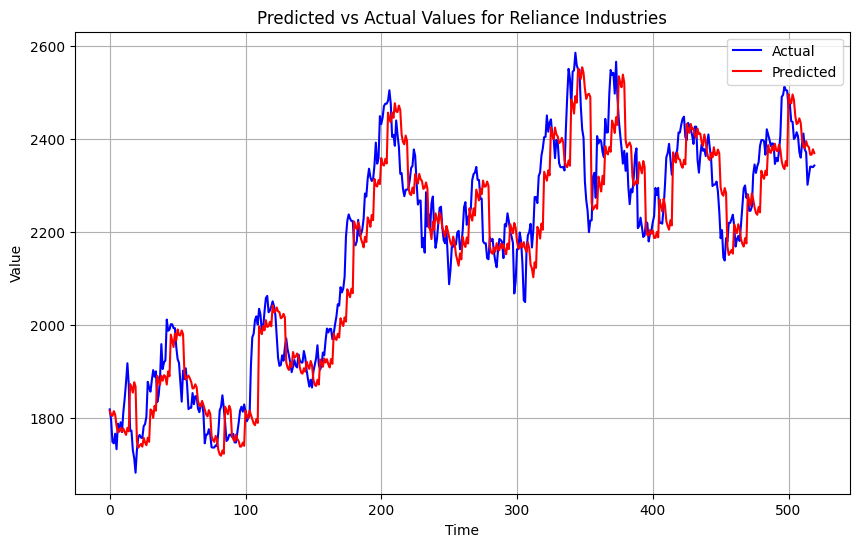

Evaluating model for NIFTY
CNN_UNI-5 for NIFTY: [375.805] 313.5, 333.5, 359.6, 403.7, 452.0
Time taken for evaluation: 21.327449321746826 seconds
Value of x for NIFTY: 2.822938316111822


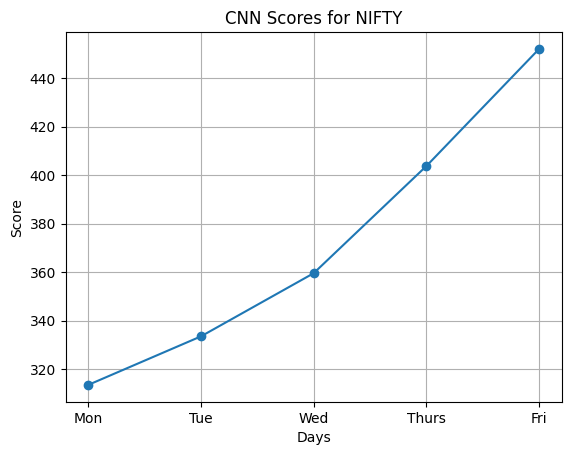

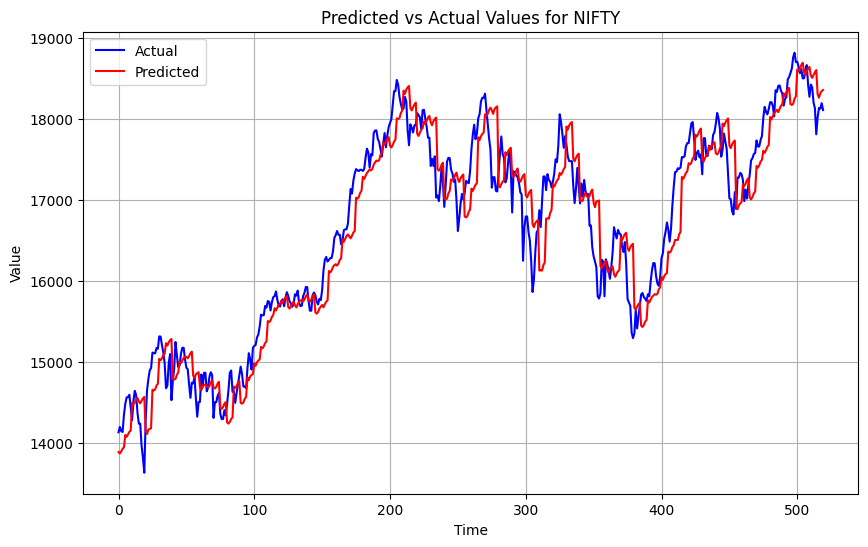

Evaluating model for S&P
CNN_UNI-5 for S&P: [109.942] 91.0, 100.4, 102.8, 116.3, 134.0
Time taken for evaluation: 16.440623998641968 seconds
Value of x for S&P: 3.1879673034300975


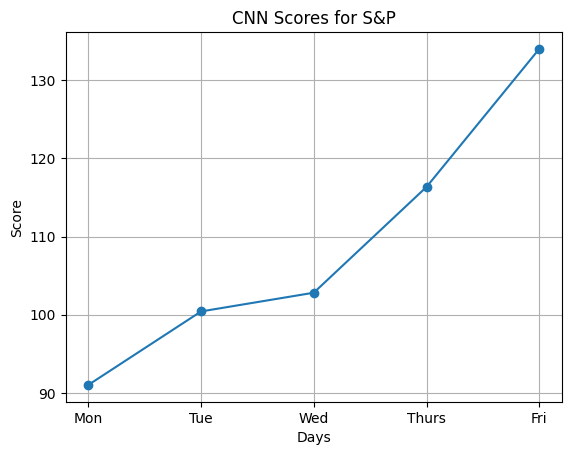

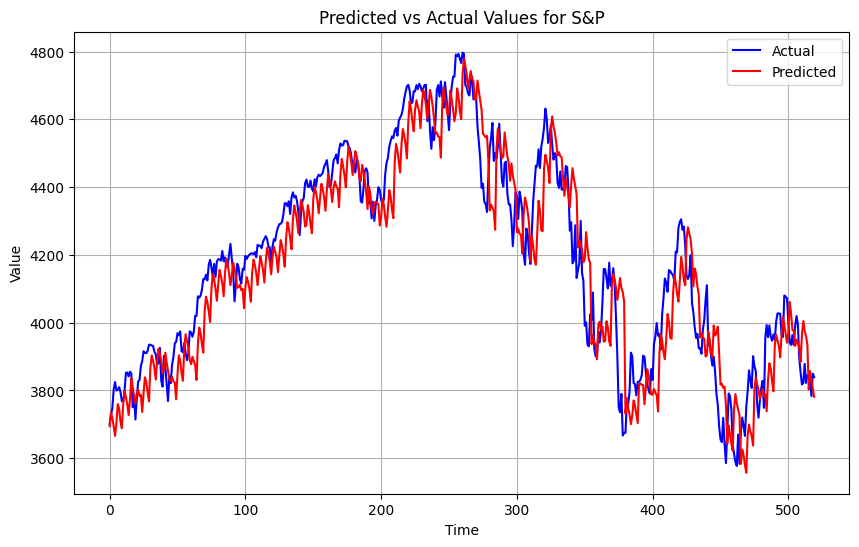

Evaluating model for Microsoft Corp
CNN_UNI-5 for Microsoft Corp: [10.152] 8.6, 9.0, 9.6, 11.4, 11.7
Time taken for evaluation: 21.60126543045044 seconds
Value of x for Microsoft Corp: 5.402311817047398


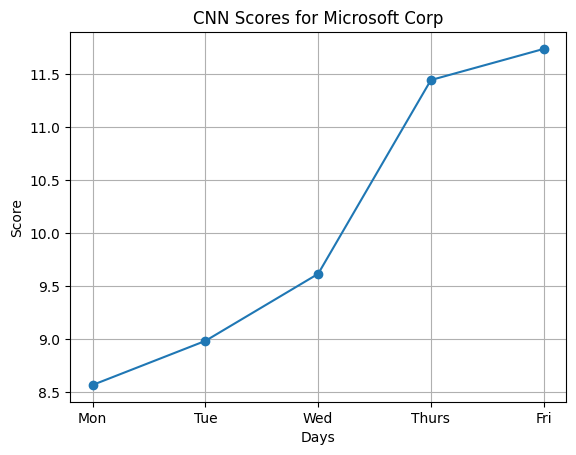

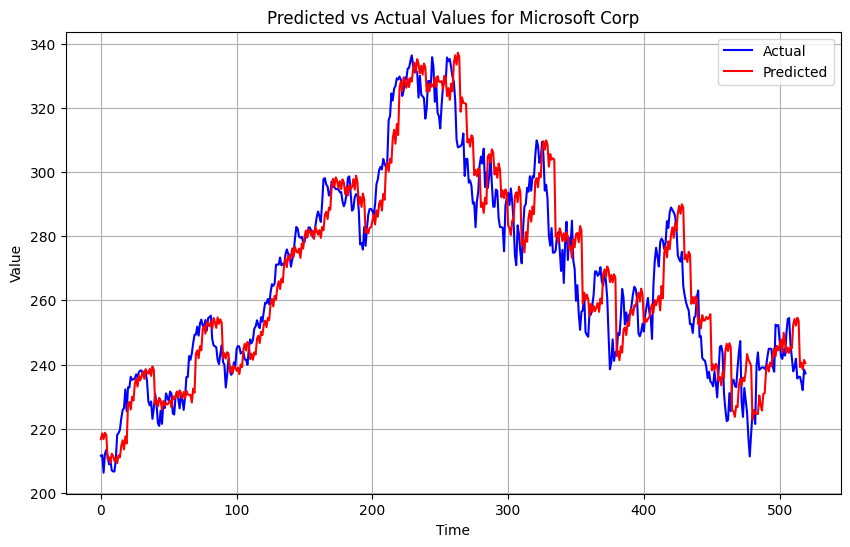

Evaluating model for Maruti Suzuki India Limited
CNN_UNI-5 for Maruti Suzuki India Limited: [290.422] 250.6, 267.6, 285.8, 300.2, 339.8
Time taken for evaluation: 21.857345581054688 seconds
Value of x for Maruti Suzuki India Limited: 4.014363655577836


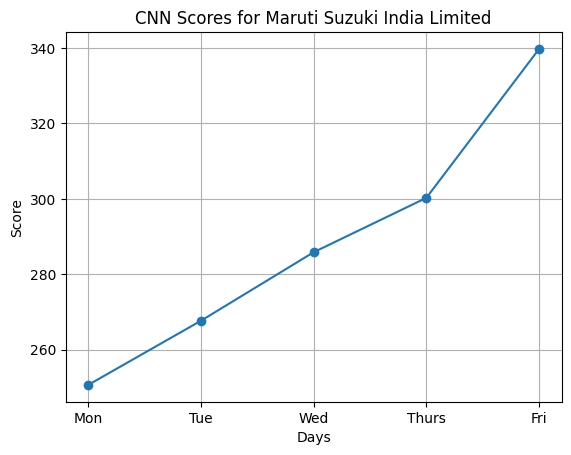

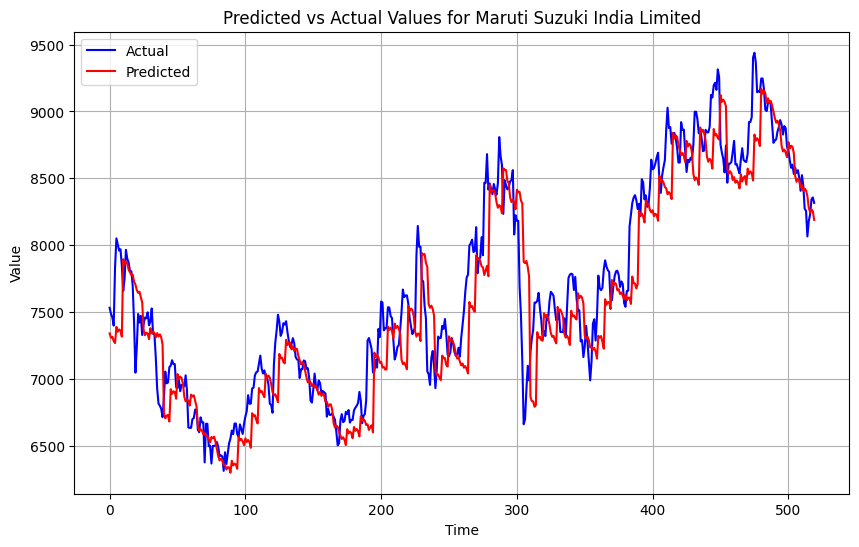

Evaluating model for Mahindra & Mahindra Limited
CNN_UNI-5 for Mahindra & Mahindra Limited: [39.087] 33.0, 36.5, 37.9, 41.1, 45.7
Time taken for evaluation: 22.143099308013916 seconds
Value of x for Mahindra & Mahindra Limited: 5.230282091600513


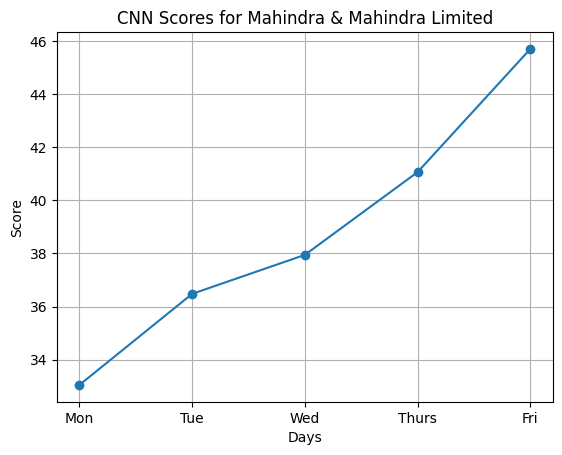

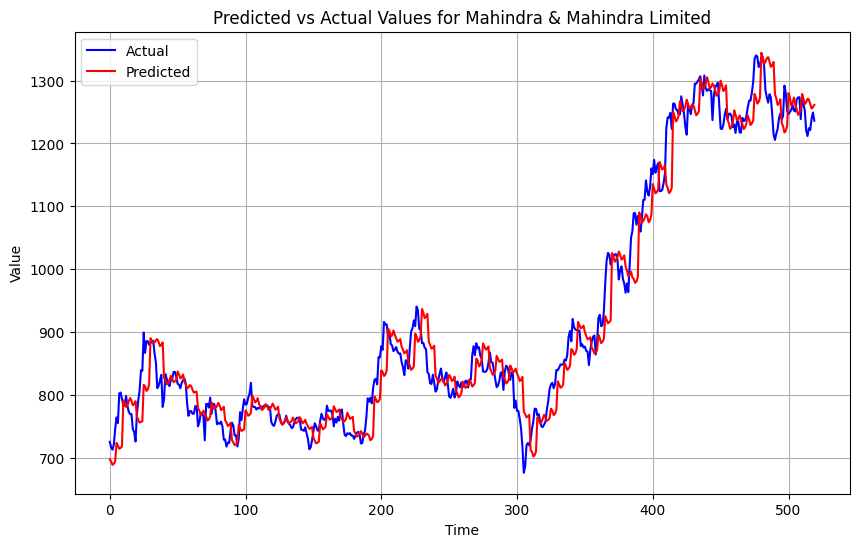

Evaluating model for JSW Steel Limited
CNN_UNI-5 for JSW Steel Limited: [28.770] 22.5, 25.1, 27.1, 32.7, 34.6
Time taken for evaluation: 21.397132873535156 seconds
Value of x for JSW Steel Limited: 7.109211337266717


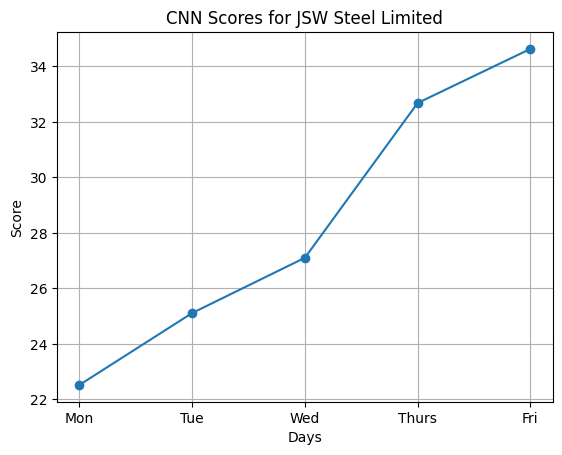

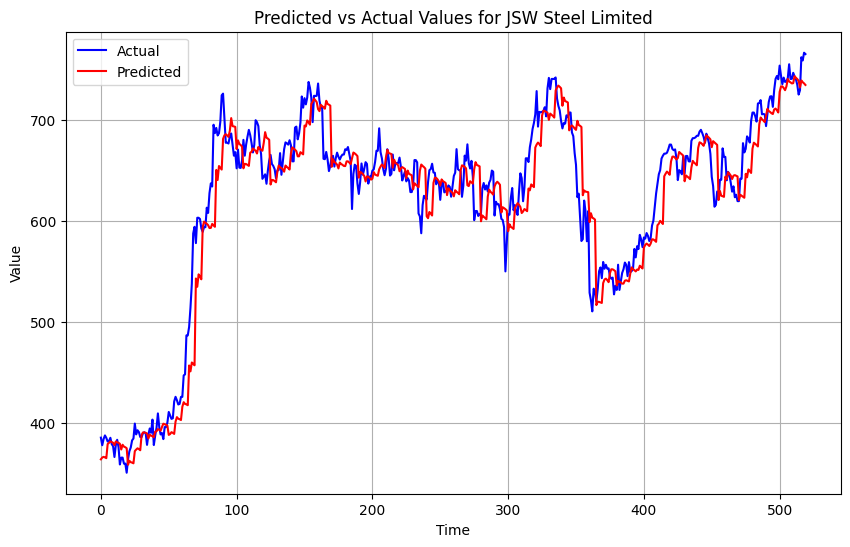

Evaluating model for Infosys Limited
CNN_UNI-5 for Infosys Limited: [52.403] 43.2, 49.0, 50.1, 55.6, 62.2
Time taken for evaluation: 21.307109594345093 seconds
Value of x for Infosys Limited: 5.2430958359921656


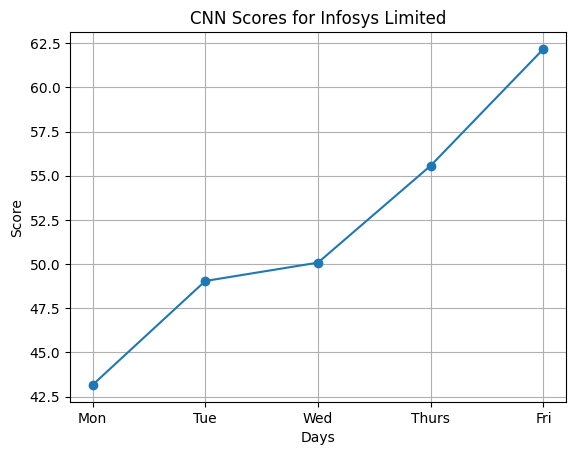

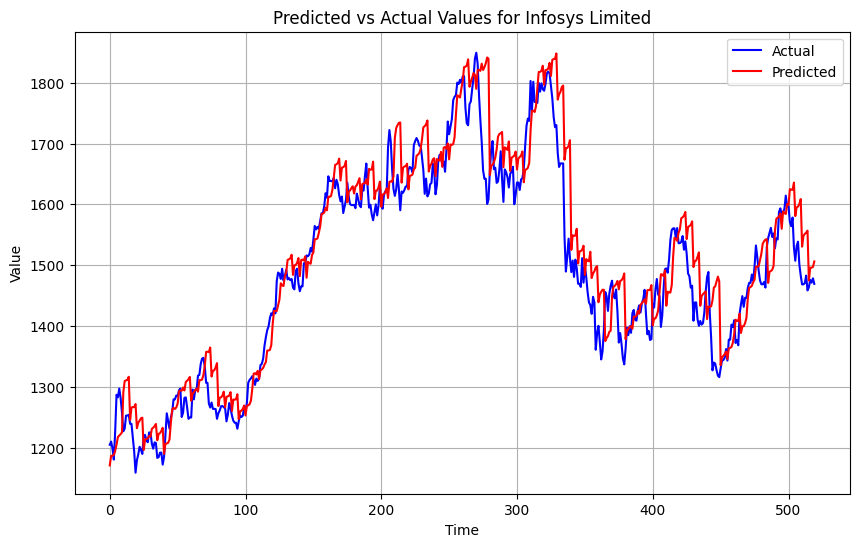

Evaluating model for ITC Limited
CNN_UNI-5 for ITC Limited: [7.461] 5.9, 6.2, 7.2, 8.2, 9.2
Time taken for evaluation: 16.644853830337524 seconds
Value of x for ITC Limited: 3.4453042735795583


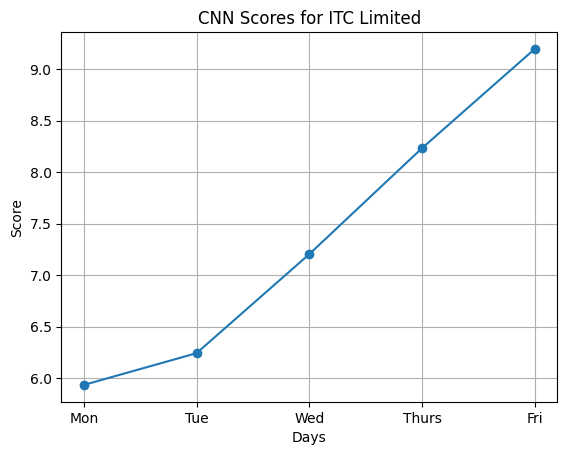

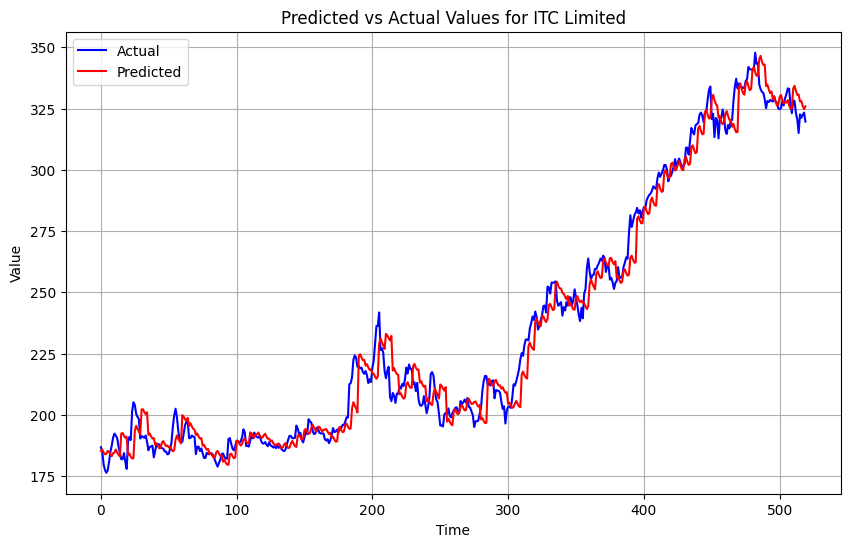

Evaluating model for Hindustan Unilever Ltd
CNN_UNI-5 for Hindustan Unilever Ltd: [75.624] 62.3, 67.6, 71.1, 85.7, 88.0
Time taken for evaluation: 20.320701360702515 seconds
Value of x for Hindustan Unilever Ltd: 3.8333811453631697


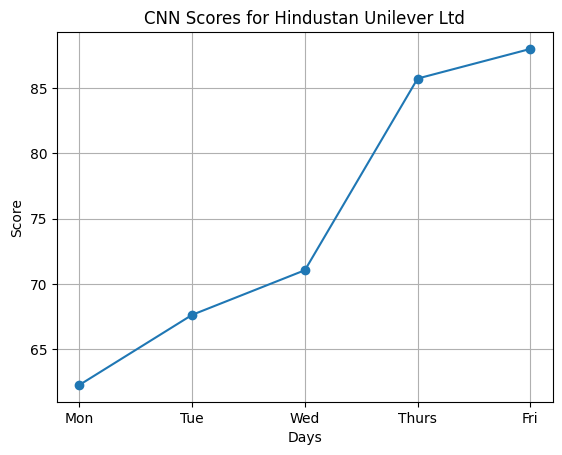

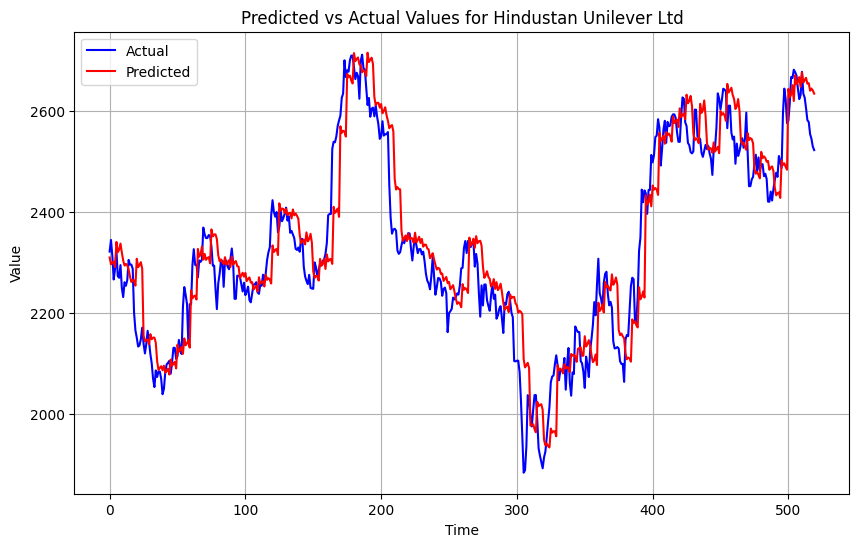

Evaluating model for HDFC Bank Limited
CNN_UNI-5 for HDFC Bank Limited: [48.287] 43.2, 45.8, 47.5, 50.6, 53.7
Time taken for evaluation: 19.87966561317444 seconds
Value of x for HDFC Bank Limited: 3.96006608026609


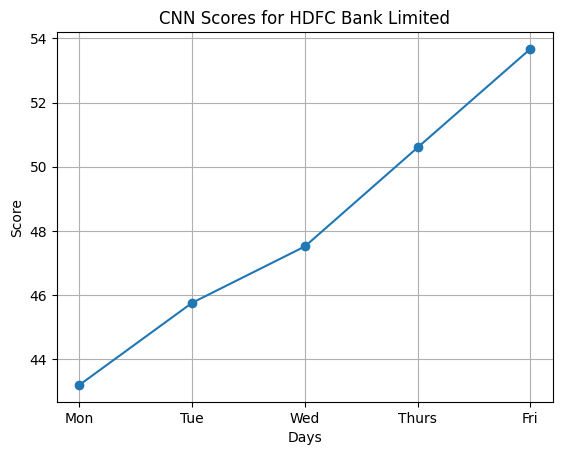

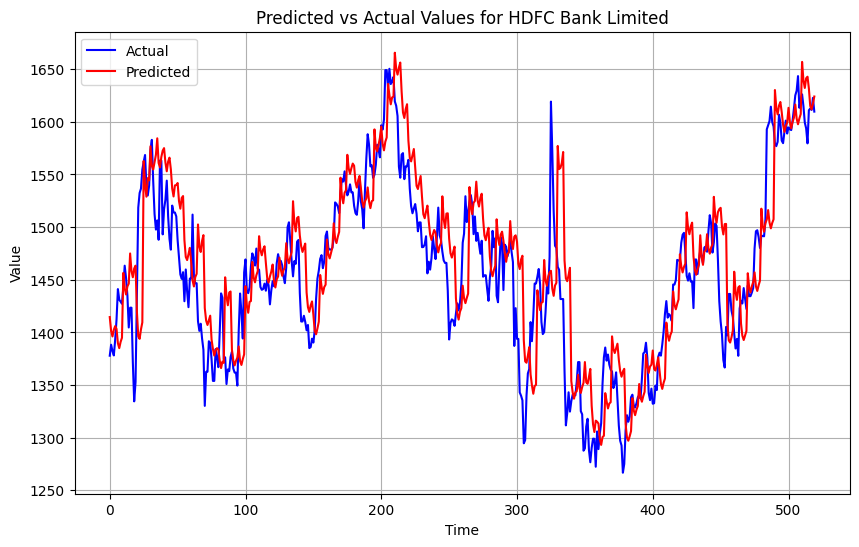

In [ ]:
# File path to save the results
csv_file_path = 'RESULTS_CNN_UNI_5.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'CNN_UNI-5 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['CNN_UNI_5', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='CNN')
    plt.title(f'CNN Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'CNN_UNI_5_{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Pre_vs_Act_CNN_UNI_5_{name}.png', dpi=300)
    plt.show()


# CNN_UNI-10

In [ ]:
# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
	scores = list()
	# calculate an RMSE score for each day
	for i in range(actual.shape[1]):
		# calculate mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		# calculate rmse
		rmse = sqrt(mse)
		# store
		scores.append(rmse)
	# calculate overall RMSE
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores

# summarize scores
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
	# flatten data
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input
		out_end = in_end + n_out
		# ensure we have enough data for this instance
		if out_end <= len(data):
			x_input = data[in_start:in_end, 0]
			x_input = x_input.reshape((len(x_input), 1))
			X.append(x_input)
			y.append(data[in_end:out_end, 0])
		# move along one time step
		in_start += 1
	return array(X), array(y)

# train the model
def CNN_UNI_10(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# define parameters
	verbose, epochs, batch_size = 0, 20, 4
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# define model
	model = Sequential()
	model.add(Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features)))
	model.add(MaxPooling1D(pool_size=2))
	model.add(Flatten())
	model.add(Dense(10, activation='relu'))
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model

# make a forecast
def forecast(model, history, n_input):
	# flatten data
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# retrieve last observations for input data
	input_x = data[-n_input:, 0]
	# reshape into [1, n_input, 1]
	input_x = input_x.reshape((1, len(input_x), 1))
	# forecast the next week
	yhat = model.predict(input_x, verbose=0)
	# we only want the vector forecast
	yhat = yhat[0]
	return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
	# fit model
	model = CNN_UNI_10(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# walk-forward validation over each week
	predictions = list()
	for i in range(len(test)):
		# predict the week
		yhat_sequence = forecast(model, history, n_input)
		# store the predictions
		predictions.append(yhat_sequence)
		# get real observation and add to history for predicting the next week
		history.append(test[i, :])
	# evaluate predictions days for each week
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
	return score, scores


In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = CNN_UNI_10(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

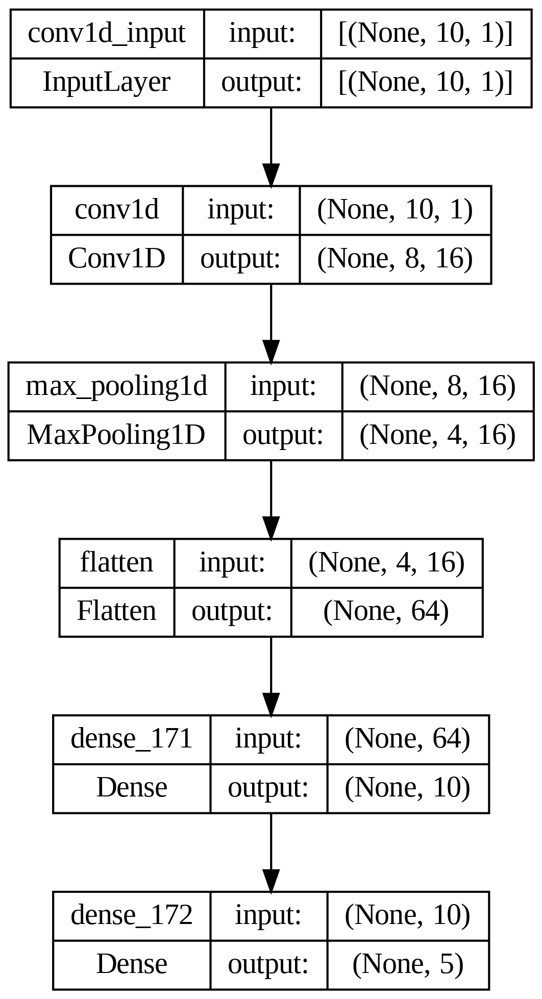

In [ ]:
n_input = 10
model = CNN_UNI_10(train, n_input)
plot_model(model, to_file=' CNN_UNI_10.png', dpi = 300, show_shapes=True)

In [ ]:
model.summary()

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 8, 16)             64        
                                                                 
 max_pooling1d (MaxPooling1  (None, 4, 16)             0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 64)                0         
                                                                 
 dense_171 (Dense)           (None, 10)                650       
                                                                 
 dense_172 (Dense)           (None, 5)                 55        
                                                                 
Total params: 769 (3.00 KB)
Trainable params: 769 (3.00 KB)
Non-trainable params: 0 (0.00 Byte)
_______________________

Evaluating model for Tata Steel
CNN_UNI-10 for Tata Steel: [5.650] 5.1, 4.8, 5.1, 6.4, 6.6
Time taken for evaluation: 18.48524236679077 seconds
Value of x for Tata Steel: 8.623295291269422


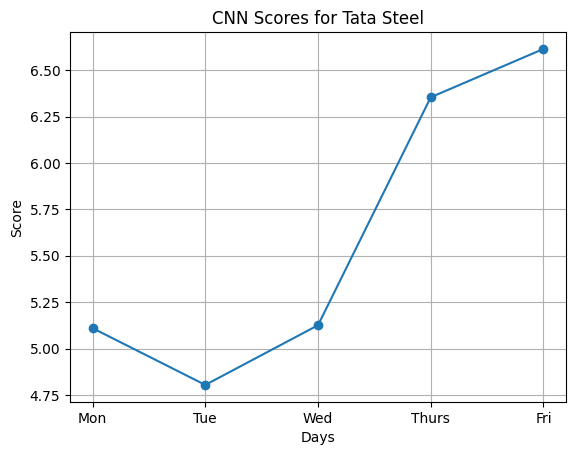

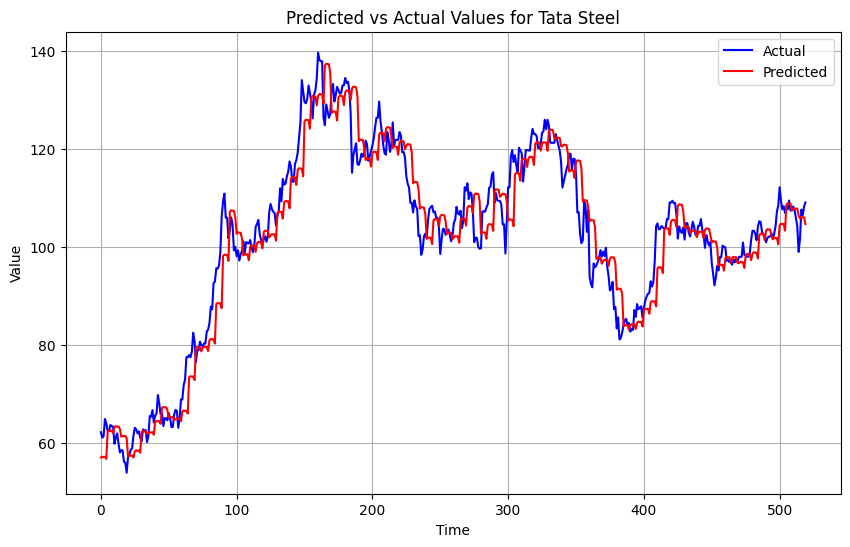

Evaluating model for Tata Consultancy Services
CNN_UNI-10 for Tata Consultancy Services: [111.894] 98.7, 92.4, 101.4, 131.0, 129.9
Time taken for evaluation: 18.11602544784546 seconds
Value of x for Tata Consultancy Services: 4.656001646925988


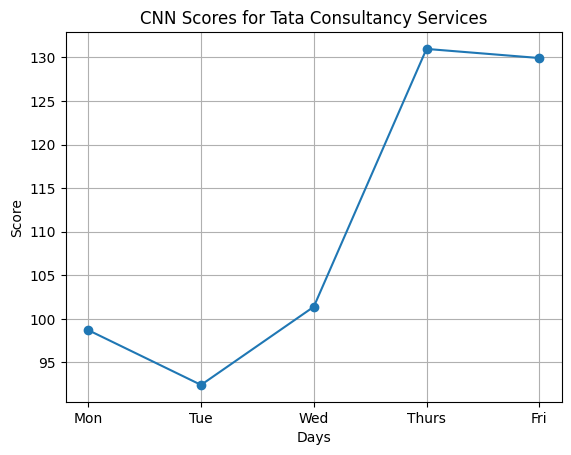

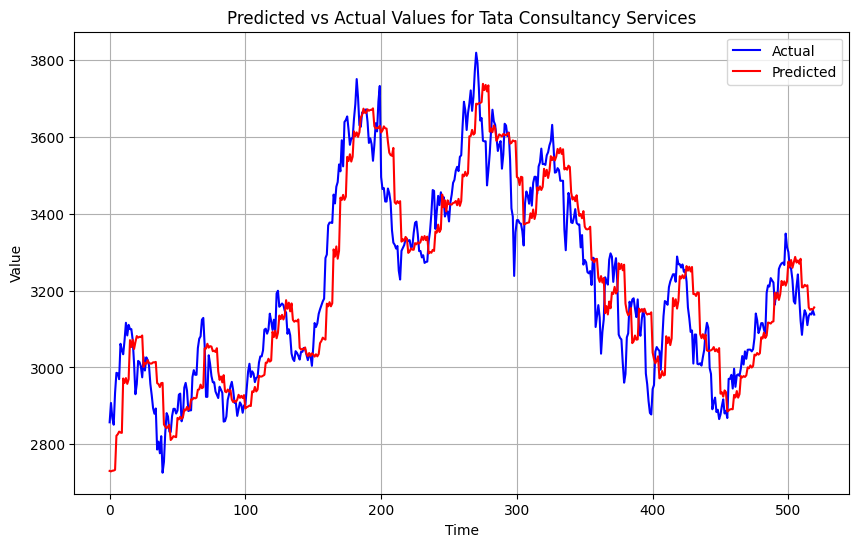

Evaluating model for State Bank of India
CNN_UNI-10 for State Bank of India: [21.044] 16.5, 18.6, 18.9, 23.1, 26.6
Time taken for evaluation: 21.356042861938477 seconds
Value of x for State Bank of India: 6.26664333611494


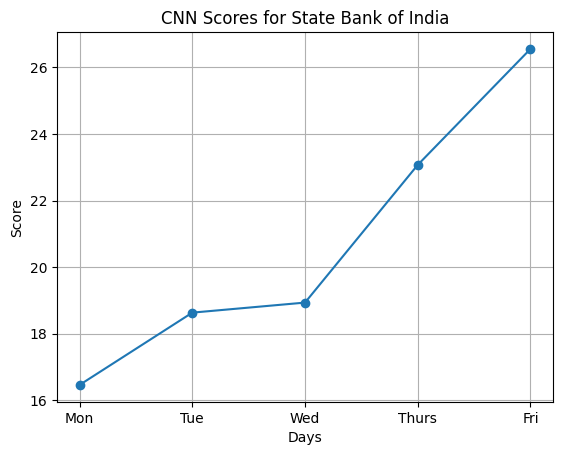

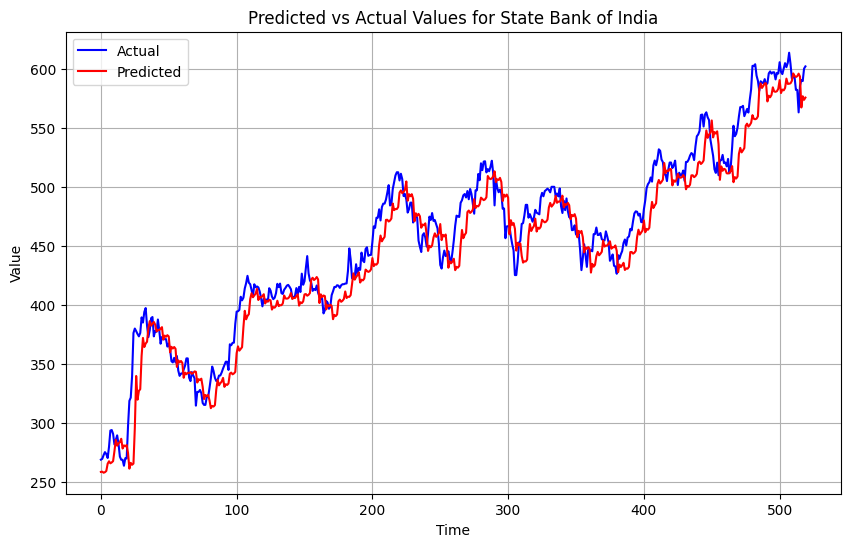

Evaluating model for Reliance Industries
CNN_UNI-10 for Reliance Industries: [86.695] 76.9, 71.3, 87.8, 96.6, 97.7
Time taken for evaluation: 20.915879487991333 seconds
Value of x for Reliance Industries: 5.399438017429009


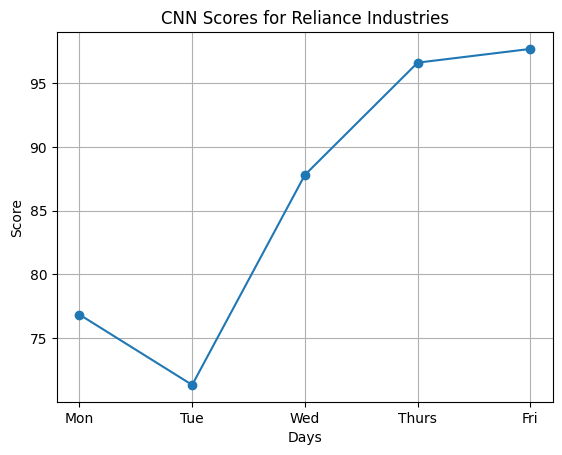

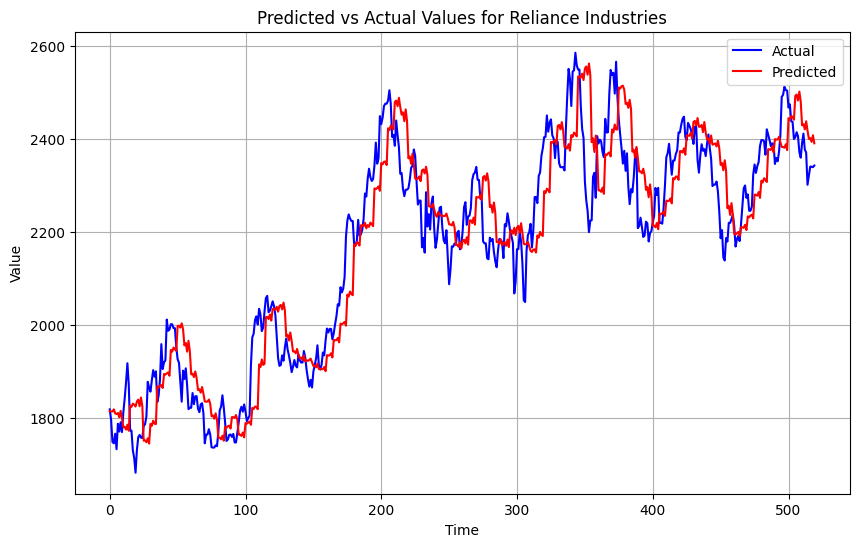

Evaluating model for NIFTY
CNN_UNI-10 for NIFTY: [456.801] 489.2, 355.8, 397.6, 535.4, 482.4
Time taken for evaluation: 17.61967444419861 seconds
Value of x for NIFTY: 3.431351525949079


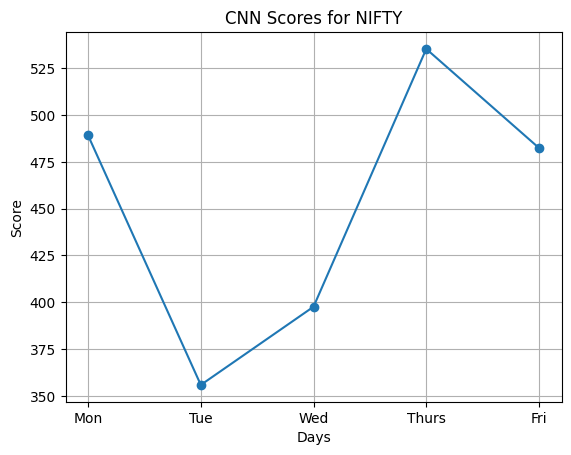

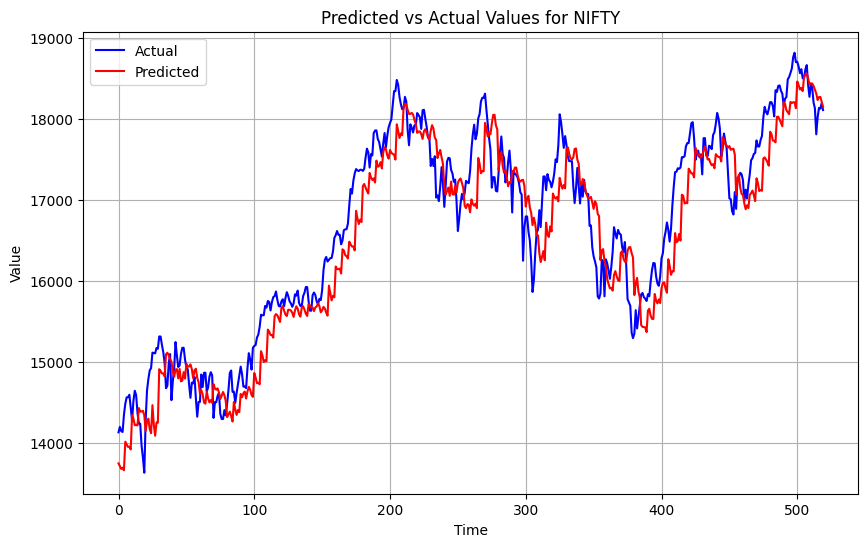

Evaluating model for S&P
CNN_UNI-10 for S&P: [130.023] 109.5, 117.4, 134.9, 129.5, 154.2
Time taken for evaluation: 17.365581512451172 seconds
Value of x for S&P: 3.770227781809539


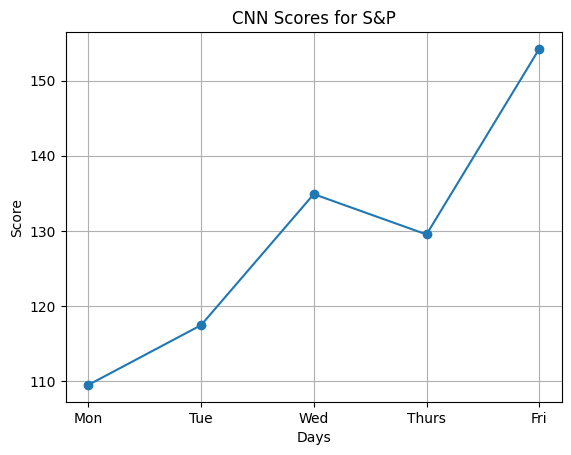

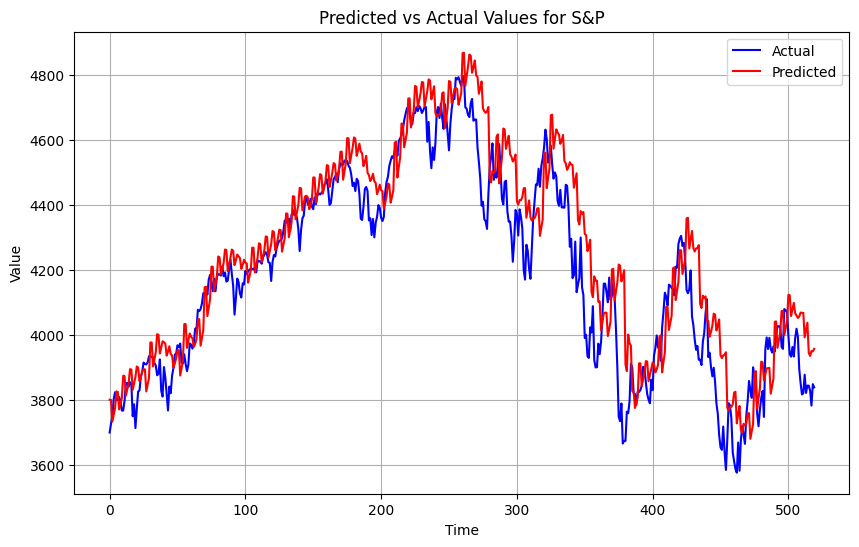

Evaluating model for Microsoft Corp
CNN_UNI-10 for Microsoft Corp: [10.746] 9.6, 11.1, 10.1, 11.2, 11.6
Time taken for evaluation: 18.37383532524109 seconds
Value of x for Microsoft Corp: 5.718196695299368


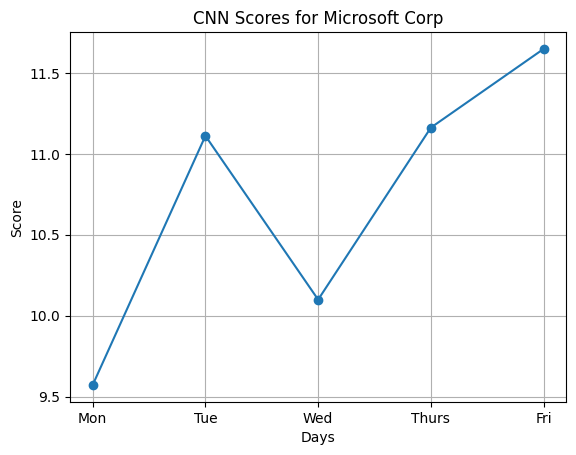

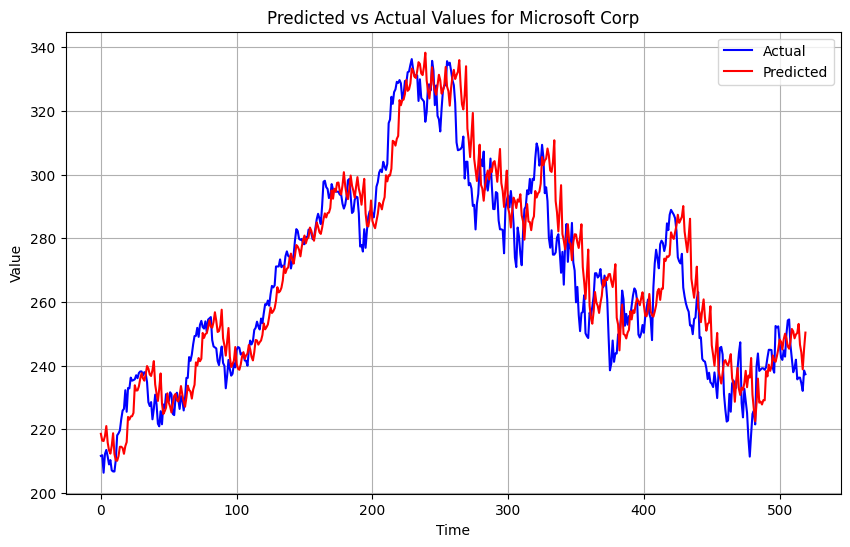

Evaluating model for Maruti Suzuki India Limited
CNN_UNI-10 for Maruti Suzuki India Limited: [292.680] 273.1, 287.7, 278.5, 289.4, 331.2
Time taken for evaluation: 19.03808903694153 seconds
Value of x for Maruti Suzuki India Limited: 4.045568212403994


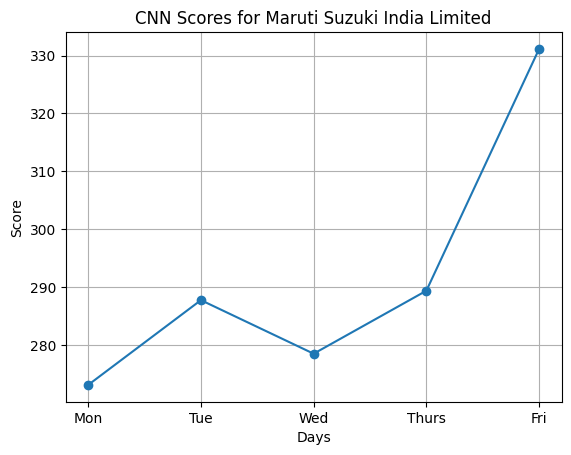

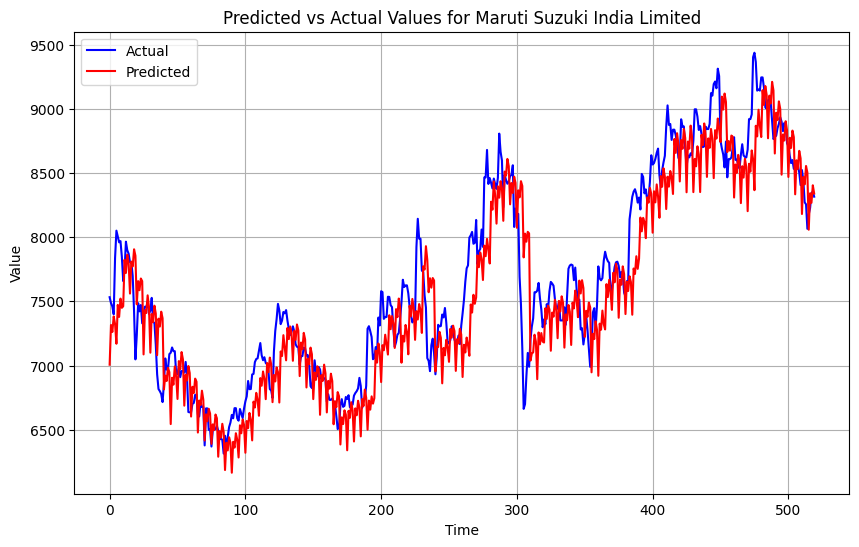

Evaluating model for Mahindra & Mahindra Limited
CNN_UNI-10 for Mahindra & Mahindra Limited: [38.544] 34.6, 33.8, 36.9, 39.3, 46.6
Time taken for evaluation: 21.643487453460693 seconds
Value of x for Mahindra & Mahindra Limited: 5.157617508949441


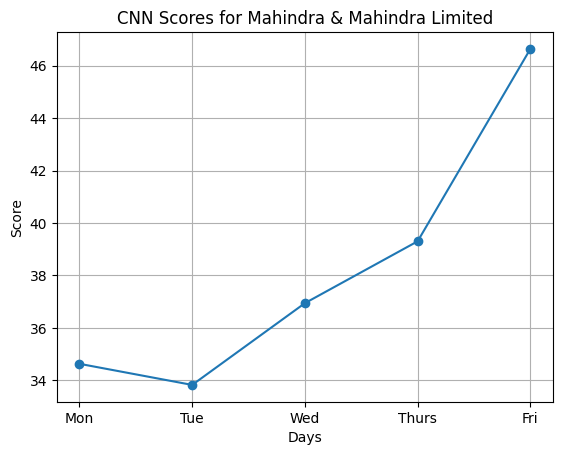

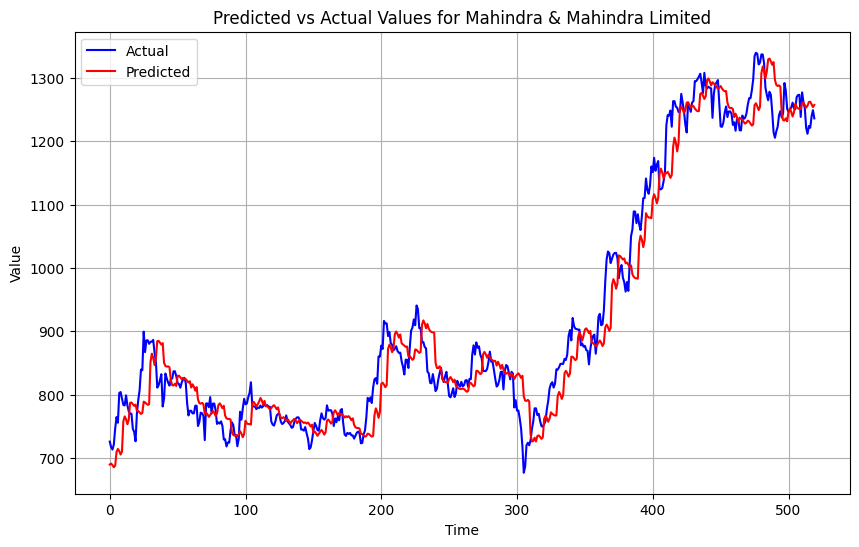

Evaluating model for JSW Steel Limited
CNN_UNI-10 for JSW Steel Limited: [27.510] 21.9, 27.5, 24.3, 30.1, 32.4
Time taken for evaluation: 17.95953893661499 seconds
Value of x for JSW Steel Limited: 6.797819452157776


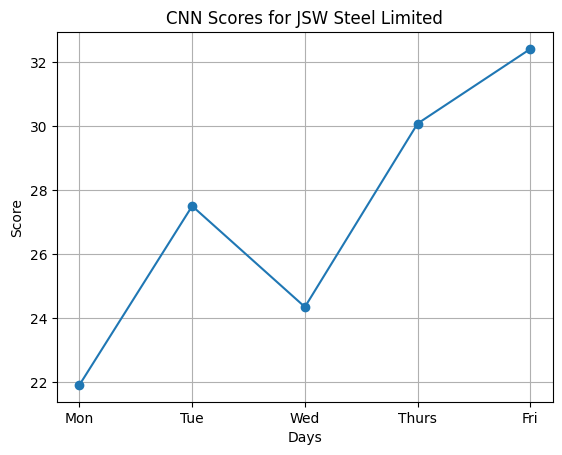

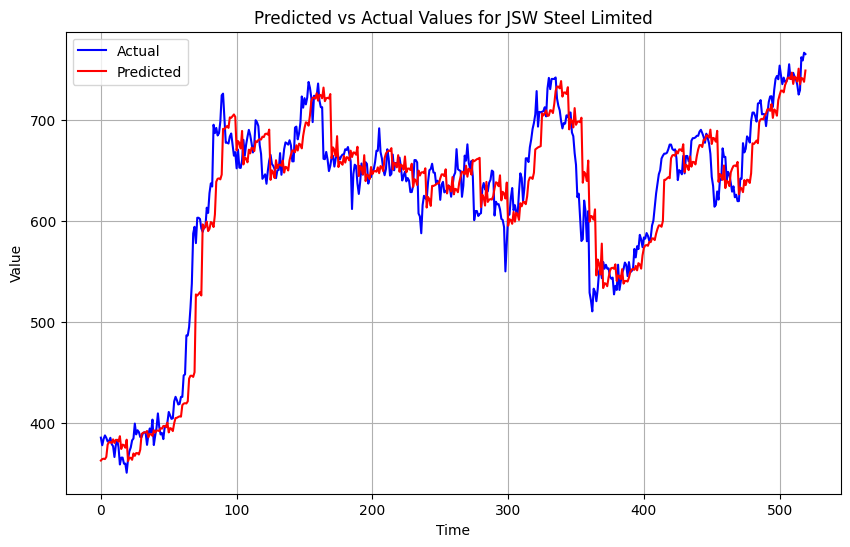

Evaluating model for Infosys Limited
CNN_UNI-10 for Infosys Limited: [55.274] 47.4, 51.4, 56.8, 57.4, 62.3
Time taken for evaluation: 21.10311508178711 seconds
Value of x for Infosys Limited: 5.530340357158285


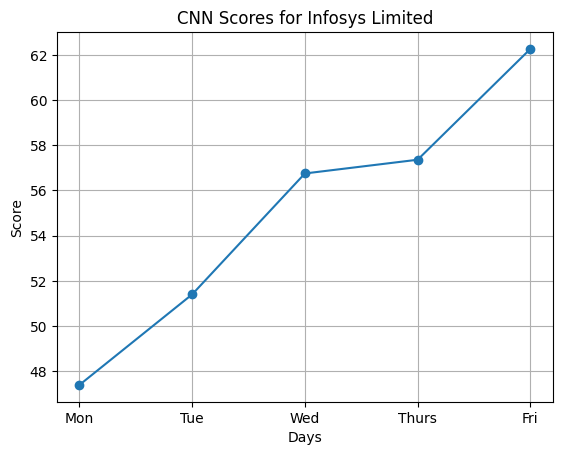

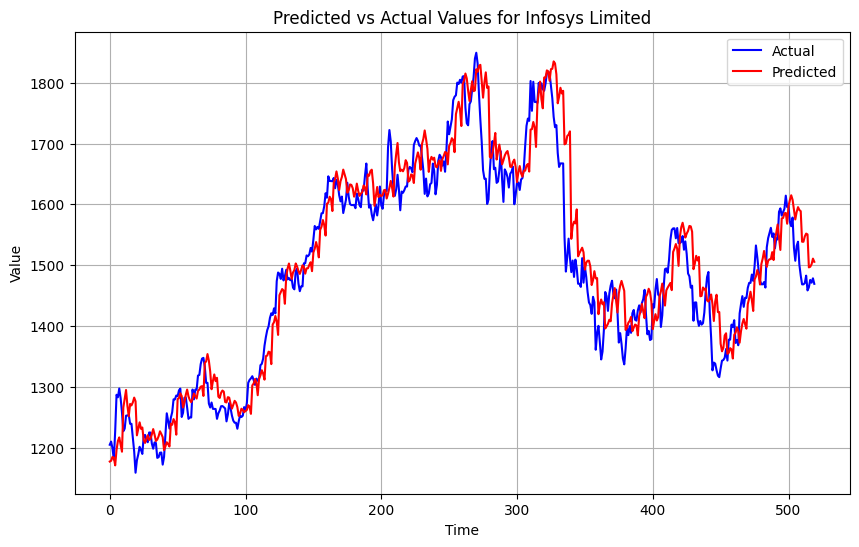

Evaluating model for ITC Limited
CNN_UNI-10 for ITC Limited: [10.065] 5.7, 8.6, 9.5, 11.8, 13.0
Time taken for evaluation: 16.836520195007324 seconds
Value of x for ITC Limited: 4.64734955703261


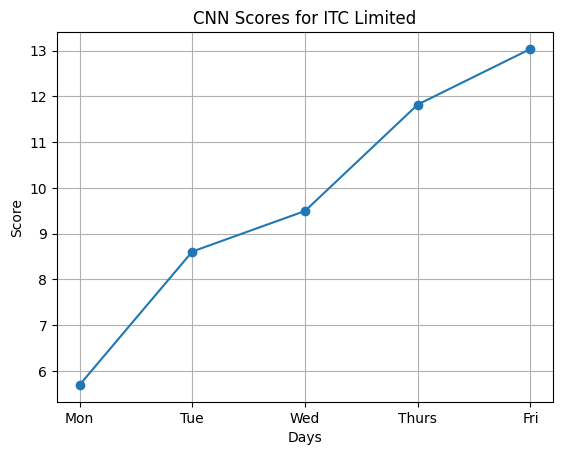

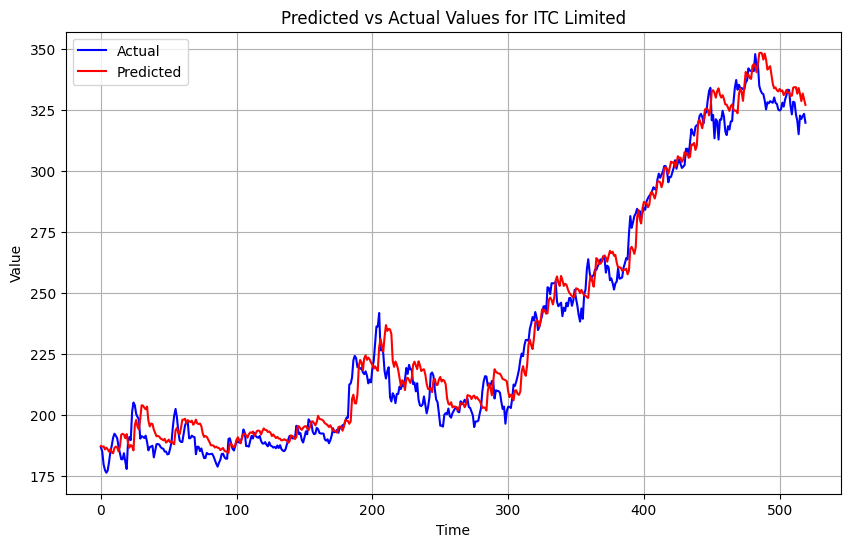

Evaluating model for Hindustan Unilever Ltd
CNN_UNI-10 for Hindustan Unilever Ltd: [88.621] 58.8, 79.7, 89.2, 100.1, 107.1
Time taken for evaluation: 20.489060163497925 seconds
Value of x for Hindustan Unilever Ltd: 4.49221441680462


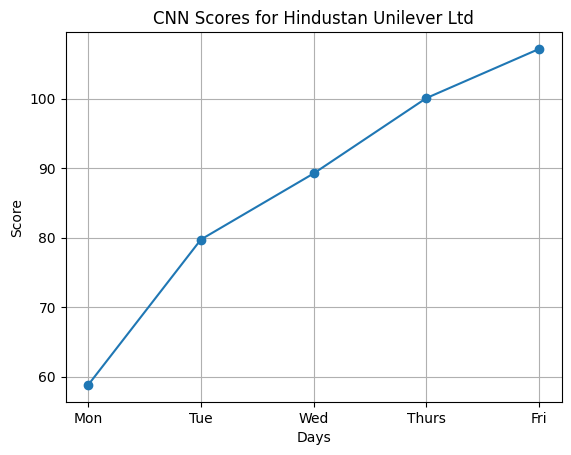

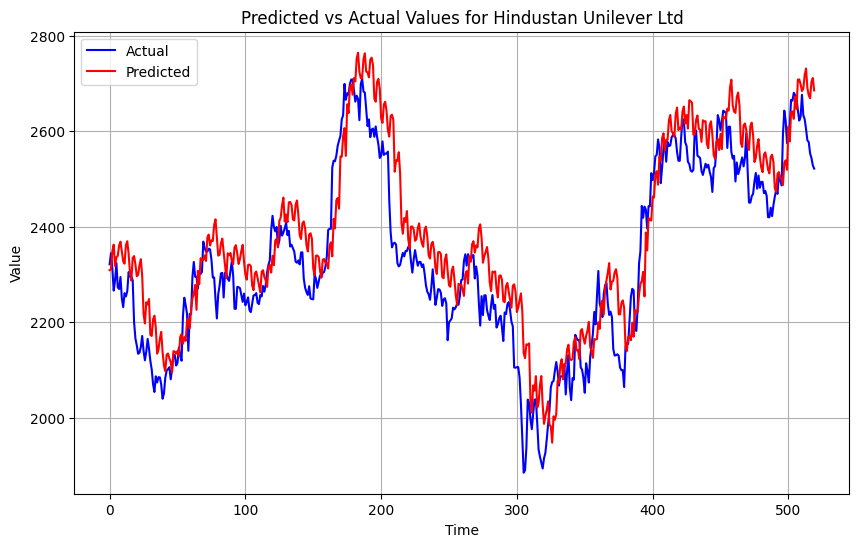

Evaluating model for HDFC Bank Limited
CNN_UNI-10 for HDFC Bank Limited: [48.843] 43.7, 48.5, 45.2, 53.9, 52.1
Time taken for evaluation: 21.65267539024353 seconds
Value of x for HDFC Bank Limited: 4.005623374035983


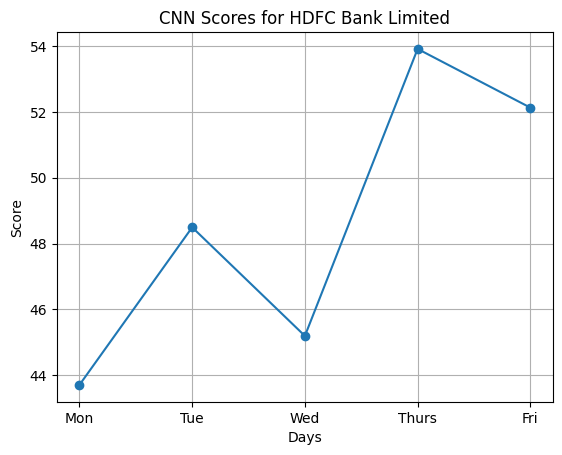

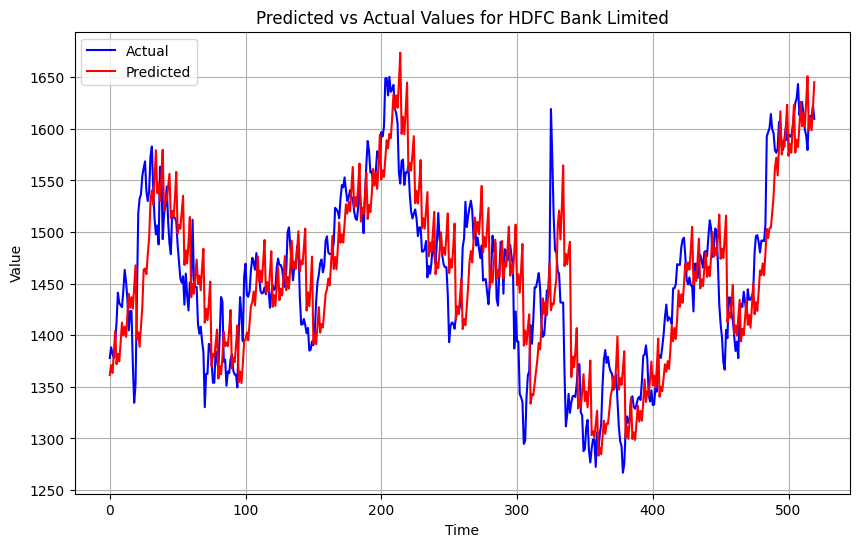

In [ ]:
# File path to save the results
csv_file_path = 'RESULTS_CNN_UNI_10.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'CNN_UNI-10 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['CNN_UNI_10', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='CNN')
    plt.title(f'CNN Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'CNN_UNI_10_{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Pre_vs_Act_CNN_UNI_10_{name}.png', dpi=300)
    plt.show()


# CNN_MULTI-10

In [ ]:

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
	scores = list()
	# calculate an RMSE score for each day
	for i in range(actual.shape[1]):
		# calculate mse
		mse = mean_squared_error(actual[:, i], predicted[:, i])
		# calculate rmse
		rmse = sqrt(mse)
		# store
		scores.append(rmse)
	# calculate overall RMSE
	s = 0
	for row in range(actual.shape[0]):
		for col in range(actual.shape[1]):
			s += (actual[row, col] - predicted[row, col])**2
	score = sqrt(s / (actual.shape[0] * actual.shape[1]))
	return score, scores

# summarize scores
def summarize_scores(name, score, scores):
	s_scores = ', '.join(['%.1f' % s for s in scores])
	print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
	# flatten data
	data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
	X, y = list(), list()
	in_start = 0
	# step over the entire history one time step at a time
	for _ in range(len(data)):
		# define the end of the input sequence
		in_end = in_start + n_input
		out_end = in_end + n_out
		# ensure we have enough data for this instance
		if out_end <= len(data):
			X.append(data[in_start:in_end, :])
			y.append(data[in_end:out_end, 0])
		# move along one time step
		in_start += 1
	return array(X), array(y)

# train the model
def CNN_MULTI_10(train, n_input):
	# prepare data
	train_x, train_y = to_supervised(train, n_input)
	# define parameters
	verbose, epochs, batch_size = 0, 70, 16
	n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
	# define model
	model = Sequential()
	model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(n_timesteps,n_features)))
	model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
	model.add(MaxPooling1D(pool_size=2))
	model.add(Conv1D(filters=16, kernel_size=3, activation='relu'))
	model.add(MaxPooling1D(pool_size=1))
	model.add(Flatten())
	model.add(Dense(100, activation='relu'))
	model.add(Dense(n_outputs))
	model.compile(loss='mse', optimizer='adam')
	# fit network
	model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
	return model

# make a forecast
def forecast(model, history, n_input):
	# flatten data
	data = array(history)
	data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
	# retrieve last observations for input data
	input_x = data[-n_input:, :]
	# reshape into [1, n_input, n]
	input_x = input_x.reshape((1, input_x.shape[0], input_x.shape[1]))
	# forecast the next week
	yhat = model.predict(input_x, verbose=0)
	# we only want the vector forecast
	yhat = yhat[0]
	return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
	# fit model
	model = CNN_MULTI_10(train, n_input)
	# history is a list of weekly data
	history = [x for x in train]
	# walk-forward validation over each week
	predictions = list()
	for i in range(len(test)):
		# predict the week
		yhat_sequence = forecast(model, history, n_input)
		# store the predictions
		predictions.append(yhat_sequence)
		# get real observation and add to history for predicting the next week
		history.append(test[i, :])
	# evaluate predictions days for each week
	predictions = array(predictions)
	score, scores = evaluate_forecasts(test[:, :, 0], predictions)
	return score, scores

In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = CNN_MULTI_10(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

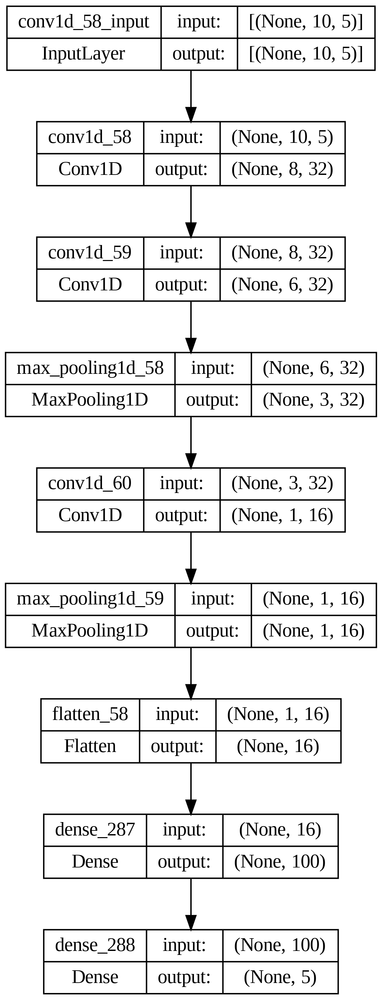

In [ ]:
n_input = 10
model = CNN_MULTI_10(train, n_input)
plot_model(model, to_file='CNN_MULTI_10.png', dpi = 300, show_shapes=True)

In [ ]:
model.summary()

Model: "sequential_115"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_58 (Conv1D)          (None, 8, 32)             512       
                                                                 
 conv1d_59 (Conv1D)          (None, 6, 32)             3104      
                                                                 
 max_pooling1d_58 (MaxPooli  (None, 3, 32)             0         
 ng1D)                                                           
                                                                 
 conv1d_60 (Conv1D)          (None, 1, 16)             1552      
                                                                 
 max_pooling1d_59 (MaxPooli  (None, 1, 16)             0         
 ng1D)                                                           
                                                                 
 flatten_58 (Flatten)        (None, 16)             

In [ ]:
n_input = 10

Evaluating model for Tata Steel
CNN_MULTI-10 for Tata Steel: [93.201] 89.0, 100.8, 88.4, 97.5, 89.6
Time taken for evaluation: 17.987617015838623 seconds
Value of x for Tata Steel: 142.2580044629293


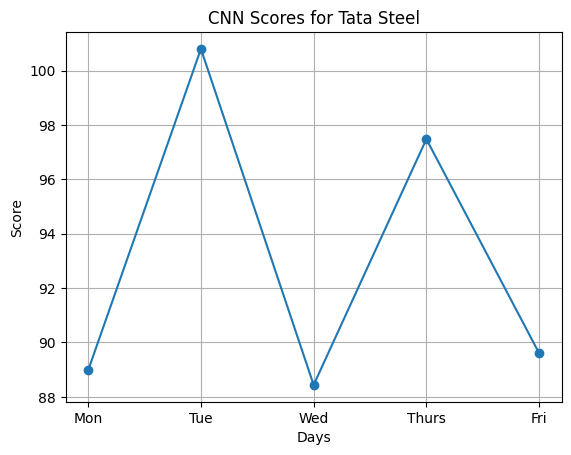

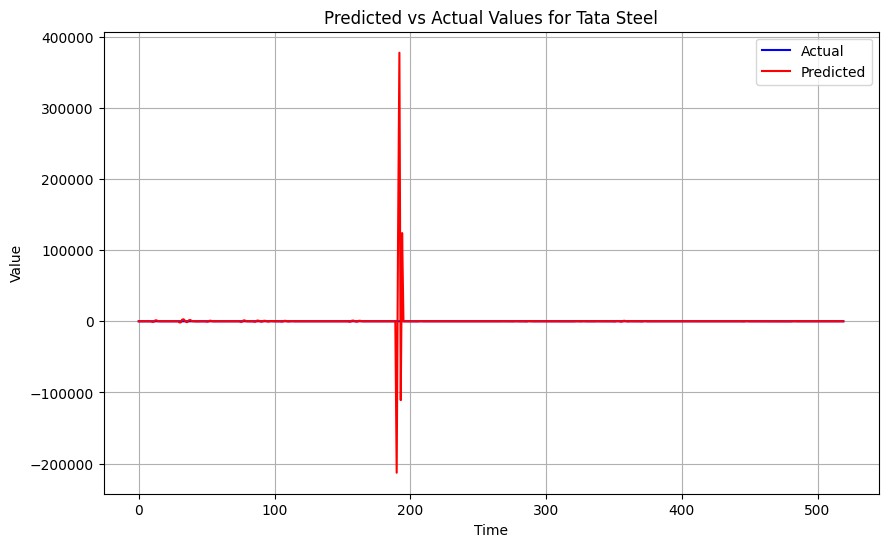

Evaluating model for Tata Consultancy Services
CNN_MULTI-10 for Tata Consultancy Services: [2376.958] 2356.5, 2998.7, 2306.5, 2130.1, 1961.3
Time taken for evaluation: 20.92131781578064 seconds
Value of x for Tata Consultancy Services: 98.90753016890491


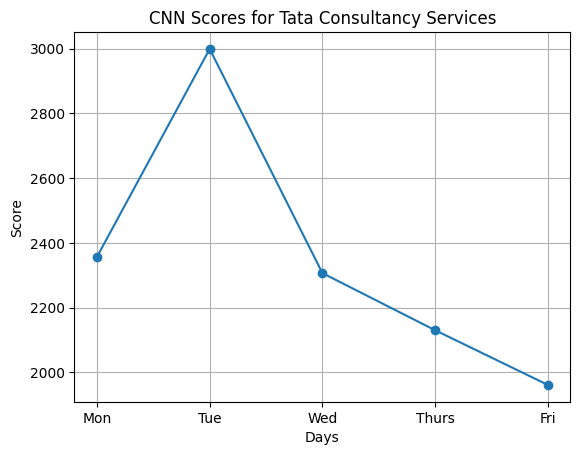

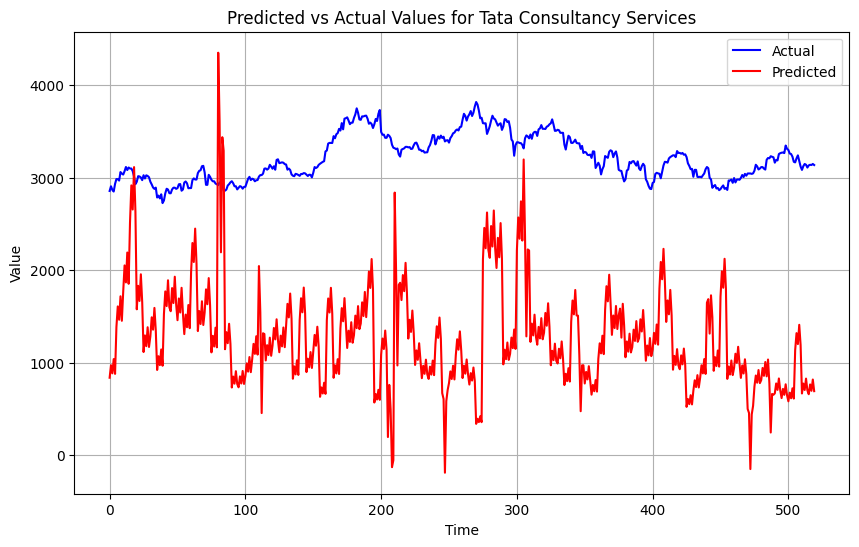

Evaluating model for State Bank of India
CNN_MULTI-10 for State Bank of India: [7781.105] 4712.4, 11074.2, 8480.5, 5144.4, 7713.6
Time taken for evaluation: 19.153055667877197 seconds
Value of x for State Bank of India: 2317.146581544748


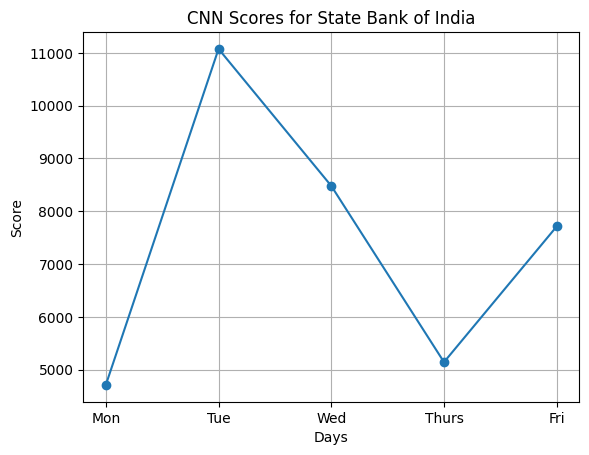

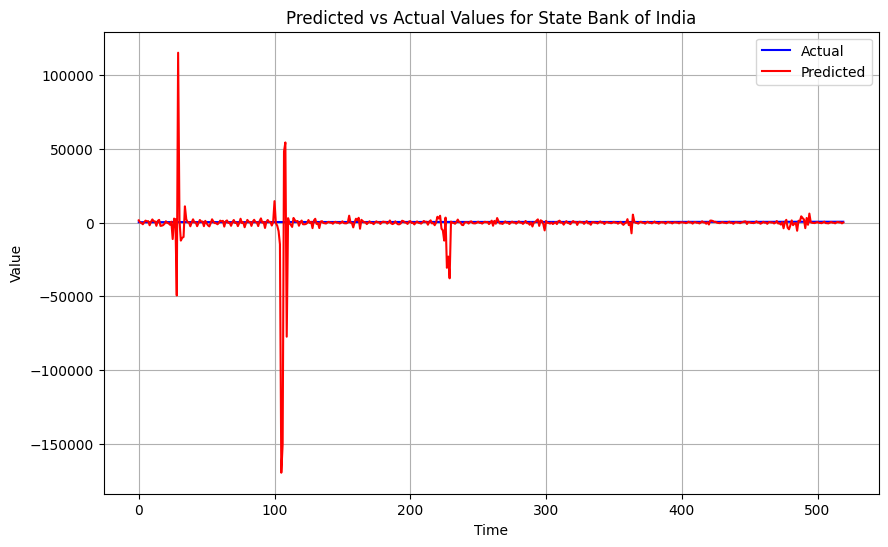

Evaluating model for Reliance Industries
CNN_MULTI-10 for Reliance Industries: [2108.238] 1930.3, 1898.5, 1682.2, 2229.3, 2663.4
Time taken for evaluation: 20.981828451156616 seconds
Value of x for Reliance Industries: 131.30329710077214


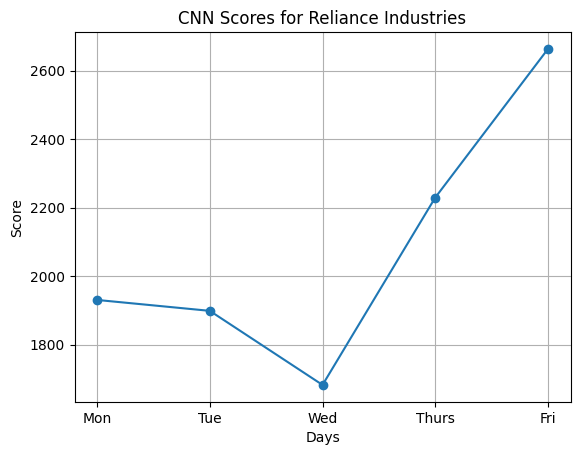

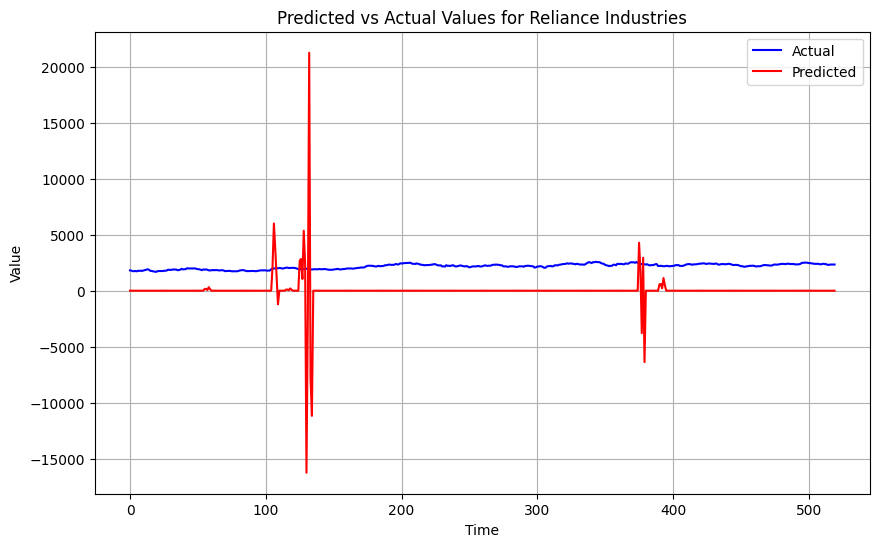

Evaluating model for NIFTY
CNN_MULTI-10 for NIFTY: [492.203] 409.8, 430.0, 499.0, 491.2, 606.8
Time taken for evaluation: 20.83353042602539 seconds
Value of x for NIFTY: 3.6972821832924843


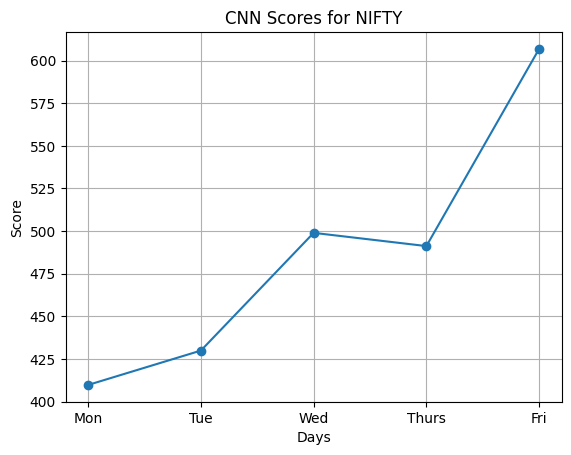

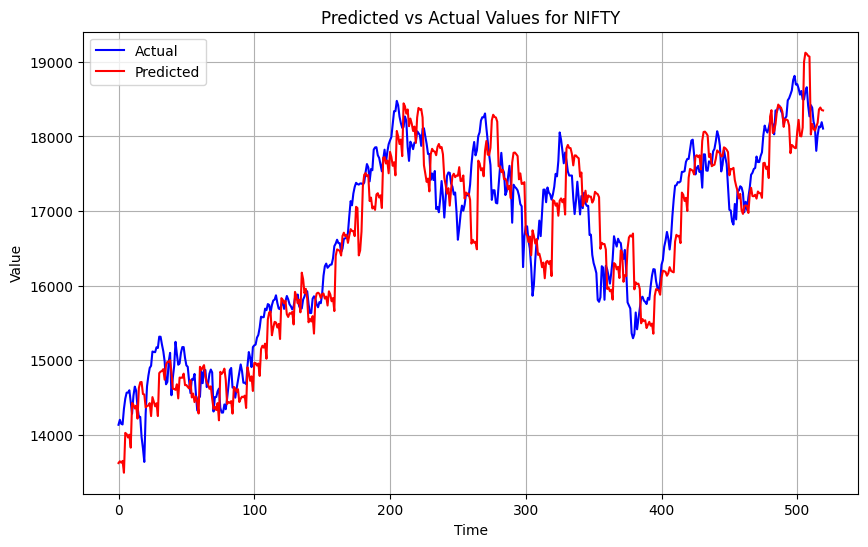

Evaluating model for S&P
CNN_MULTI-10 for S&P: [516826.529] 176982.9, 397882.8, 468818.3, 335330.5, 902040.7
Time taken for evaluation: 21.344712495803833 seconds
Value of x for S&P: 14986.264090067329


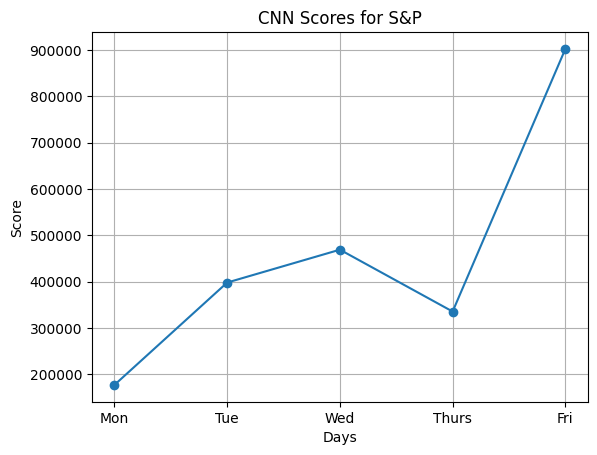

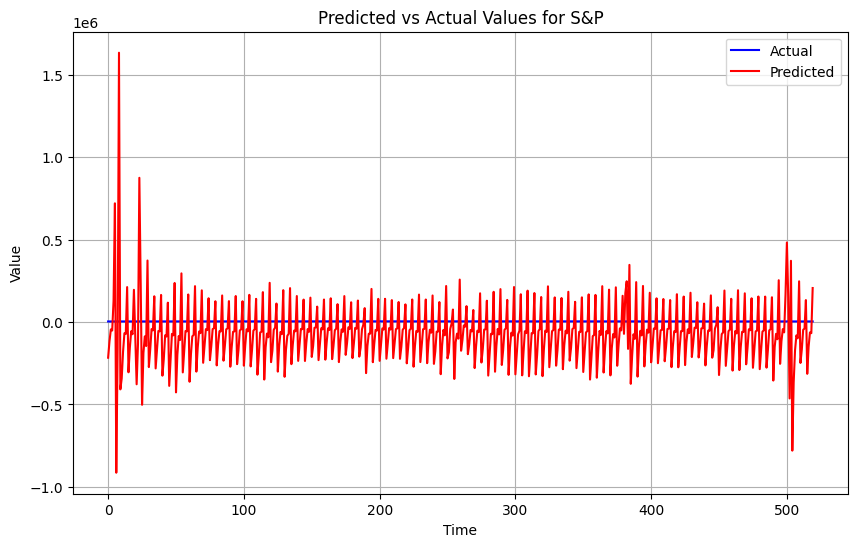

Evaluating model for Microsoft Corp
CNN_MULTI-10 for Microsoft Corp: [4250.723] 6348.2, 3704.5, 2928.3, 1960.7, 4889.0
Time taken for evaluation: 21.01468777656555 seconds
Value of x for Microsoft Corp: 2261.9186323767294


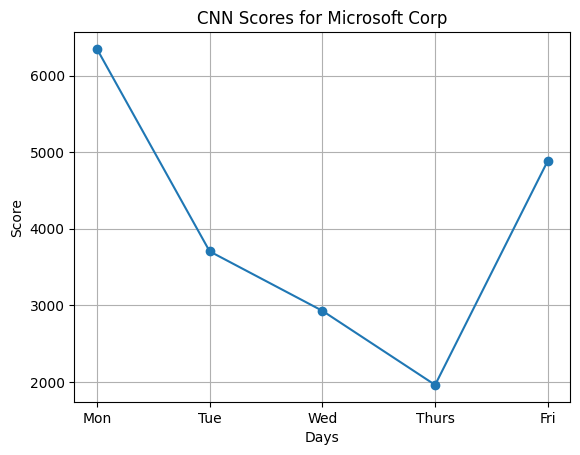

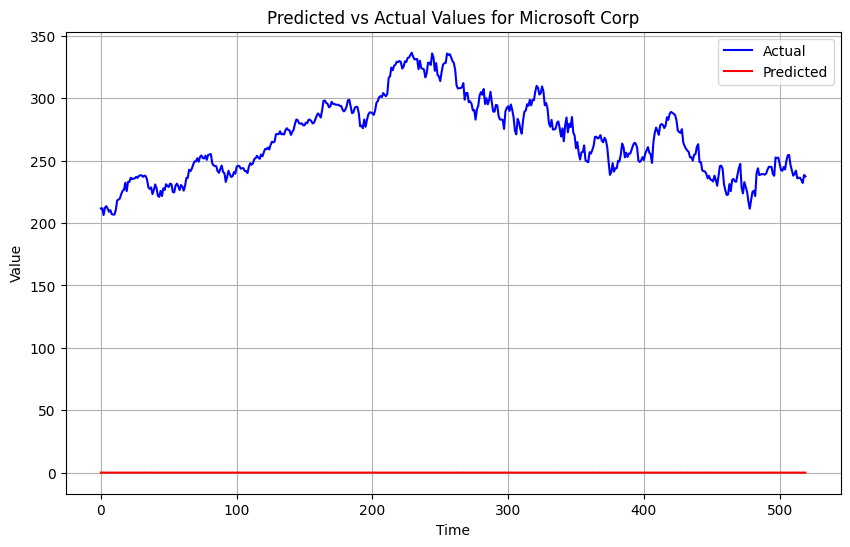

Evaluating model for Maruti Suzuki India Limited
CNN_MULTI-10 for Maruti Suzuki India Limited: [623.547] 681.3, 599.0, 635.1, 569.0, 627.6
Time taken for evaluation: 19.20041823387146 seconds
Value of x for Maruti Suzuki India Limited: 8.618974294315043


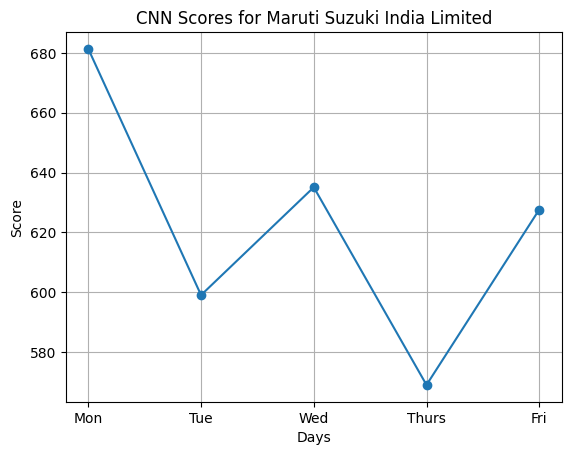

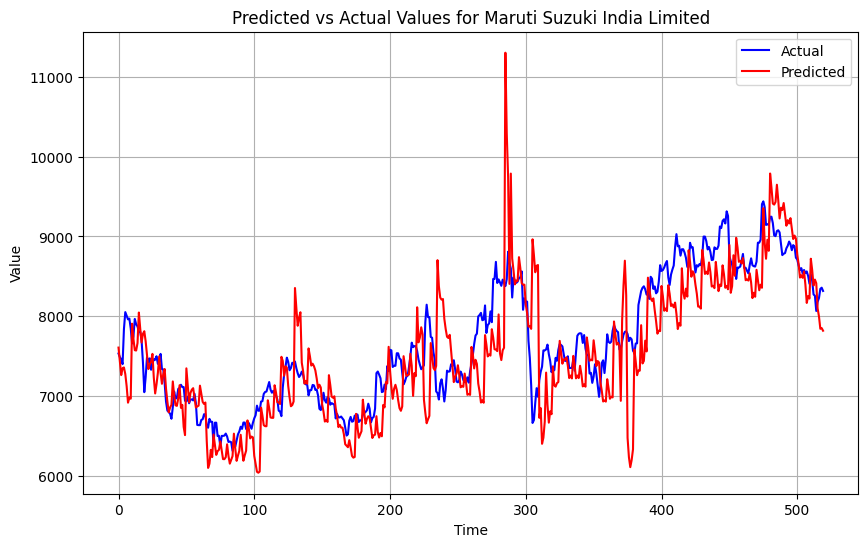

Evaluating model for Mahindra & Mahindra Limited
CNN_MULTI-10 for Mahindra & Mahindra Limited: [862.729] 972.4, 649.6, 656.2, 990.4, 970.8
Time taken for evaluation: 23.12836265563965 seconds
Value of x for Mahindra & Mahindra Limited: 115.44289883475096


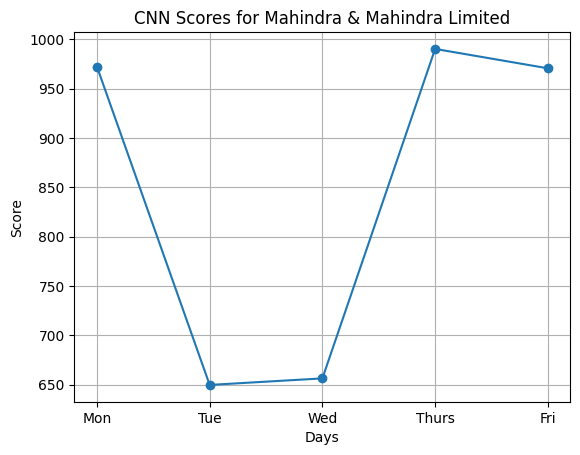

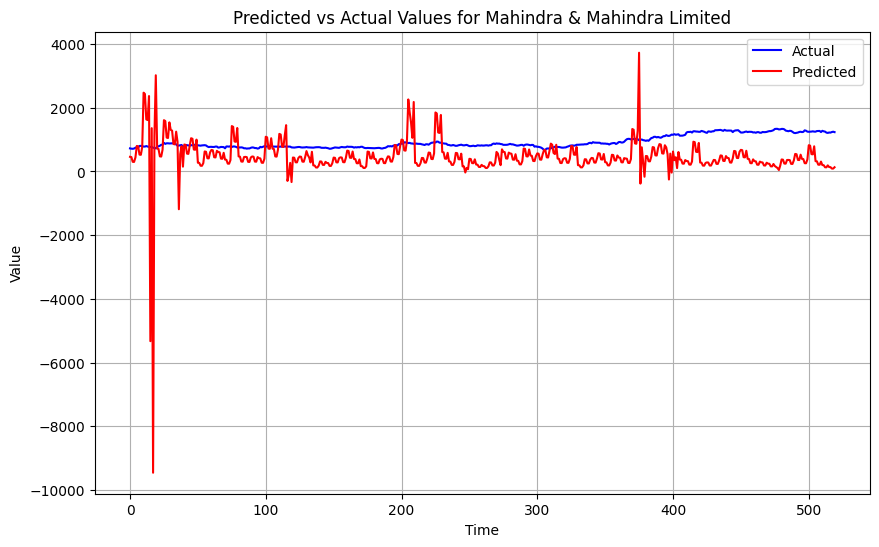

Evaluating model for JSW Steel Limited
CNN_MULTI-10 for JSW Steel Limited: [3391.287] 2626.8, 5036.4, 2127.1, 3765.6, 2556.3
Time taken for evaluation: 18.692610263824463 seconds
Value of x for JSW Steel Limited: 837.9969011698506


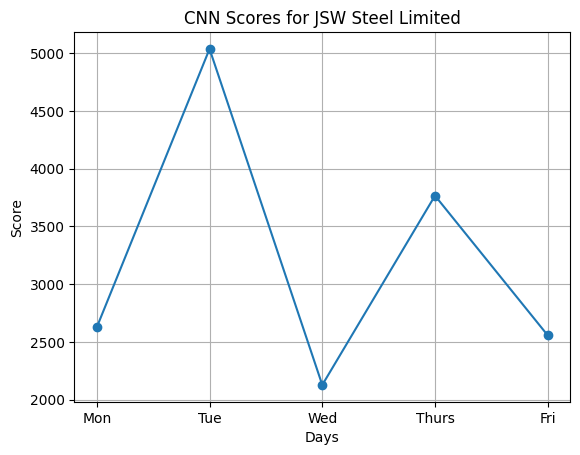

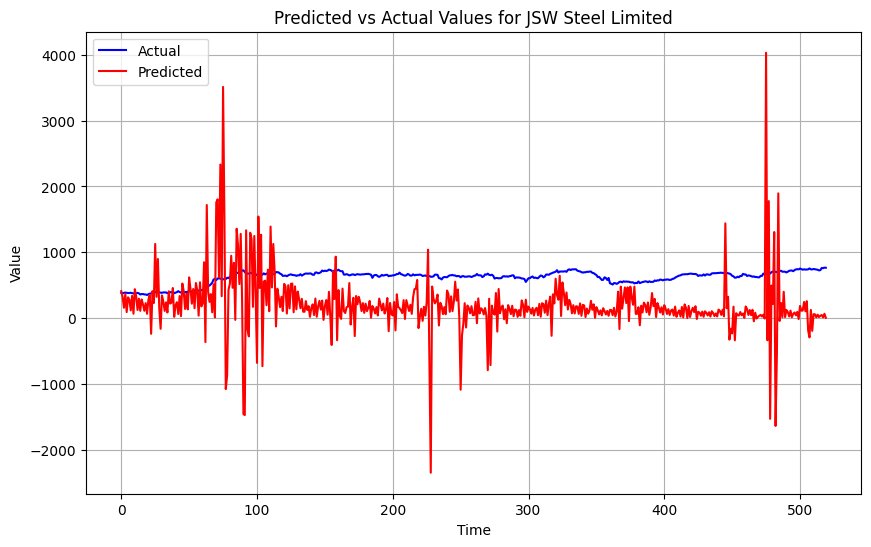

Evaluating model for Infosys Limited
CNN_MULTI-10 for Infosys Limited: [1267.514] 1065.4, 1330.5, 1466.3, 1208.7, 1231.4
Time taken for evaluation: 21.70676064491272 seconds
Value of x for Infosys Limited: 126.81928168726895


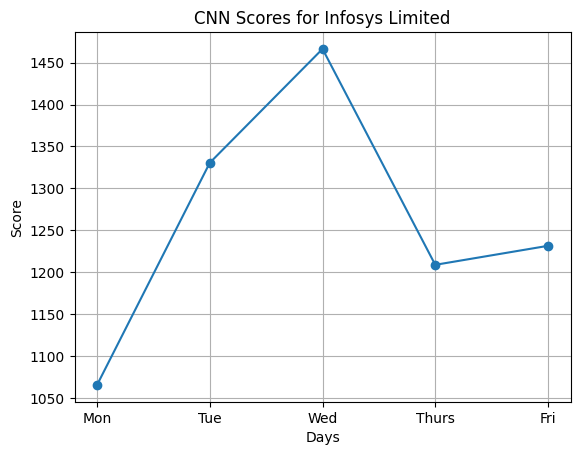

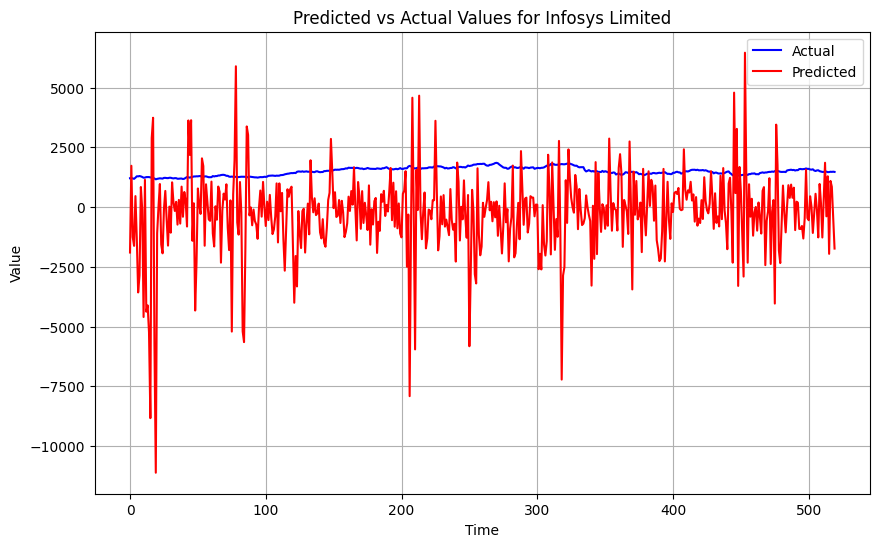

Evaluating model for ITC Limited
CNN_MULTI-10 for ITC Limited: [6976.555] 8441.3, 4249.4, 12144.6, 1338.4, 2183.0
Time taken for evaluation: 33.453848361968994 seconds
Value of x for ITC Limited: 3221.444119102923


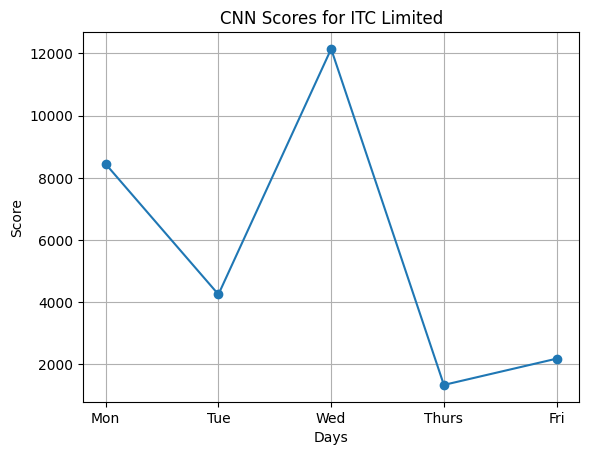

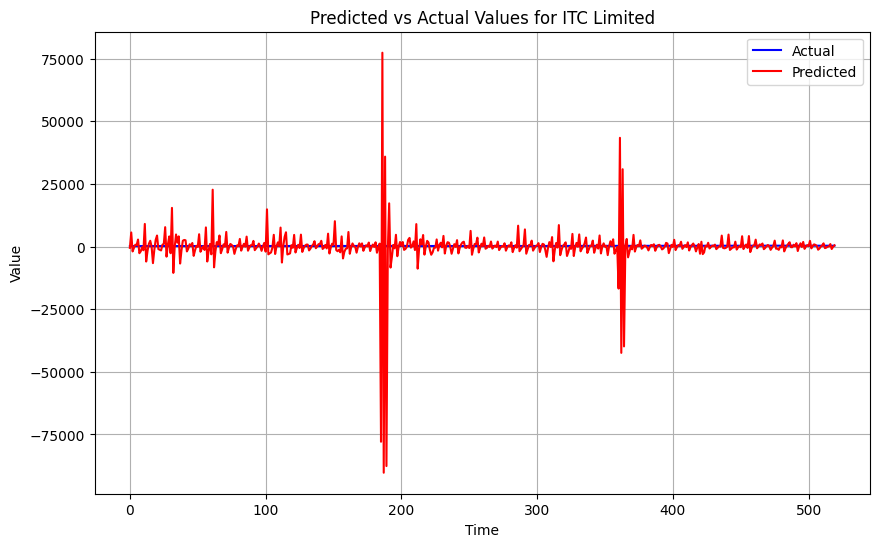

Evaluating model for Hindustan Unilever Ltd
CNN_MULTI-10 for Hindustan Unilever Ltd: [1875.018] 1685.9, 2305.4, 1942.3, 1732.9, 1626.6
Time taken for evaluation: 22.56912899017334 seconds
Value of x for Hindustan Unilever Ltd: 95.0450007625238


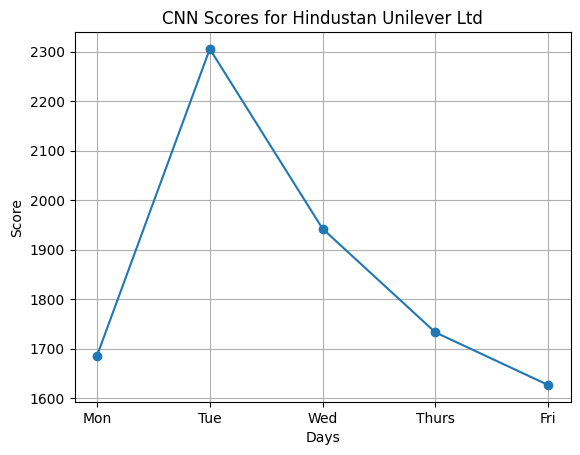

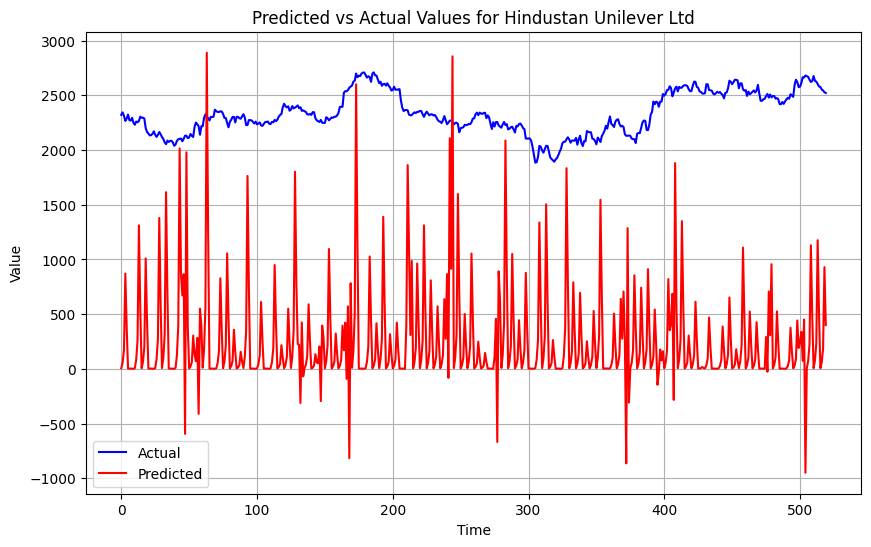

Evaluating model for HDFC Bank Limited
CNN_MULTI-10 for HDFC Bank Limited: [1121.433] 1108.9, 1100.2, 1058.7, 1196.5, 1138.1
Time taken for evaluation: 19.258573055267334 seconds
Value of x for HDFC Bank Limited: 91.96971766190467


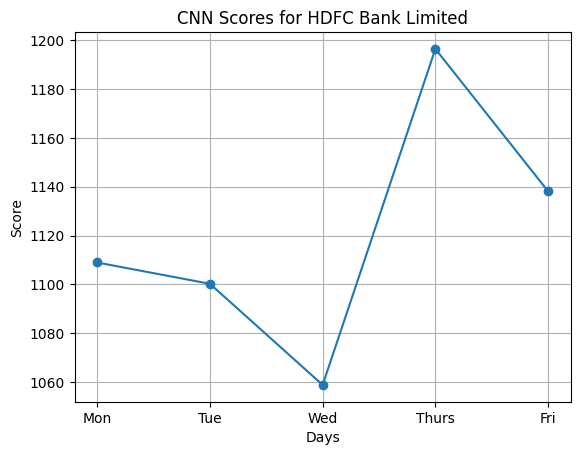

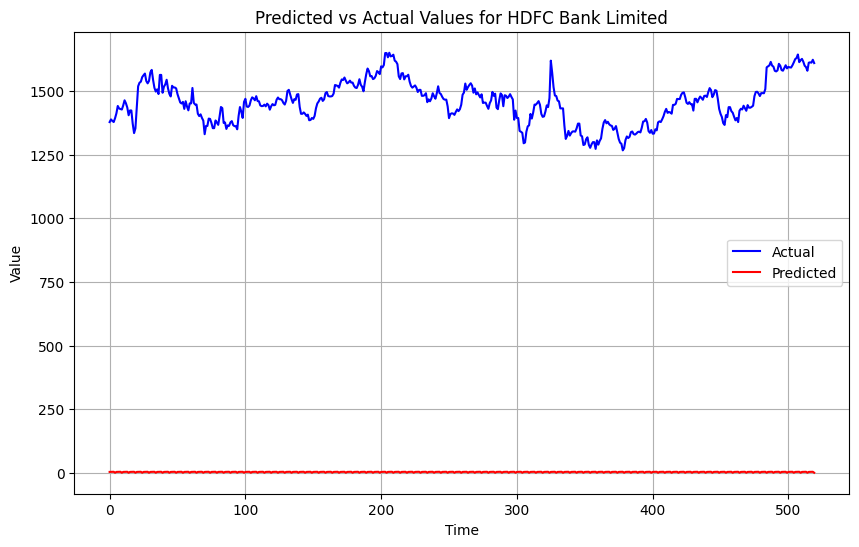

In [ ]:
import csv
# File path to save the results
csv_file_path = 'RESULTS_CNN_MULTI-10.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'CNN_MULTI-10 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['CNN_MULTI-10', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='CNN')
    plt.title(f'CNN Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'CNN_MILTI-10{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Pre_vs_Act_CNN_MULTI-10 {name}.png', dpi=300)
    plt.show()


Evaluating model for Tata Steel
CNN_MULTI-10 for Tata Steel: [3178.487] 2610.3, 1560.0, 5251.0, 1404.4, 3423.7
Time taken for evaluation: 22.62657880783081 seconds
Value of x for Tata Steel: 4851.529479164127


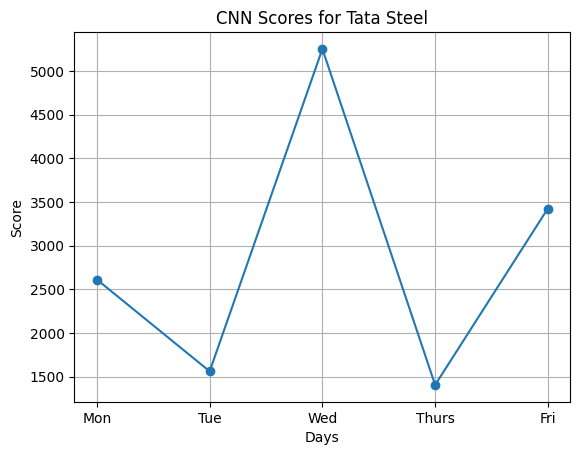

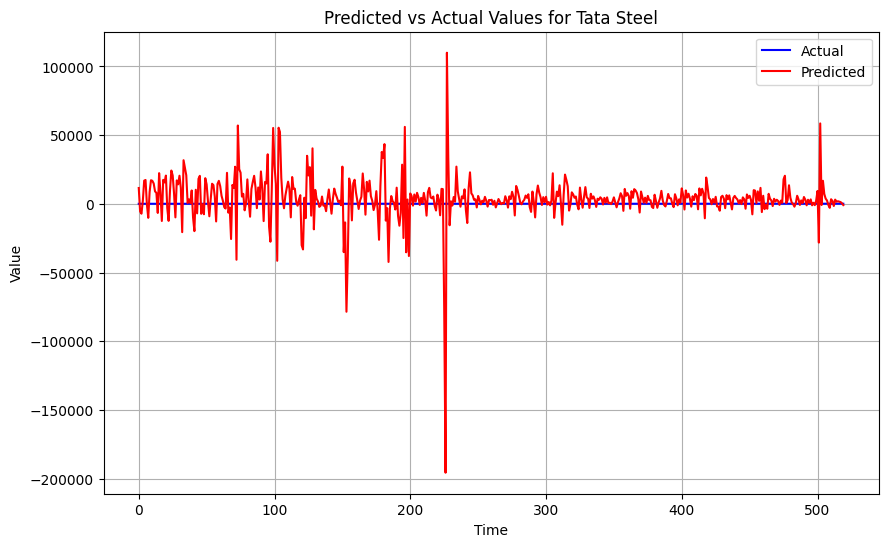

Evaluating model for Tata Consultancy Services
CNN_MULTI-10 for Tata Consultancy Services: [2568.099] 2505.7, 2584.0, 2470.5, 2490.6, 2777.4
Time taken for evaluation: 21.08242416381836 seconds
Value of x for Tata Consultancy Services: 106.86107231565892


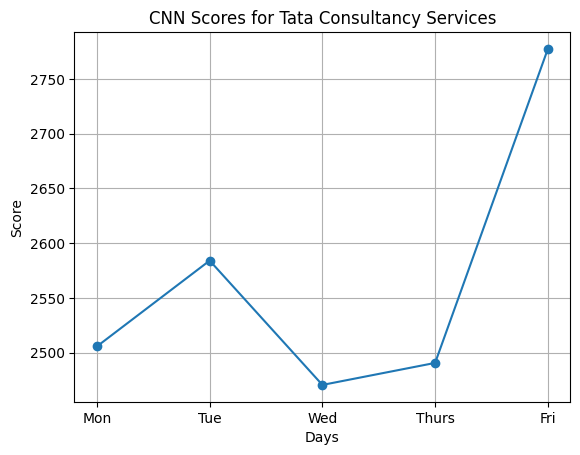

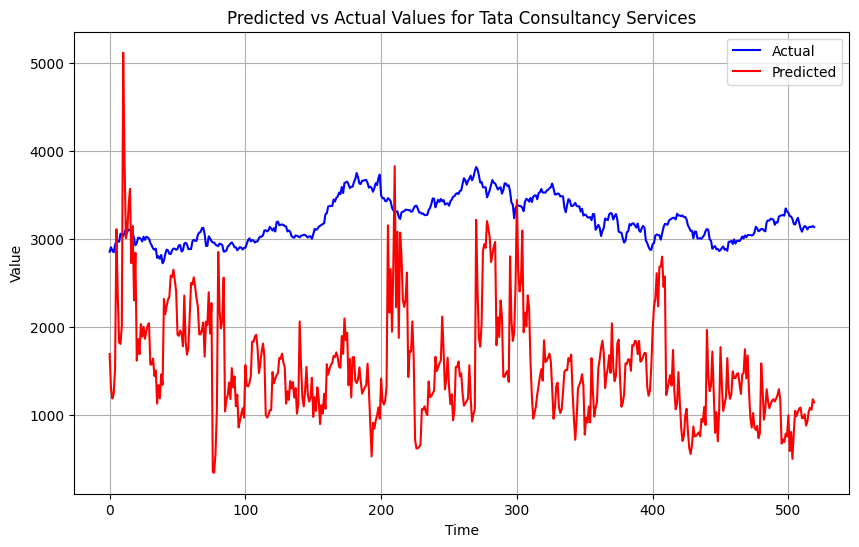

Evaluating model for State Bank of India
CNN_MULTI-10 for State Bank of India: [15958.444] 13881.4, 19453.5, 16630.7, 15721.8, 13359.4
Time taken for evaluation: 27.390443801879883 seconds
Value of x for State Bank of India: 4752.288670763834


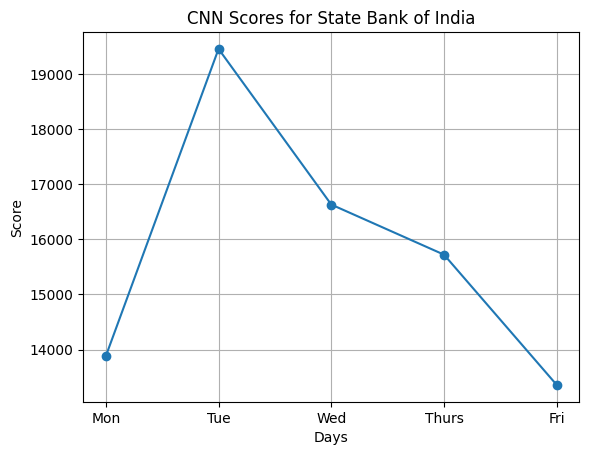

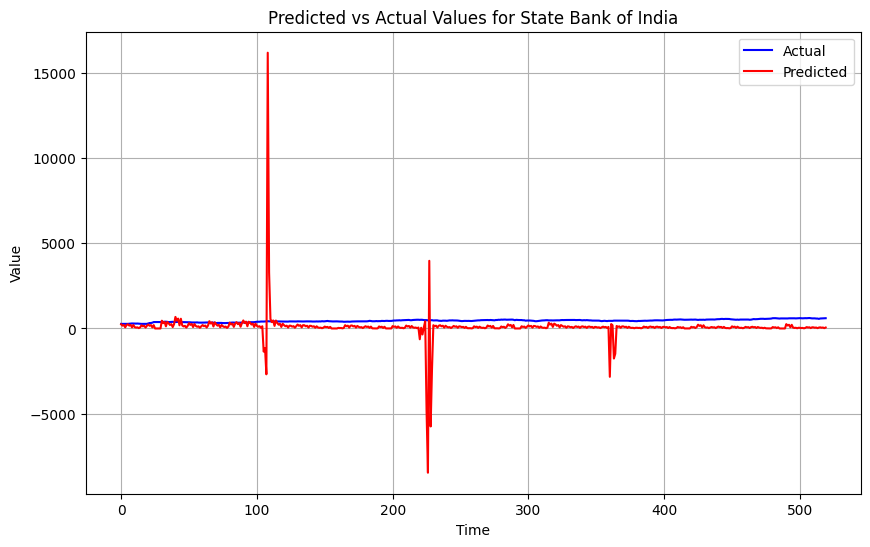

Evaluating model for Reliance Industries
CNN_MULTI-10 for Reliance Industries: [1678.240] 1597.8, 1737.6, 1288.4, 1802.8, 1897.5
Time taken for evaluation: 22.90215563774109 seconds
Value of x for Reliance Industries: 104.52254714406872


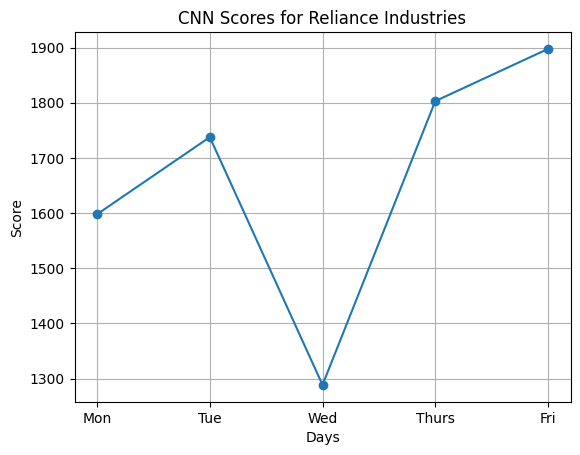

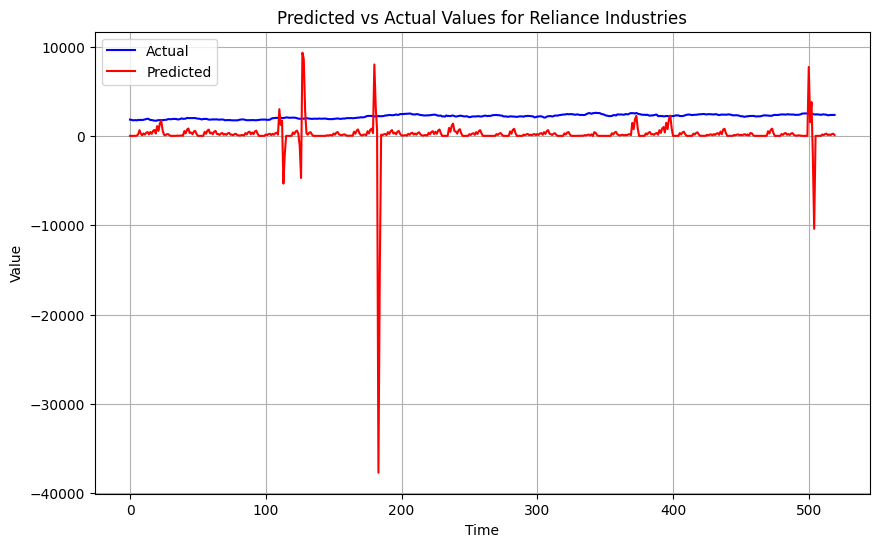

Evaluating model for NIFTY
CNN_MULTI-10 for NIFTY: [465.989] 440.7, 424.7, 446.8, 488.0, 522.9
Time taken for evaluation: 21.48217797279358 seconds
Value of x for NIFTY: 3.5003752235883847


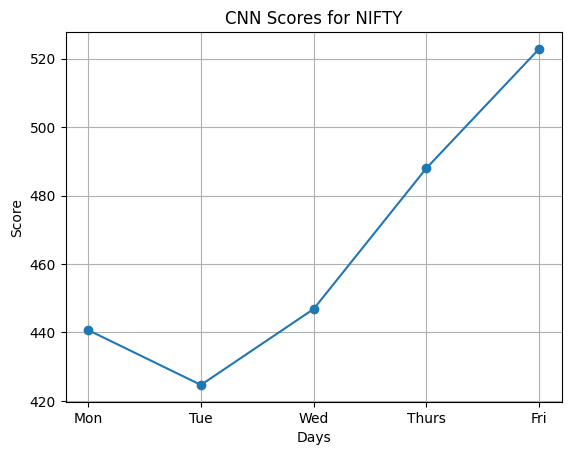

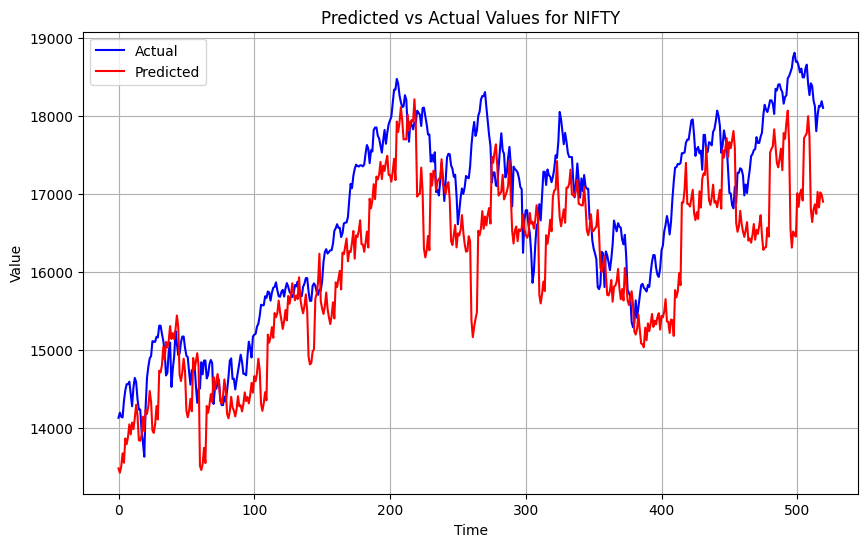

Evaluating model for S&P
CNN_MULTI-10 for S&P: [832682.760] 788809.4, 1112748.7, 998221.7, 259591.6, 736572.2
Time taken for evaluation: 21.97024917602539 seconds
Value of x for S&P: 24145.052641335853


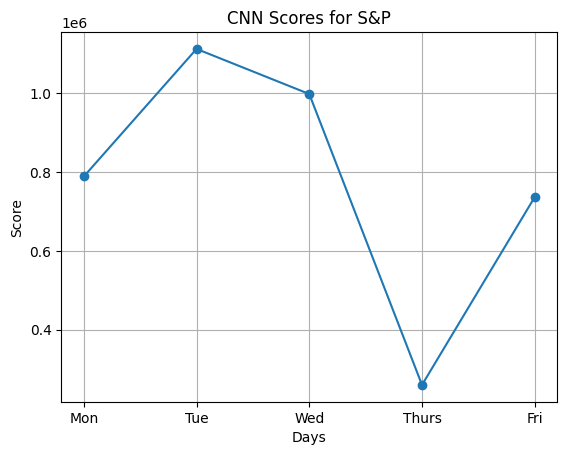

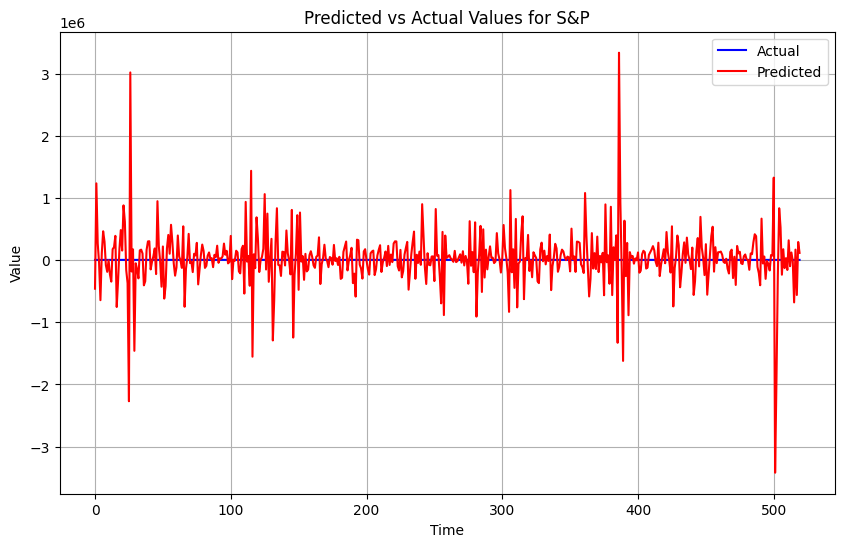

Evaluating model for Microsoft Corp
CNN_MULTI-10 for Microsoft Corp: [268.348] 268.8, 267.3, 268.3, 268.2, 269.1
Time taken for evaluation: 21.850316286087036 seconds
Value of x for Microsoft Corp: 142.79497845668982


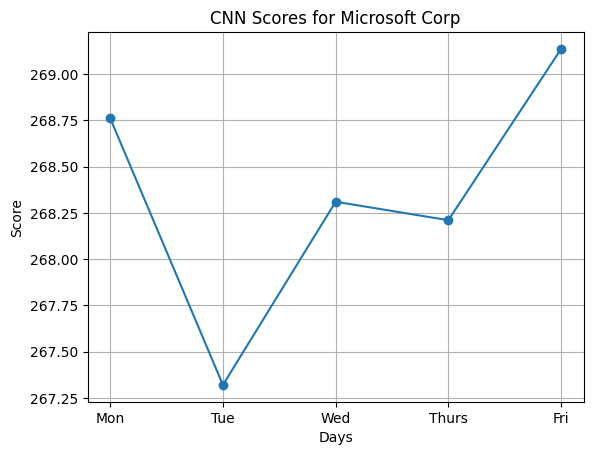

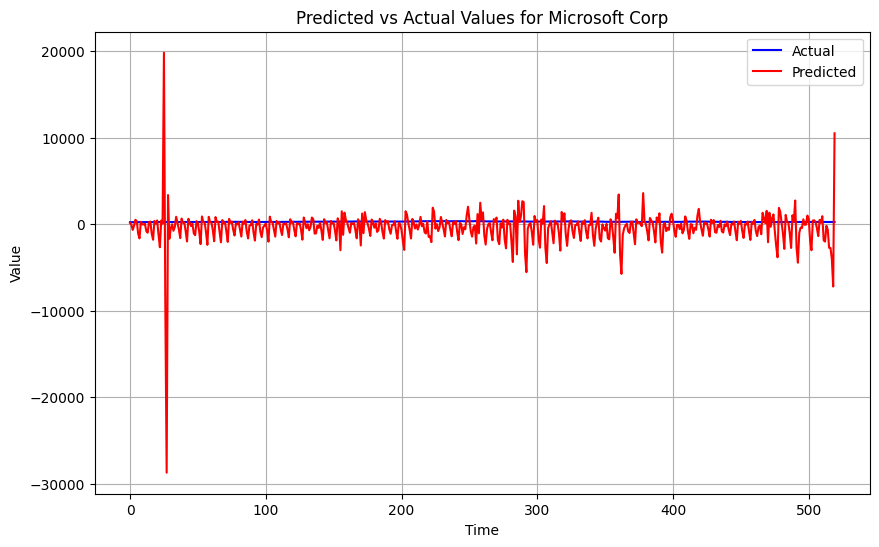

Evaluating model for Maruti Suzuki India Limited
CNN_MULTI-10 for Maruti Suzuki India Limited: [622.842] 616.9, 637.2, 608.9, 622.8, 628.1
Time taken for evaluation: 19.402186393737793 seconds
Value of x for Maruti Suzuki India Limited: 8.609228614079196


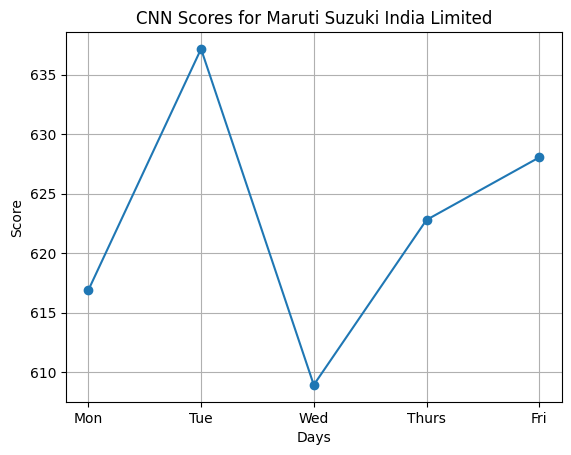

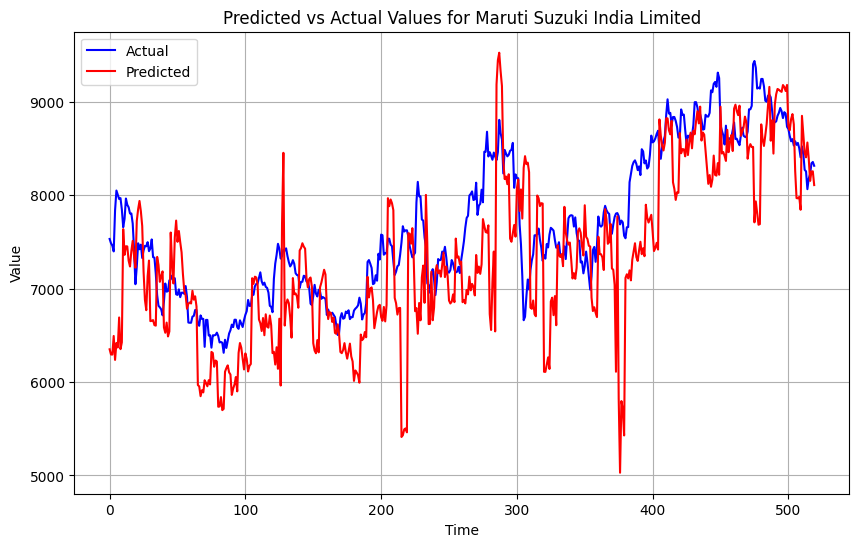

Evaluating model for Mahindra & Mahindra Limited
CNN_MULTI-10 for Mahindra & Mahindra Limited: [903.901] 631.0, 809.2, 772.7, 748.5, 1369.3
Time taken for evaluation: 19.477372884750366 seconds
Value of x for Mahindra & Mahindra Limited: 120.95222202471064


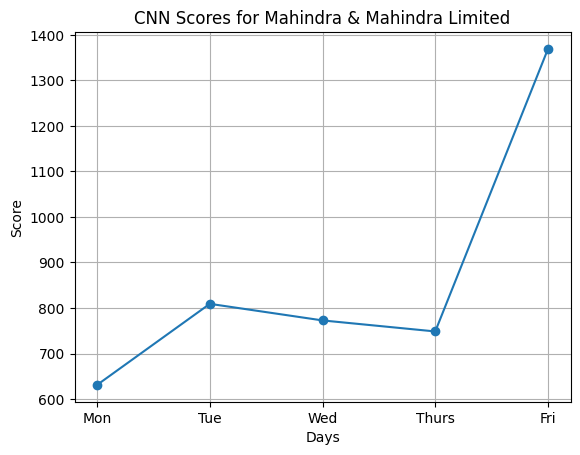

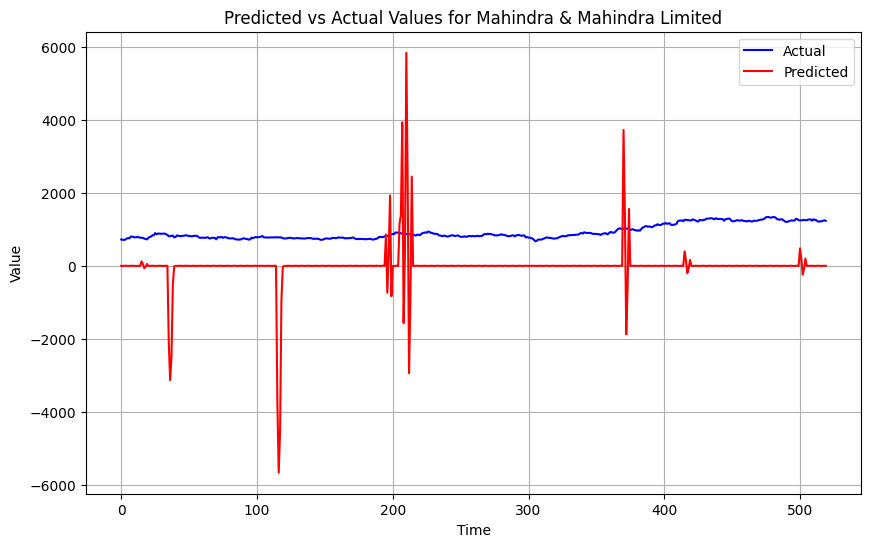

Evaluating model for JSW Steel Limited
CNN_MULTI-10 for JSW Steel Limited: [1884.460] 638.0, 3716.3, 842.5, 863.2, 1443.2
Time taken for evaluation: 20.999340057373047 seconds
Value of x for JSW Steel Limited: 465.6556498162486


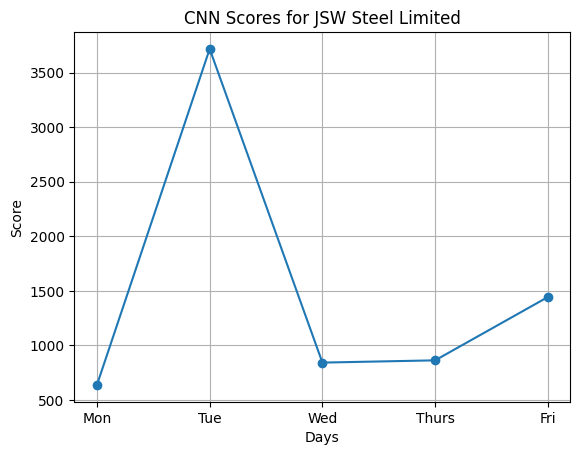

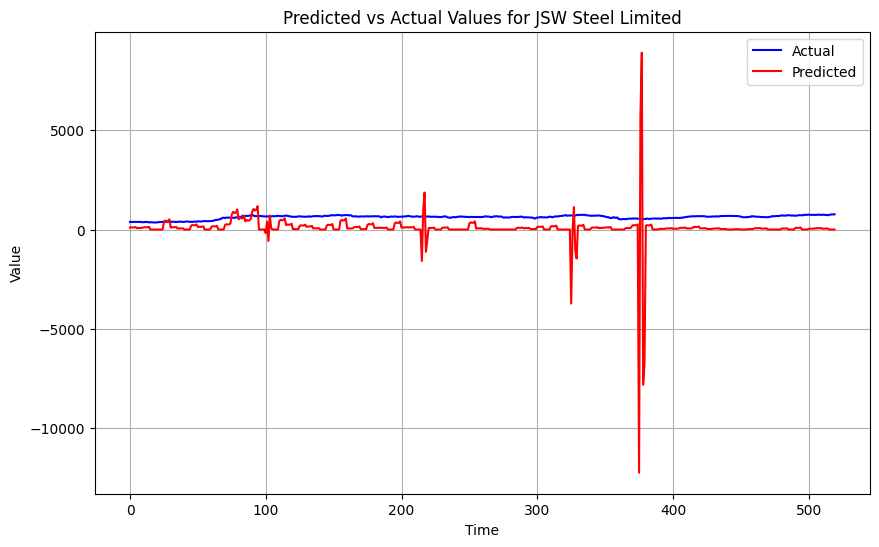

Evaluating model for Infosys Limited
CNN_MULTI-10 for Infosys Limited: [2385.437] 2327.3, 2305.9, 2032.5, 1328.6, 3438.3
Time taken for evaluation: 18.661588191986084 seconds
Value of x for Infosys Limited: 238.67146468471992


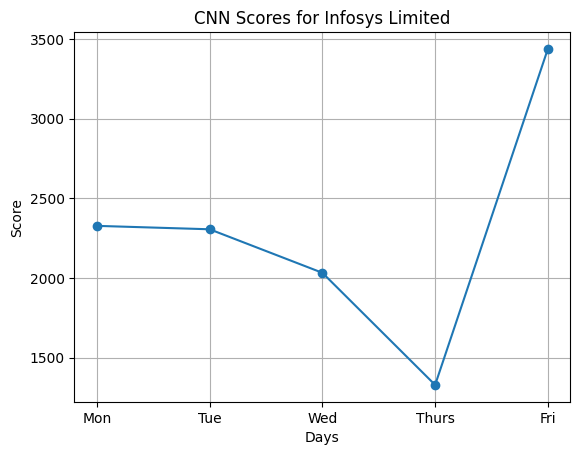

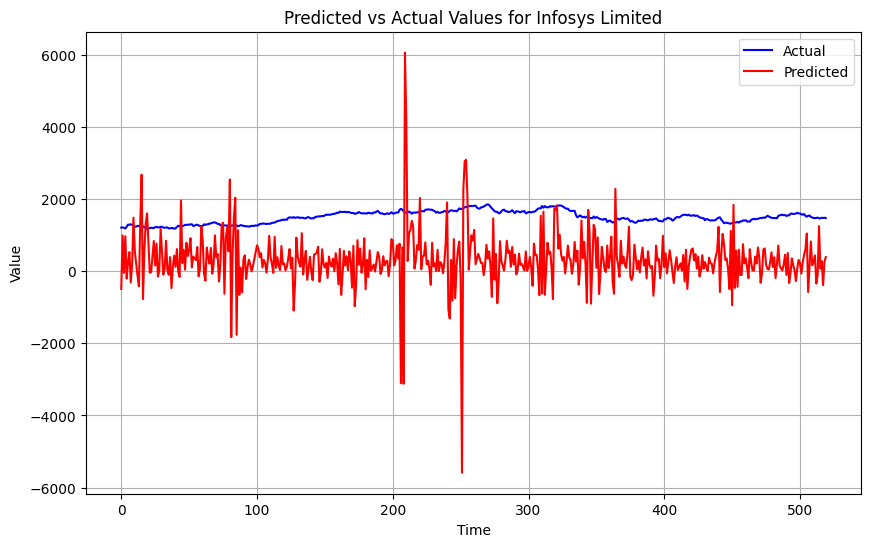

Evaluating model for ITC Limited
CNN_MULTI-10 for ITC Limited: [4109.968] 3882.6, 3378.6, 1000.5, 1252.8, 7443.0
Time taken for evaluation: 25.63457703590393 seconds
Value of x for ITC Limited: 1897.7892180452536


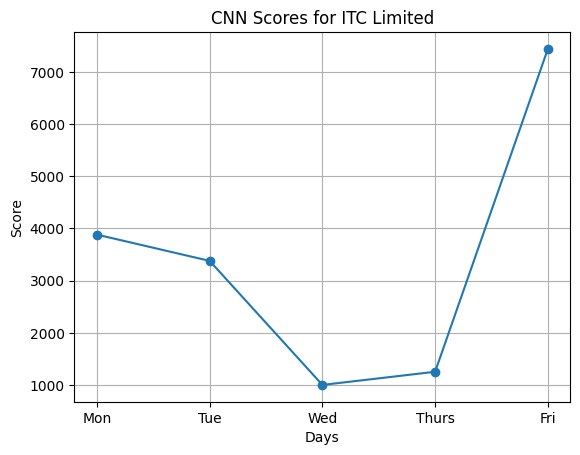

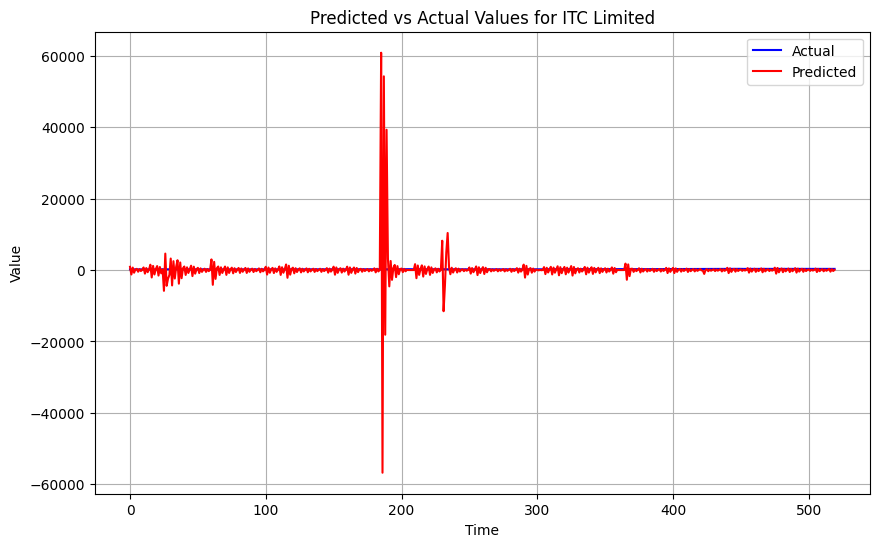

Evaluating model for Hindustan Unilever Ltd
CNN_MULTI-10 for Hindustan Unilever Ltd: [1947.717] 1810.0, 1635.3, 1695.1, 2354.3, 2145.1
Time taken for evaluation: 21.541933298110962 seconds
Value of x for Hindustan Unilever Ltd: 98.73008782428747


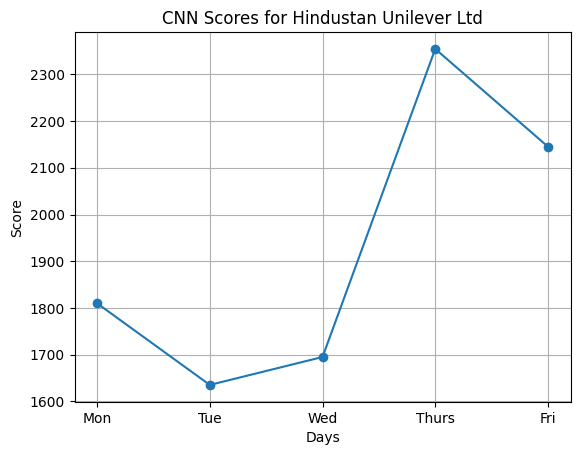

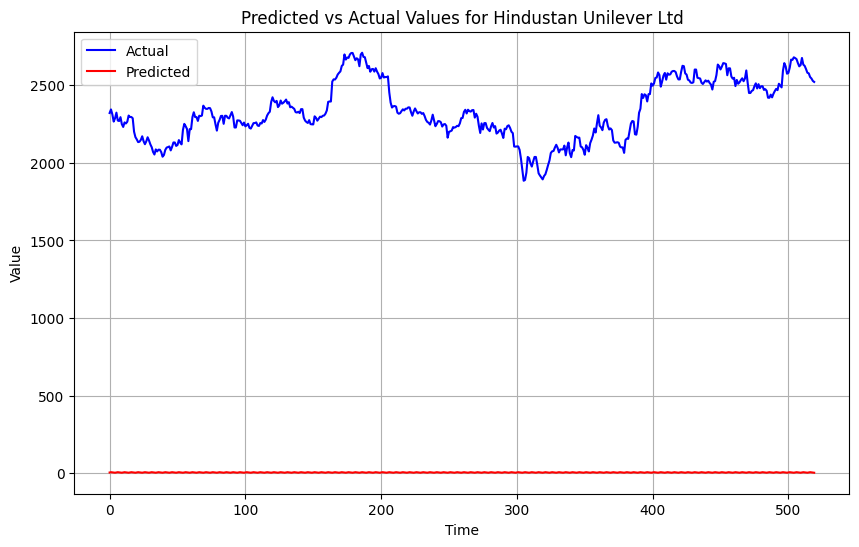

Evaluating model for HDFC Bank Limited
CNN_MULTI-10 for HDFC Bank Limited: [1453.395] 1452.7, 1454.7, 1453.9, 1452.5, 1453.2
Time taken for evaluation: 20.88622808456421 seconds
Value of x for HDFC Bank Limited: 119.19421370939554


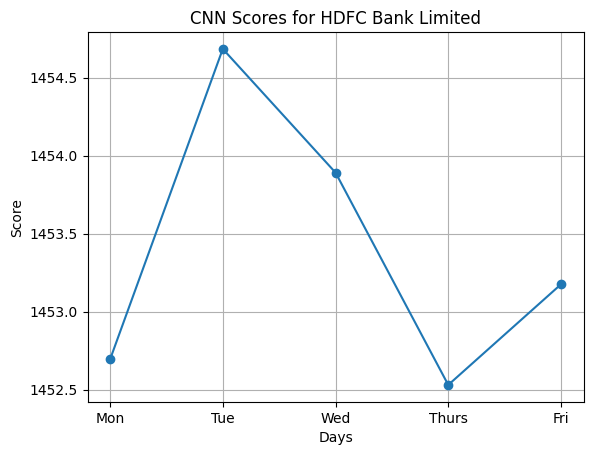

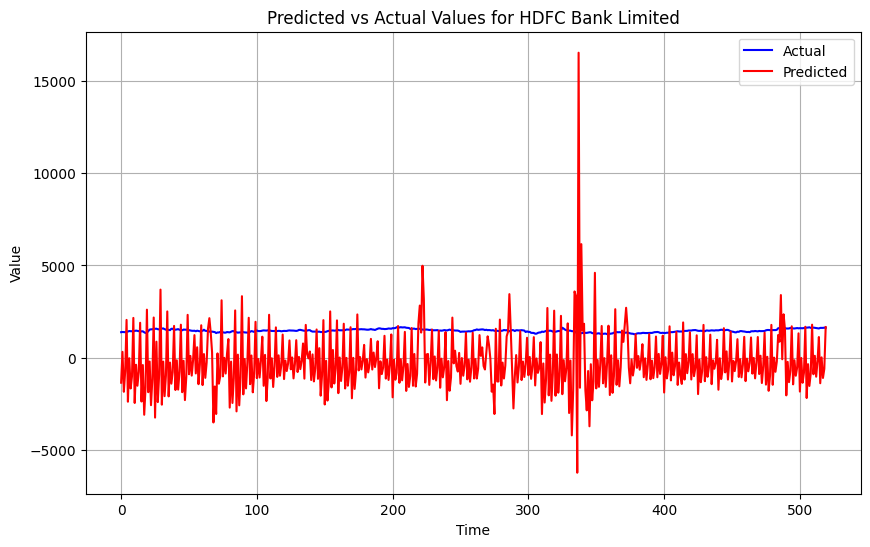

In [ ]:
import csv
# File path to save the results
csv_file_path = 'RESULTS_CNN_MULTI-10.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'CNN_MULTI-10 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['CNN_MULTI-10', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='CNN')
    plt.title(f'CNN Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'CNN_MILTI-10{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Pre_vs_Act_CNN_MULTI-10 {name}.png', dpi=300)
    plt.show()

# LSTM_MULTI_10

In [ ]:
# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(actual, predicted):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(actual.shape[1]):
        # calculate mse
        mse = mean_squared_error(actual[:, i], predicted[:, i])
        # calculate rmse
        rmse = sqrt(mse)
        # store
        scores.append(rmse)
    # calculate overall RMSE
    s = 0
    for row in range(actual.shape[0]):
        for col in range(actual.shape[1]):
            s += (actual[row, col] - predicted[row, col])**2
    score = sqrt(s / (actual.shape[0] * actual.shape[1]))
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

# convert history into inputs and outputs
def to_supervised(train, n_input, n_out=5):
    # flatten data
    data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
    X, y = list(), list()
    in_start = 0
    # step over the entire history one time step at a time
    for _ in range(len(data)):
        # define the end of the input sequence
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= len(data):
            X.append(data[in_start:in_end, :])
            y.append(data[in_end:out_end, 0])
        # move along one time step
        in_start += 1
    return array(X), array(y)

# train the model
def LSTM_MULTI_10(train, n_input):
    # prepare data
    train_x, train_y = to_supervised(train, n_input)
    # define parameters
    verbose, epochs, batch_size = 0, 20, 4
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]
    # define model
    model = Sequential()
    model.add(LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(n_outputs))
    model.compile(loss='mse', optimizer='adam')
    # fit network
    model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
    return model

# make a forecast
def forecast(model, history, n_input):
    # flatten data
    data = array(history)
    data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))
    # retrieve last observations for input data
    input_x = data[-n_input:, :]
    # reshape into [1, n_input, n]
    input_x = input_x.reshape((1, input_x.shape[0], input_x.shape[1]))
    # forecast the next week
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    yhat = yhat[0]
    return yhat

# evaluate a single model
def evaluate_model(train, test, n_input):
    # fit model
    model = LSTM_MULTI_10(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test[:, :, 0], predictions)
    return score, scores


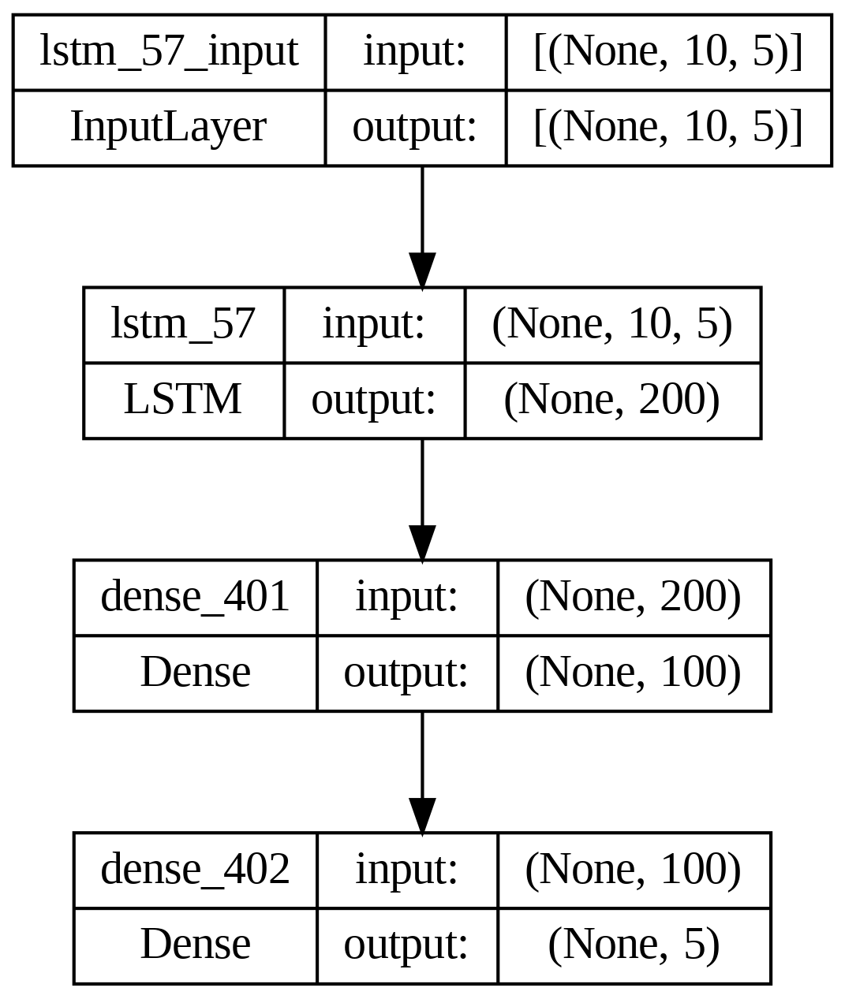

In [ ]:
n_input = 10
model = LSTM_MULTI_10(train, n_input)
plot_model(model, to_file='LSTM_MULTI_10.png', dpi = 300, show_shapes=True)

In [ ]:
model.summary()

Model: "sequential_172"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_57 (LSTM)              (None, 200)               164800    
                                                                 
 dense_401 (Dense)           (None, 100)               20100     
                                                                 
 dense_402 (Dense)           (None, 5)                 505       
                                                                 
Total params: 185405 (724.24 KB)
Trainable params: 185405 (724.24 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
def prediction_graph(train, test, n_input):
    # fit model
    model = LSTM_MULTI_10(train, n_input)
    # history is a list of weekly data
    history = [x for x in train]
    # walk-forward validation over each week
    predictions = list()
    actuals = list()
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        actuals.append(test[i, :, 0])  # Store actual values
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
    # evaluate predictions days for each week
    predictions = array(predictions)
    actuals = array(actuals)
    score, scores = evaluate_forecasts(actuals, predictions)
    return score, scores, actuals, predictions

Evaluating model for Tata Steel
LSTM_MULTI-10 for Tata Steel: [114061.900] 87360.1, 181917.1, 39693.5, 63999.6, 136577.6
Time taken for evaluation: 94.75388312339783 seconds
Value of x for Tata Steel: 174100.01991621108


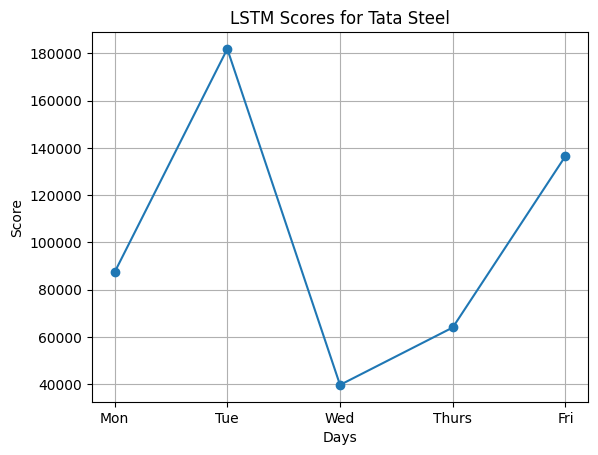

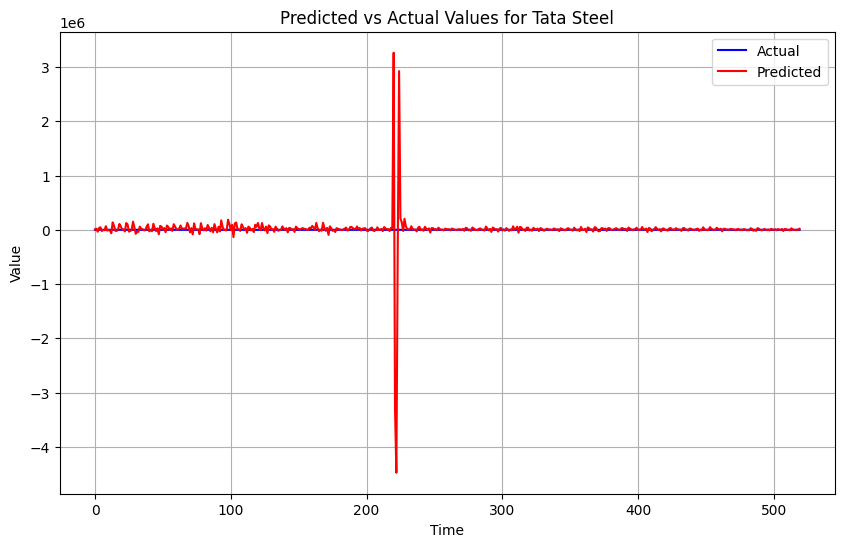

Evaluating model for Tata Consultancy Services
LSTM_MULTI-10 for Tata Consultancy Services: [5513.651] 5725.8, 6222.1, 4606.3, 6937.8, 3339.4
Time taken for evaluation: 70.44789505004883 seconds
Value of x for Tata Consultancy Services: 229.42835779907506


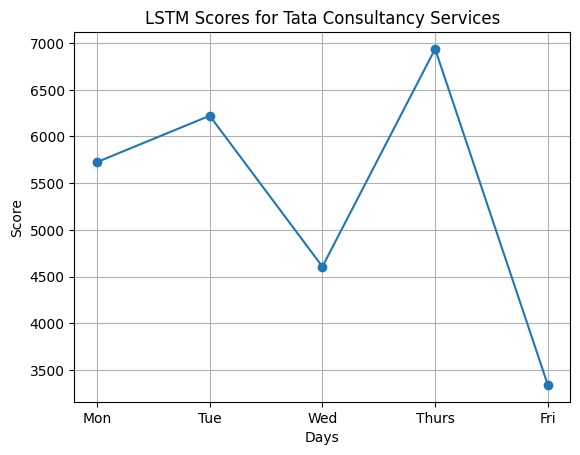

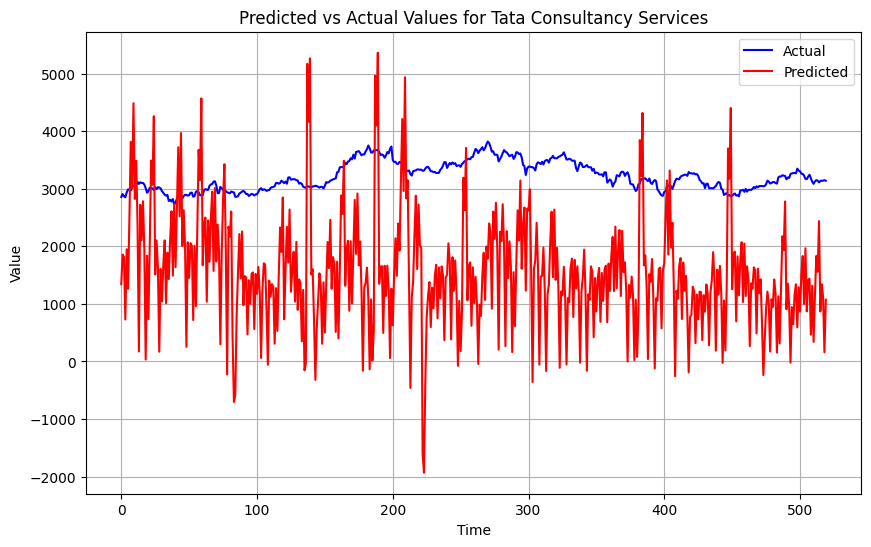

Evaluating model for State Bank of India
LSTM_MULTI-10 for State Bank of India: [35460.227] 22427.1, 35124.8, 33088.1, 40714.7, 42401.8
Time taken for evaluation: 93.96608138084412 seconds
Value of x for State Bank of India: 10559.753369327518


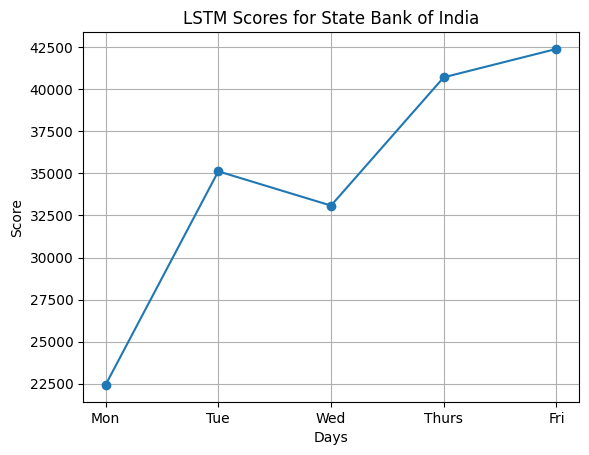

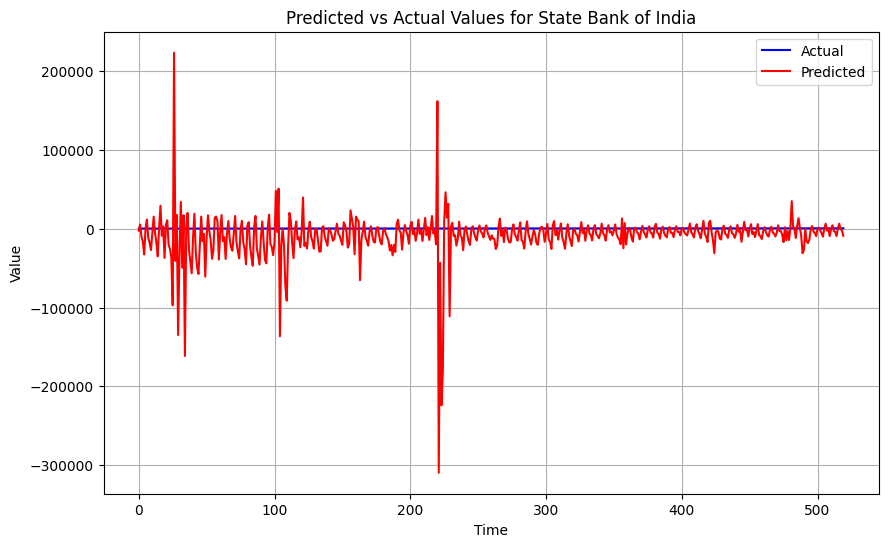

Evaluating model for Reliance Industries
LSTM_MULTI-10 for Reliance Industries: [8740.267] 6566.2, 11669.6, 9940.2, 4080.7, 9338.5
Time taken for evaluation: 94.26679348945618 seconds
Value of x for Reliance Industries: 544.3531239339256


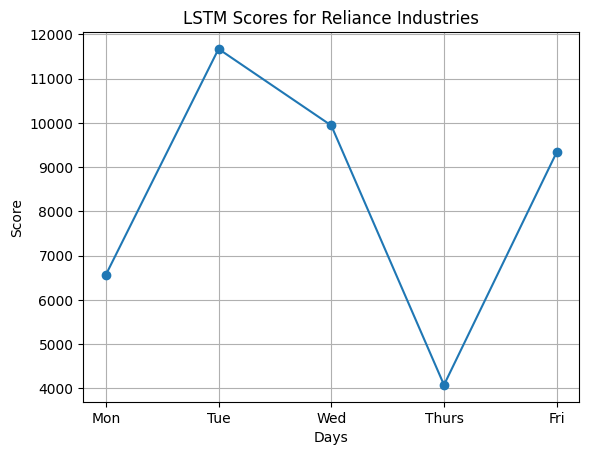

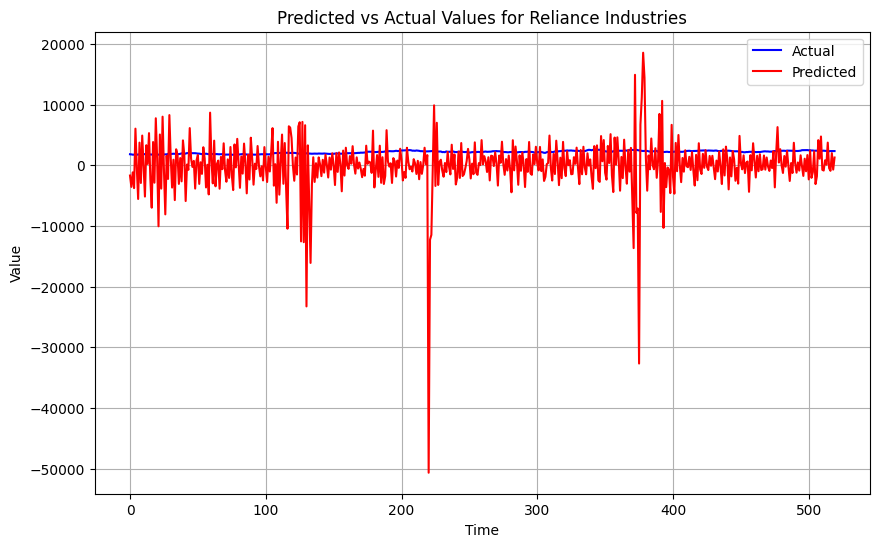

Evaluating model for NIFTY
LSTM_MULTI-10 for NIFTY: [736.615] 839.6, 650.4, 642.7, 759.5, 771.5
Time taken for evaluation: 94.1580171585083 seconds
Value of x for NIFTY: 5.533235258279736


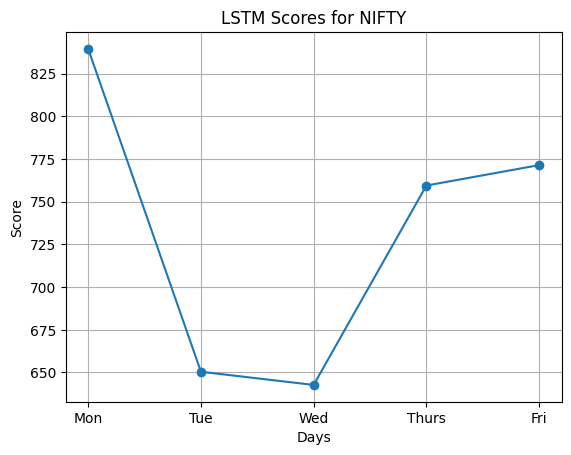

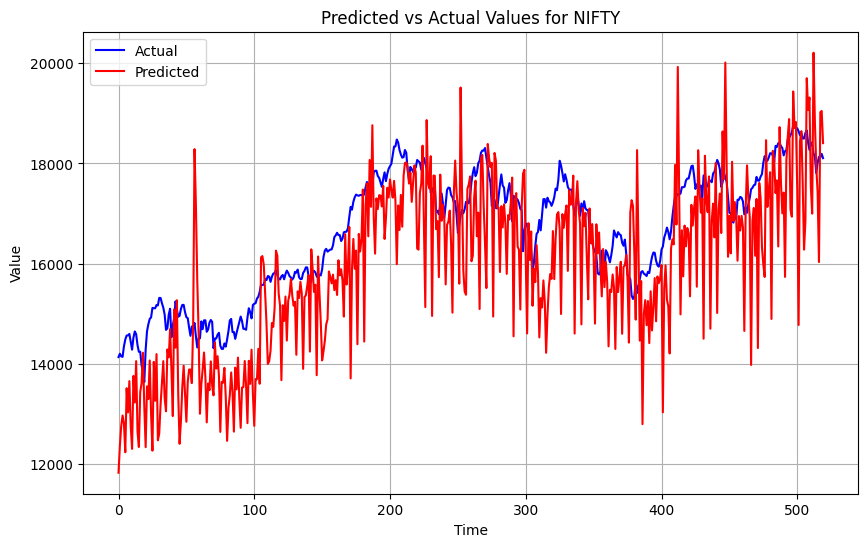

Evaluating model for S&P
LSTM_MULTI-10 for S&P: [2832171.829] 2131184.9, 1242946.2, 5544419.7, 1305996.6, 1254155.0
Time taken for evaluation: 70.09829521179199 seconds
Value of x for S&P: 82123.63845497154


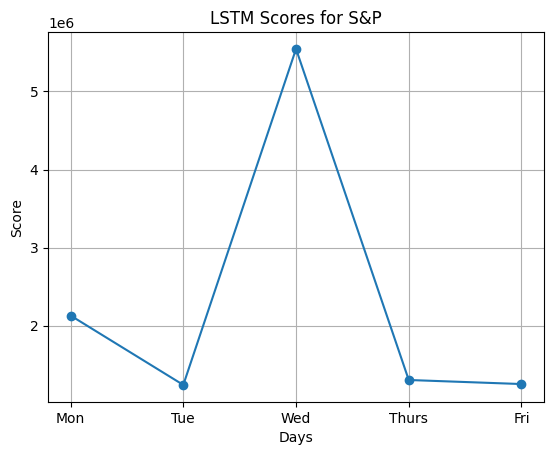

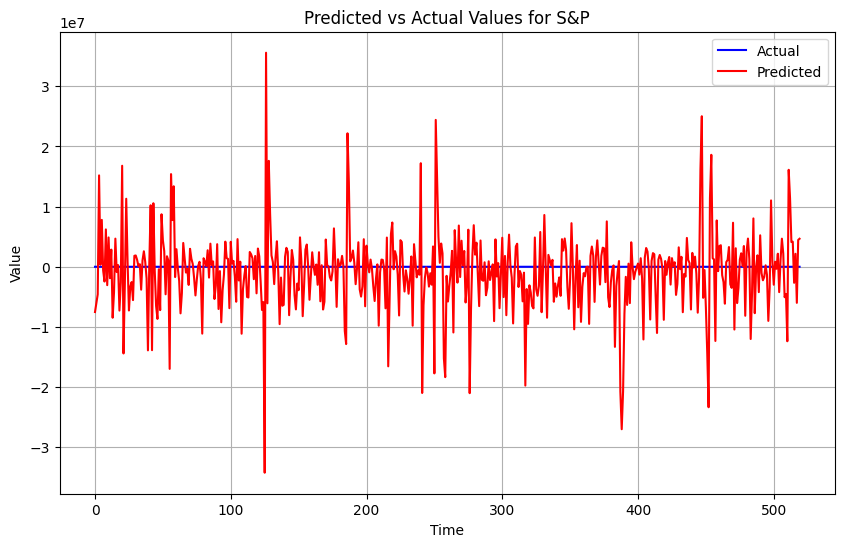

Evaluating model for Microsoft Corp
LSTM_MULTI-10 for Microsoft Corp: [13639.435] 6174.0, 13545.8, 14224.8, 9639.6, 20329.7
Time taken for evaluation: 95.17557787895203 seconds
Value of x for Microsoft Corp: 7257.89232421699


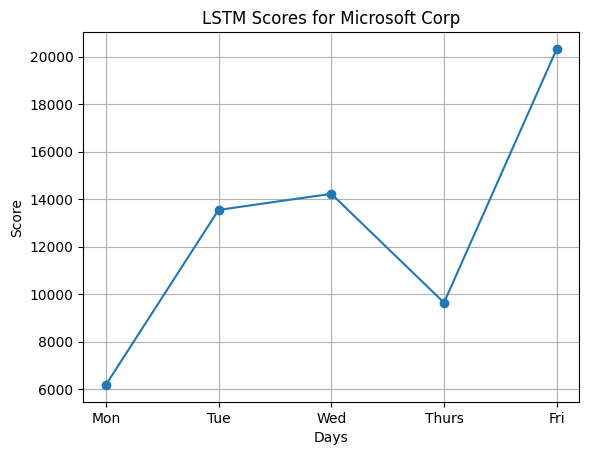

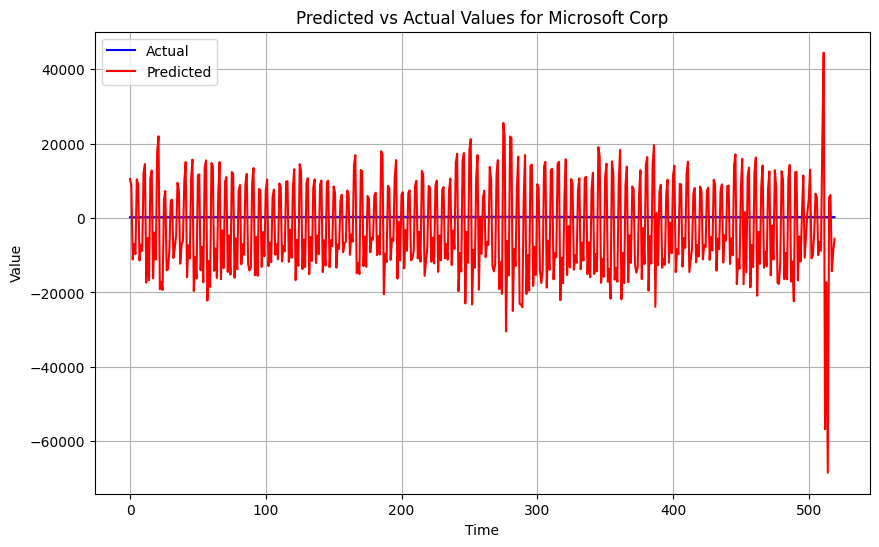

Evaluating model for Maruti Suzuki India Limited
LSTM_MULTI-10 for Maruti Suzuki India Limited: [1251.797] 937.9, 1048.7, 1445.4, 1681.5, 968.9
Time taken for evaluation: 93.48283648490906 seconds
Value of x for Maruti Suzuki India Limited: 17.302957639999427


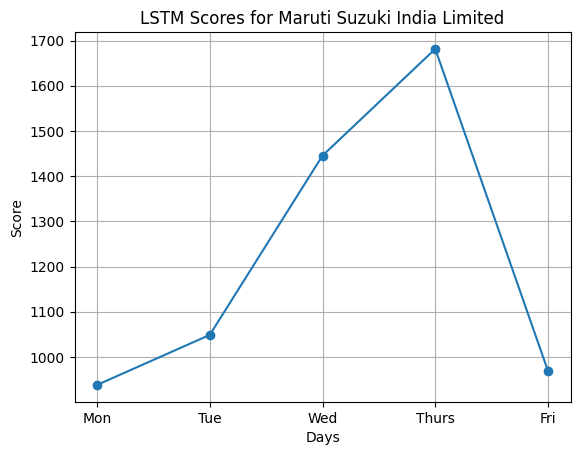

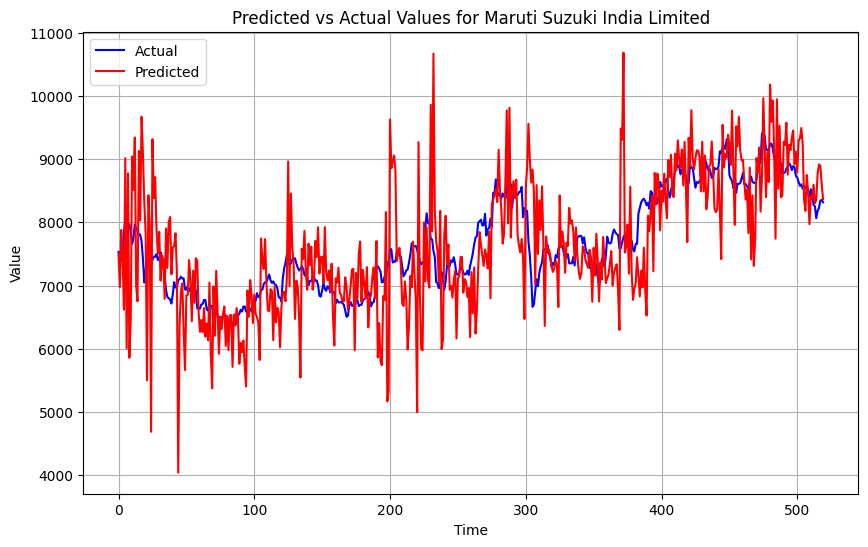

Evaluating model for Mahindra & Mahindra Limited
LSTM_MULTI-10 for Mahindra & Mahindra Limited: [4180.196] 6232.0, 3509.7, 3629.4, 3283.1, 3501.9
Time taken for evaluation: 59.00842547416687 seconds
Value of x for Mahindra & Mahindra Limited: 559.3574917637743


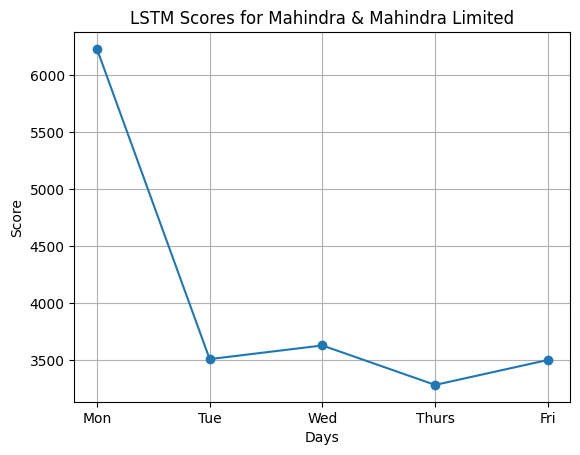

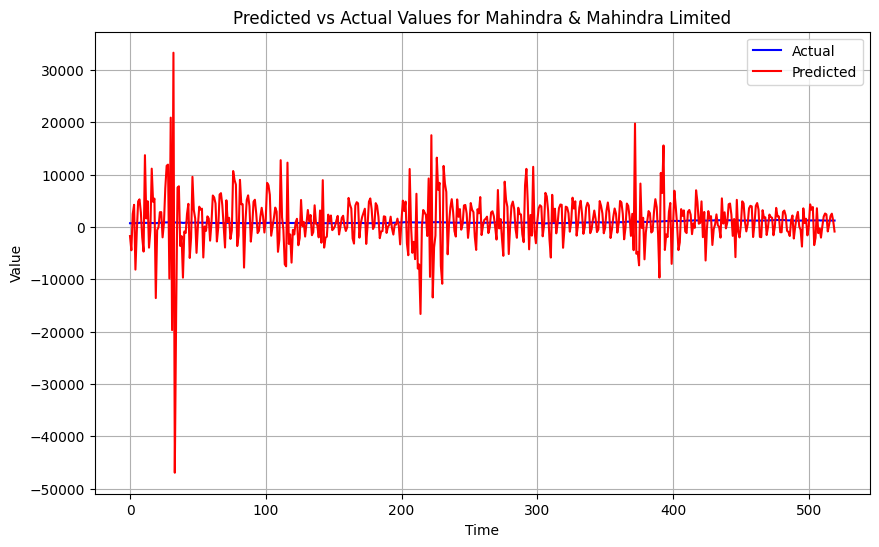

Evaluating model for JSW Steel Limited
LSTM_MULTI-10 for JSW Steel Limited: [7305.398] 5089.5, 4097.8, 11184.4, 3497.4, 9318.1
Time taken for evaluation: 92.84714818000793 seconds
Value of x for JSW Steel Limited: 1805.185231794579


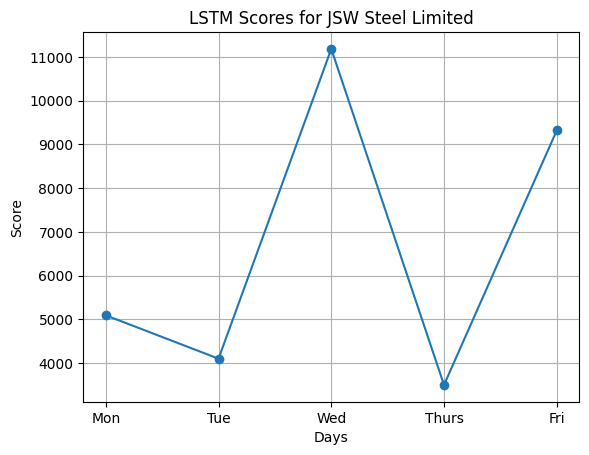

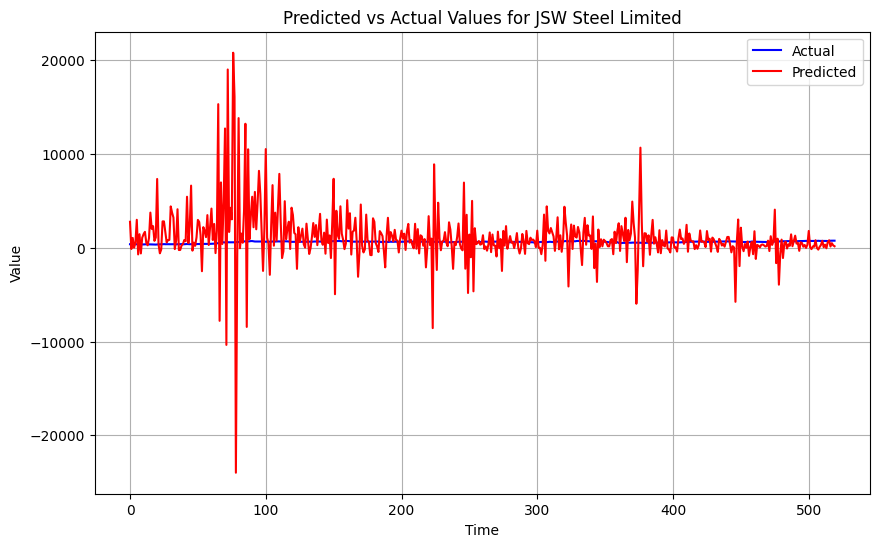

Evaluating model for Infosys Limited
LSTM_MULTI-10 for Infosys Limited: [3756.968] 1665.7, 2816.9, 2219.4, 2244.6, 7064.0
Time taken for evaluation: 59.18854260444641 seconds
Value of x for Infosys Limited: 375.8979863421852


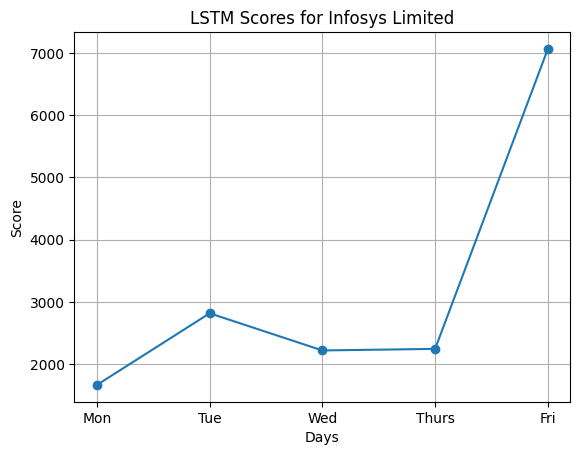

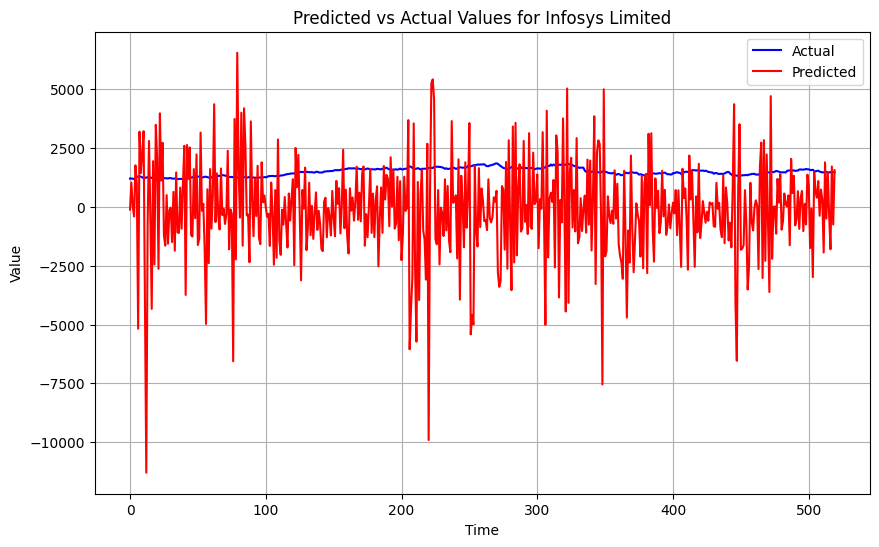

Evaluating model for ITC Limited
LSTM_MULTI-10 for ITC Limited: [25485.213] 18406.2, 16346.5, 22138.4, 43576.4, 15889.4
Time taken for evaluation: 92.94427514076233 seconds
Value of x for ITC Limited: 11767.869180810187


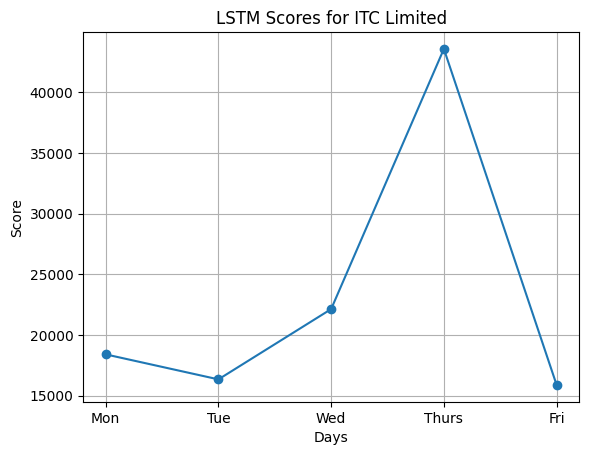

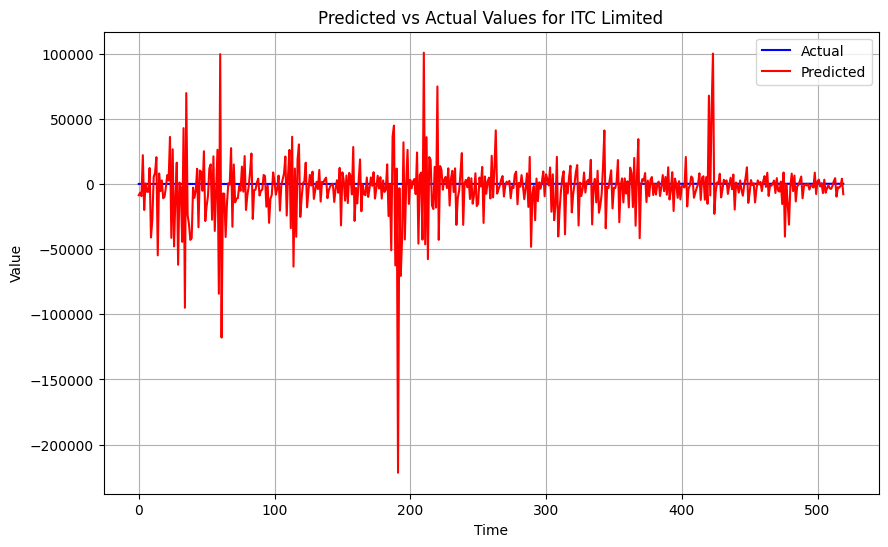

Evaluating model for Hindustan Unilever Ltd
LSTM_MULTI-10 for Hindustan Unilever Ltd: [2442.872] 2727.3, 3468.4, 1834.6, 1504.8, 2177.2
Time taken for evaluation: 91.59888625144958 seconds
Value of x for Hindustan Unilever Ltd: 123.82958286616382


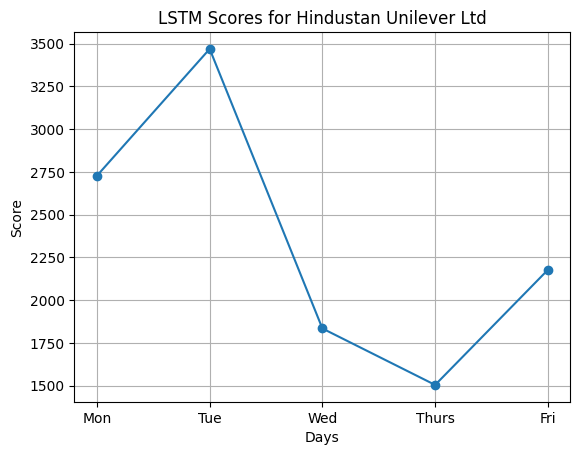

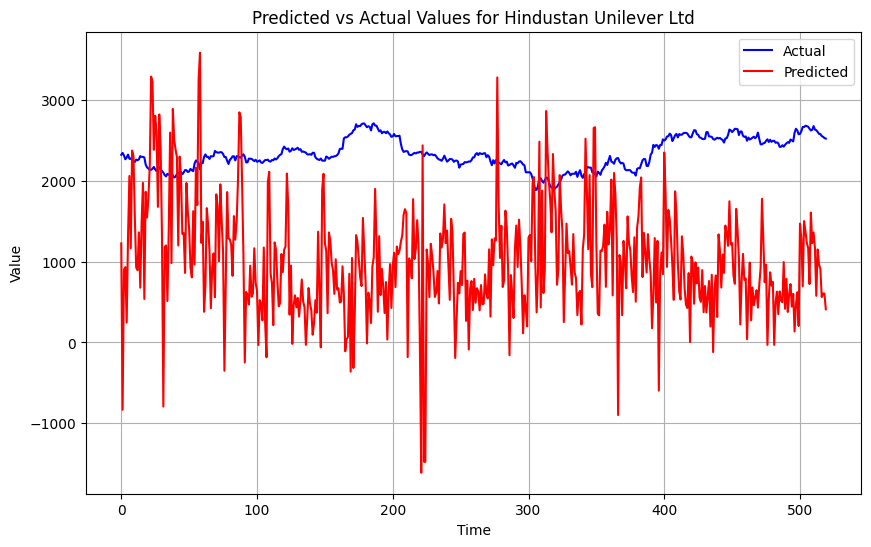

Evaluating model for HDFC Bank Limited
LSTM_MULTI-10 for HDFC Bank Limited: [5091.046] 5953.6, 4879.5, 6146.6, 4286.8, 3765.7
Time taken for evaluation: 95.13803672790527 seconds
Value of x for HDFC Bank Limited: 417.521330827759


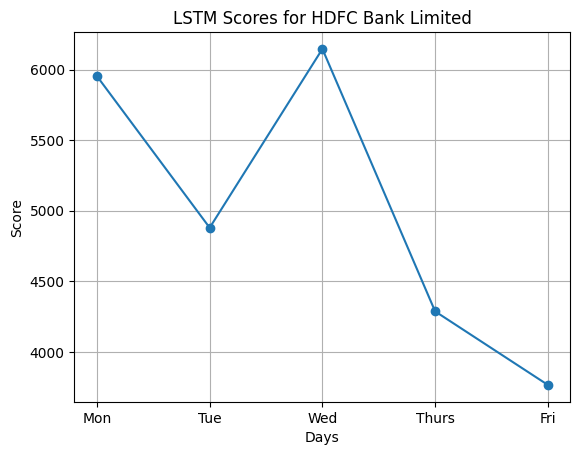

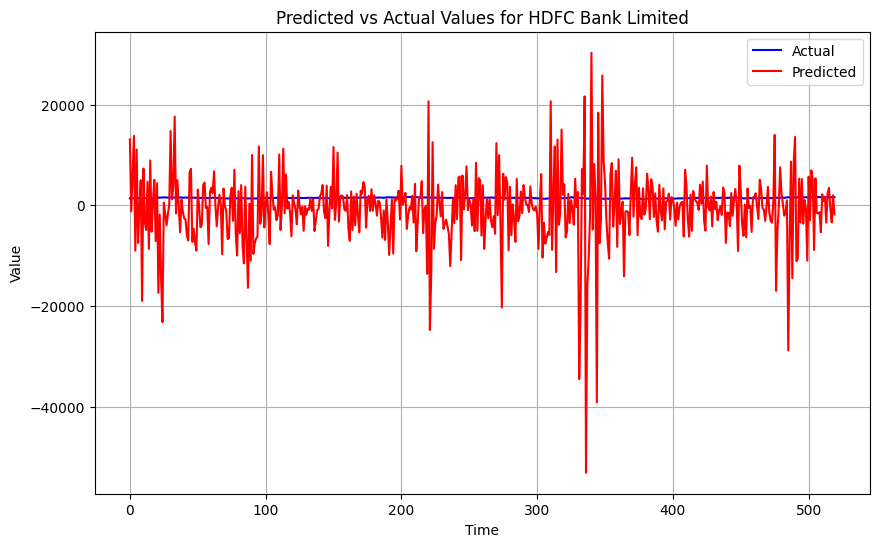

In [ ]:
n_input=10
import csv
# File path to save the results
csv_file_path = 'RESULTS_LSTM_MULTI_10.csv'

# Dictionary to store percentage values
percentage_values = {}

# Iterate through each dataset
for name, df in datasets.items():
    print(f"Evaluating model for {name}")

    # Split the dataset into train and test sets
    train, test = split_dataset(df.values)

    # Start time
    start = time.time()

    # Evaluate the model and plot the scores for LSTM
    score, scores = evaluate_model(train, test, n_input)

    # End time
    end = time.time()

    # Summarize scores
    summarize_scores(f'LSTM_MULTI-10 for {name}', score, scores)

    # Print the time taken for evaluation
    execution_time = end - start
    print(f"Time taken for evaluation: {execution_time} seconds")

    # Calculate and print the value of x
    mean_target = df["Close"].mean()
    rmse = score  # Assuming score is the average RMSE
    x = (rmse / mean_target) * 100
    print(f"Value of x for {name}: {x}")

    # Store the percentage value along with the dataset name
    percentage_values[name] = x

    # Write the evaluation results to CSV file
    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        if file.tell() == 0:
            writer.writerow(['Model', 'Dataset', 'Execution Time', 'Value of x', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Avg RMSE'])
        writer.writerow(['LSTM_MULTI-10', name, execution_time, x] + scores + [rmse])

    # Plot scores and save as PNG
    days = ['Mon', 'Tue', 'Wed', 'Thurs', 'Fri']
    plt.plot(days, scores, marker='o', label='LSTM')
    plt.title(f'LSTM Scores for {name}')
    plt.xlabel('Days')
    plt.ylabel('Score')
    plt.grid(True)
    plt.savefig(f'LSTM_MULTI-10_{name}.png', dpi=300)
    plt.show()

    # Plot predicted vs actual values and save as PNG
    score, scores, actuals, predictions = prediction_graph(train, test, n_input)
    plt.figure(figsize=(10, 6))
    plt.plot(actuals.flatten(), label='Actual', color='blue')
    plt.plot(predictions.flatten(), label='Predicted', color='red')
    plt.title(f'Predicted vs Actual Values for {name}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'Pre_vs_Act_LSTM_MULTI-10_{name}.png', dpi=300)
    plt.show()